# Running Analysis on Molecular Sim 
<br>

[Skeleton Functions](#Skeleton-Functions)

[Slice Analysis Functions](#Slice-Analysis-Functions)

[Color Map Functions](#Color-Map-Functions)

[Animation Function](#Animation-Function)

[Gaussian Function](#Gaussian-Function)

[Table Function](#Create-Table)

[User Section](#User-Section)
<br><br>
How to use : Make sure nhtot, nCO, nH1, nH2, nHP, tdust, and temp fits files are in same folder as code. Run all the cells until you reach the User Section. 

In [3]:
################################################
# 
# Imports
#
################################################

from skimage.morphology import flood    
import skimage.morphology as mo
from sklearn.neighbors import NearestNeighbors

from astropy.io import fits
from astropy.table import QTable
from astropy.io import ascii
from astropy import units as u
from astropy.modeling import models, fitting
from astropy.table import Table, hstack

from fil_finder import FilFinderPPP

import math

import numpy as np
from numpy import inf

import scipy
from scipy import interpolate
from scipy.interpolate import splprep, splev
from scipy.stats import binned_statistic
from scipy.optimize import curve_fit
from scipy.interpolate import RegularGridInterpolator
from scipy.spatial import distance

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.animation import PillowWriter
import matplotlib.backends.backend_pdf
import matplotlib.colors as mcolor
from matplotlib.colors import BoundaryNorm

import pyvista as pv

import glob

import networkx as nx

import warnings
warnings.filterwarnings('ignore')

# Skeleton Functions
<br>

In this section, the sim is first masked to a thresholded density, smoothed, and then skeletons are made from clouds. 

<br>
Includes : Sorting Function, Skeletonize Function 
<br><br>

After running : Returns a fits file of the thresholded data and the individual skeletons to be brought up in glue, a numpy array of each skeleton's cloud masses, and an array of just skeletons and their coordinates. 
<br><br>


File begginning = "thresholdedby_filedesignation_thresholdnumber_"

ex. nH2_x1465y1400z1400_50_thresholded_data.fits

ex. nH2_x1465y1400z1400_50_skeleton.fits

ex. nH2_x1465y1400z1400_50_masses.npy

ex. nH2_x1465y1400z1400_50_masses.npy

<br>

Note : The distance threshold (20 pc) for skeletons is hardcoded into the skeleton array. If your sims have different dimensionality please test out different lengths. 

In [4]:
################################################
# 
# Skeleton Functions
#
################################################

################################################
## Sorting Functiuon
################################################

# The skeleton (fil finder) returns an array that is ordered by z. This sorts by order
# INPUTS  : Skeleton coordinates (from skeletonize functon)
# OUTPUTS : Ordered skeleton and total distance (in pc) of skeleton

def sort_skeleton(skeleton_coords):
    
    z = skeleton_coords[0]
    y = skeleton_coords[1]
    x = skeleton_coords[2]
    
    # make the point list (N x 3)
    pts=np.vstack((z,y,x)).T

    # initiate the NN2 and the network graph
    try:
        clf = NearestNeighbors(2).fit(pts)
    except:
        clf = NearestNeighbors(n_neighbors = 2).fit(pts)    
    G = clf.kneighbors_graph()
    T = nx.from_scipy_sparse_matrix(G)

    # candidate paths based on the network graph
    paths = [list(nx.dfs_preorder_nodes(T, i)) for i in range(len(pts))]
    ## find the path with the lowest cost (distance) among the candidates
    minidx = np.argmin([np.sum(np.diagonal(distance.cdist(pts[path], pts[path]), offset = 1)) for path in paths])
    opt_order = paths[minidx]
    ## permute the head and the tail to find the correct order
    ### permutation
    opt_order_swaphead = list(opt_order)
    opt_order_swaphead[0], opt_order_swaphead[1] = opt_order_swaphead[1], opt_order_swaphead[0]
    opt_order_swaptail = list(opt_order)
    opt_order_swaptail[-1], opt_order_swaptail[-2] = opt_order_swaptail[-2], opt_order_swaptail[-1]
    ### find the correct order among the original and the two permuted
    paths_opt = [opt_order, opt_order_swaphead, opt_order_swaptail]
    minidx_opt = np.argmin([np.sum(np.diagonal(distance.cdist(pts[path], pts[path]), offset = 1)) for path in paths_opt])
    opt_order_final = paths_opt[minidx_opt]

    # return the ordered coordinates
    zz = z[opt_order_final]
    yy = y[opt_order_final]
    xx = x[opt_order_final]
    
    # Array to be returned in (z_array,y_array,x_array) format
    sorted_skeleton = [zz,yy,xx]
     
    # Returns array in (z,y,x) list format
    sorted_skeleton_coord = np.transpose(sorted_skeleton)
    
    # Calculate distance
    distances = []
    for m in range(len(sorted_skeleton_coord)-1): 
        distances.append(math.dist(sorted_skeleton_coord[m],sorted_skeleton_coord[m+1]))
    
    
    return sorted_skeleton, np.sum(distances)

################################################
# Skeletonize Function 
################################################

# INPUTS  :  file_name (string), threshold_level (int), ball size of mo.ball
# OUTPUTS :  Saves fits file with every skeleton in it, as well as other fits files and masses
#            Returns and saves skeletons array for splines and splices (next step)
def skeletonize(file_name,threshold_level,ball_size):
    
    # Constant to return how many skeletons were made, and their lengths and masses
    num_skeletons = 0
    length_of_skeletons = []
    mass_of_skeletons = []
    
    # Number of errors 
    error_num = 0
    
    # Load in data 
    data,header = fits.getdata(file_name,header=True)
    
    # Create interpolated nhtot for future masses
    z = np.linspace(0,data.shape[0]-1,data.shape[0])+0.5
    y = np.linspace(0,data.shape[1]-1,data.shape[1])+0.5
    x = np.linspace(0,data.shape[2]-1,data.shape[2])+0.5
    interpolate_data = RegularGridInterpolator((z,y,x), data, method = 'nearest',bounds_error=False, fill_value = 0)
    
    # Create empty array to hold the skeletons 
    skeleton_array = np.zeros(data.shape)
    
    # Create array just to hold each skeleton seperately 
    skeletons_for_splines = []
    
    # Create the masked data 
    thresholded_data = (data > threshold_level).astype(int)
    
    # Create list of 3d coordinates (i.e. converts three arrays to list of (x,y,z)'s)
    thresholded_data_coord = np.where(thresholded_data == 1)
    thresholded_data_coord_ordered = []
    
    for n in range(len(thresholded_data_coord[0])): 
        
        x = thresholded_data_coord[0][n]
        y = thresholded_data_coord[1][n]
        z = thresholded_data_coord[2][n]
        thresholded_data_coord_ordered.append([x,y,z])
        
    # Loop through each index of thresholded data coordinates 
    for n in range(len(thresholded_data_coord_ordered)):
        
        # Defines the (x,y,z)
        in_mask_point = (thresholded_data_coord_ordered[n][0], thresholded_data_coord_ordered[n][1], thresholded_data_coord_ordered[n][2])
        
        # Skip iteration if point is only 0s
        if(thresholded_data_coord_ordered[n][0] == 0 and 
          thresholded_data_coord_ordered[n][1] == 0 and
          thresholded_data_coord_ordered[n][2] == 0):
            continue 
        
        # Else, keep going 
        
        # Extract features around this point using flood 
        mask_interim = flood(thresholded_data,in_mask_point,tolerance=0).astype(int)
        
        # Remove masked points from thresholded_data_coord
        mask_interim_coord = np.where(mask_interim == 1) # Loads only points with values 
        mask_interim_coord_ordered = []
        
        # Same process as for thresholded data, converts 3 arrays to (x,y,z)'s
        for m in range(len(mask_interim_coord[0])): 
            x = mask_interim_coord[0][m]
            y = mask_interim_coord[1][m]
            z = mask_interim_coord[2][m]
            mask_interim_coord_ordered.append([x,y,z])
        
        # Gets a list of indices in threshold where they are equal 
        index_where_equal = []
        
        # Loops through each point and checks to see if there are any exact matches 
        # If there is, it records the index in thresholded data 
        for m in range(len(thresholded_data_coord_ordered)):
            for b in mask_interim_coord_ordered:
                if thresholded_data_coord_ordered[m] == b : 
                    index_where_equal.append(m)
       
        # Set all the points to 0 that match exactly with mask_interim
        for m in index_where_equal:
            thresholded_data_coord_ordered[m][0] = 0
            thresholded_data_coord_ordered[m][1] = 0
            thresholded_data_coord_ordered[m][2] = 0
        
        # Stop loop if there aren't enough points 
        if(len(mask_interim_coord[0])<100):
            continue
        
        # Continue with normal code 
        
        # Fill in small holes useing dilation and closing 
        selem = mo.ball(ball_size)
        mask_final = mo.dilation(mask_interim, selem)
        mask_final = mo.closing(mask_final)
        
        # Add a pad of 0s around the data array to avoid edge errors
        mask_final = np.pad(mask_final, ((1,1),(1,1),(1,1)), 'constant')
        
        # Skeletize a mask using filfinder
        data = mask_final
        
        fil = FilFinderPPP(data, mask=mask_final)
        fil.preprocess_image(skip_flatten=True)
        fil.create_skeleton(min_pixel=0)
        
        # Check for errors 
        try:
            fil.analyze_skeletons(test_print=0, branch_thresh=0 * u.pix, do_prune=True)
        except:
            error_num += 1
            continue
        
        # If no error, keep going
        fil.analyze_skeletons(test_print=0, branch_thresh=0 * u.pix, do_prune=True)
        skeleton  = fil.skeleton_longpath 
        
        # Sort Skeleton for distance function (only keep skeletons > 20 parsecs)
        skeleton_sorted = skeleton[1:-1,1:-1,1:-1]
        skeleton_sorted = np.where(skeleton_sorted==1)
        try:
            skeleton_sorted, distance = sort_skeleton(skeleton_sorted)
        except:
            distance=0
        
        # Only saves if a skeleton is above or equal to 20 pc 
        if distance >= 20: 
            
            # To print at the end
            num_skeletons += 1
            length_of_skeletons.append(distance)
            
            # Remove the pad 
            skeleton = skeleton[1:-1,1:-1,1:-1]
            
            # Where the skeleton exists
            x_pix, y_pix, z_pix = np.where(skeleton==1)
            
            # Setting those same values in the skeleton array
            skeleton_array[x_pix,y_pix,z_pix] = 1
            
            # Create the sorted skeleton
            skeleton_sorted = skeleton[1:-1,1:-1,1:-1]
            skeleton_sorted = np.where(skeleton_sorted==1)
            skeleton_sorted, distance = sort_skeleton(skeleton_sorted)
            
            # For splines and splice, each skeleton is saved in a new array 
            skeletons_for_splines.append((skeleton_sorted[0],skeleton_sorted[1],
                                          skeleton_sorted[2]))
            
            # Save each mass (uses thresholded masked data)
            # dM = m (g) * nhtot (cm^-3) * dV (pc^3=>cm^3) = g
            points = np.where(data==1)
            z = points[0]
            y = points[1]
            x = points[2]
    
            points = (z,y,x)
            points = np.transpose(points)
            
            pc_cubed = 2.93799895e55         #cm^3
            m = 2.34e-24                     #grams
            nhtot = interpolate_data(points) #cm^-3
            m_sun = 1.9891e33
            
            mass = np.nansum(nhtot*m*pc_cubed/m_sun) # solar masses
            
            mass_of_skeletons.append(mass)
            
    # Output for user
    print()
    print("Number of skeletons :", num_skeletons)
    print("Their lengths are :", length_of_skeletons)
    print("Their masses are :", mass_of_skeletons)
    print("Number of errors :", error_num)
    
    # Saving 
    file_name_to_save = file_name.removesuffix(".fits")
    file_name_to_save = file_name_to_save + "_" + str(threshold_level) + "_"
            
    # Note : If you want mask_interim and mask_final just comment out the below 
    fits.writeto(file_name_to_save + "thresholded_data.fits",thresholded_data,header,overwrite=True)
    #fits.writeto(file_name + "mask_interim.fits",mask_interim,header,overwrite=True)
    #fits.writeto(file_name + "mask_final.fits",mask_final,header,overwrite=True)
    fits.writeto(file_name_to_save + "skeleton.fits",skeleton_array,header,overwrite=True)
    
    # Save the seperate skeleton arrays and mass array 
    np.save(file_name_to_save + 'masses.npy', mass_of_skeletons)
    np.save(file_name_to_save + 'skeleton_array.npy', skeletons_for_splines)
    
    return skeletons_for_splines

# Slice Analysis Functions
<br>
In this section, the skeleton is turned into a linear spline and then 20 pc planes are created, cutting each point in the skeleton orthogonal to the direction of the skeleton. The different density and temperature maps are all interpolated to create smoother 3d maps. Then the radial density and temperatures around each point are averaged radially and binned. The binned radially averaged plots are outputted and saved for gaussian analysis step. 
<br><br>
Includes : Interpolating Function, Radial Density Function, Create Spline Function, Create Plane Function
<br><br>
After running : Saves three files for each skeleton. The medians are the medians of each bin (so the points to be fitted later), the scatters are all the points for each point (so the gray points in the later graphs), and the spline points are the coordinates for the skeleton's spline, which is to be used to get the cloud length later for the data table. 
<br><br>
Ex.

nH2_50_x1465y1400z1400_skeleton_0_medians.npy

nH2_50_x1465y1400z1400_skeleton_0_scatters.npy

nH2_50_x1465y1400z1400_0_SPLINE_POINTS.npy

## Shifting 

This is a new functionality that shifts the spine to the peak density in the mask. It also only analyzes core points that are above the threshold. 

TO DO : Save new splice points so it shows up in gifs right. 

In [5]:
################################################
## Slice Analysis Functions
################################################

################################################
# Interpolation Function
################################################
# INPUTS  : data, idesignation 
# OUTPUTS : all interpolation functions
def interpolating_functions(data, designation):
    
    # Make the pixel grid 
    z = np.linspace(0,data.shape[0]-1,data.shape[0])+0.5
    y = np.linspace(0,data.shape[1]-1,data.shape[1])+0.5
    x = np.linspace(0,data.shape[2]-1,data.shape[2])+0.5
    
    # Getting all the data (nhtot is just data)
    nCO_file_name = 'nCO_' + designation + '.fits'
    nCO_data, nCO_header = fits.getdata(nCO_file_name,header=True)
    nH1_file_name = 'nH1_' + designation + '.fits'
    nH1_data, nH1_header = fits.getdata(nH1_file_name,header=True)
    nH2_file_name = 'nH2_' + designation + '.fits'
    nH2_data, nH2_header = fits.getdata(nH2_file_name,header=True)
    nHP_file_name = 'nHP_' + designation + '.fits'
    nHP_data, nHP_header = fits.getdata(nHP_file_name,header=True)
    t_dust_file_name = 'tdust_fits_' + designation + '.fits'
    t_dust_data, t_dust_header = fits.getdata(t_dust_file_name,header=True)
    temp_file_name = 'temp_fits_' + designation + '.fits'
    temp_data, temp_header = fits.getdata(temp_file_name,header=True)
    
    # Interpolate 
    
    interpolate_data = RegularGridInterpolator((z,y,x), data, method = 'nearest',bounds_error=False, fill_value = 0)
    interpolate_nCO_data = RegularGridInterpolator((z,y,x),nCO_data, method = 'nearest',bounds_error=False, fill_value = 0)
    interpolate_nH1_data = RegularGridInterpolator((z,y,x),nH1_data, method = 'nearest',bounds_error=False, fill_value = 0)
    interpolate_nH2_data = RegularGridInterpolator((z,y,x),nH2_data, method = 'nearest',bounds_error=False, fill_value = 0)
    interpolate_nHP_data = RegularGridInterpolator((z,y,x),nHP_data, method = 'nearest',bounds_error=False, fill_value = 0)
    interpolate_t_dust_data = RegularGridInterpolator((z,y,x),t_dust_data, method = 'nearest',bounds_error=False, fill_value = 0)
    interpolate_temp_data = RegularGridInterpolator((z,y,x),temp_data, method = 'nearest',bounds_error=False, fill_value = 0)
    
    interpolate_array = [interpolate_data,interpolate_nCO_data,interpolate_nH1_data,
                        interpolate_nH2_data,interpolate_nHP_data,interpolate_t_dust_data,
                        interpolate_temp_data]
    
    return interpolate_array

################################################
# Radial density function
################################################
# INPUTS  : extract_z, extract_y, extract_x, data, new_points, index, designation, interpolate array 
#           shift (True or False), core_check (True or False)
# OUTPUTS : plots radial density vs density, returns medians to put into array of medians
#.          also outputs edges. 
def radial_density(extract_z, extract_y, extract_x, data, new_points, index, 
                   designation, interpolate_array, shift):
    
    # Getting all the data (nhtot is just data)
    nCO_file_name = 'nCO_' + designation + '.fits'
    nCO_data, nCO_header = fits.getdata(nCO_file_name,header=True)
    nH1_file_name = 'nH1_' + designation + '.fits'
    nH1_data, nH1_header = fits.getdata(nH1_file_name,header=True)
    nH2_file_name = 'nH2_' + designation + '.fits'
    nH2_data, nH2_header = fits.getdata(nH2_file_name,header=True)
    nHP_file_name = 'nHP_' + designation + '.fits'
    nHP_data, nHP_header = fits.getdata(nHP_file_name,header=True)
    t_dust_file_name = 'tdust_fits_' + designation + '.fits'
    t_dust_data, t_dust_header = fits.getdata(t_dust_file_name,header=True)
    temp_file_name = 'temp_fits_' + designation + '.fits'
    temp_data, temp_header = fits.getdata(temp_file_name,header=True)
    
    # Grab the interpolating functions
    interpolate_data = interpolate_array[0]
    interpolate_nCO_data = interpolate_array[1]
    interpolate_nH1_data = interpolate_array[2]
    interpolate_nH2_data = interpolate_array[3]
    interpolate_nHP_data = interpolate_array[4]
    interpolate_t_dust_data = interpolate_array[5]
    interpolate_temp_data = interpolate_array[6]
    
    # Convert z,y,x to an array that interpolate can actually use 
    points_array = np.array([extract_z,extract_y,extract_x])
    points_array = np.transpose(points_array)
    
    # Make radial density and density arrays 
    
    densities = interpolate_data(points_array)
    nCO = interpolate_nCO_data(points_array)
    nH1 = interpolate_nH1_data(points_array)
    nH2 = interpolate_nH2_data(points_array)
    nHP = interpolate_nHP_data(points_array)
    t_dust = interpolate_t_dust_data(points_array)
    temp = interpolate_temp_data(points_array)
    radial_distance_array = []
    
    point_on_spline = (new_points[0][index],new_points[1][index],new_points[2][index])
    
    # Shifting 
    # Ok after this point you have the point on the spline. We need to check to 
    # see if its the peak density is closer 
    # This function does one point on the spline at a time, so no need to loop over every point
    
    if shift == True:
        densities_in_5_pc_neighborhood = []
        # Find all the peak densities in the area of the spline.
        # Extract z,y,x are the coordinates of the 'slice'
        for n in range(len(extract_z)):
            radial_distance = math.dist(point_on_spline,(extract_z[n],extract_y[n],extract_x[n]))
            
            if radial_distance <= 5:
                densities_in_5_pc_neighborhood.append([radial_distance,
                                                      extract_z[n],extract_y[n],extract_x[n],
                                                        densities[n]])
        # Now find the max in that array 
        densities_in_5_pc_neighborhood = np.array(densities_in_5_pc_neighborhood)
        radial_distance_only = densities_in_5_pc_neighborhood.T[0]
        z_only = densities_in_5_pc_neighborhood.T[1]
        y_only = densities_in_5_pc_neighborhood.T[2]
        x_only = densities_in_5_pc_neighborhood.T[3]
        densities_only = densities_in_5_pc_neighborhood.T[4]
        
        max_density_index = np.argmax(densities_only)
        new_spline_point = (z_only[max_density_index],y_only[max_density_index],x_only[max_density_index])
        print('New Spline Point =', new_spline_point )
        print('Max density in 5 pc =', densities_only[max_density_index])
        print()
        
        # Print old density 
        spline_point_index = np.argmin(radial_distance_only)
        print('Old Spline Point =', point_on_spline)
        print('Density = ', densities_only[spline_point_index])
        print()
        
        # Redefine point on spine 
        point_on_spline = new_spline_point
                
        
                
    # Now we make the slices 
    for n in range(len(extract_z)):
        radial_distance = math.dist(point_on_spline,(extract_z[n],extract_y[n],extract_x[n]))
        
        if radial_distance <= 20:
            radial_distance_array.append([radial_distance,
                                          extract_z[n],extract_y[n],extract_x[n],
                                          densities[n],
                                          nCO[n],nH1[n],nH2[n],nHP[n],t_dust[n],temp[n]])
    
    
    # Add the origin point (i.e. the point on spline) manually 
    radial_distance_array.append([0,point_on_spline[0],point_on_spline[1],point_on_spline[2],
                                 interpolate_data(point_on_spline),
                                 interpolate_nCO_data(point_on_spline),
                                 interpolate_nH1_data(point_on_spline),
                                 interpolate_nH2_data(point_on_spline),
                                 interpolate_nHP_data(point_on_spline),
                                 interpolate_t_dust_data(point_on_spline),
                                 interpolate_temp_data(point_on_spline)])
    
    # Check for errors
    if radial_distance_array == []:
        print('Radial array is empty')
        return  
    
    # If none, continue
    radial_distance_array_T = np.transpose(radial_distance_array)
    x = radial_distance_array_T[0]
    y_nhtot = radial_distance_array_T[4]
    y_nco = radial_distance_array_T[5]
    y_nh1 = radial_distance_array_T[6]
    y_nh2 = radial_distance_array_T[7]
    y_nhp = radial_distance_array_T[8]
    y_tdust = radial_distance_array_T[9]
    y_temp = radial_distance_array_T[10]
        
    
    # Bin Stuff 
    bins = [0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7.5,8,8.5,9,9.5,10,
           10.5,11,11.5,12,12.5,13,13.5,14,14.5,15,15.5,16,16.5,17,17.5,18,
           18.5,19,19.5,20]
    
    # Creating the bins (medians along radius )
    s_nhtot, edges, _ = binned_statistic(x,y_nhtot, statistic=np.nanmedian, bins = bins)
    s_nco, edges, _ = binned_statistic(x,y_nco, statistic=np.nanmedian, bins = bins)
    s_nh1, edges, _ = binned_statistic(x,y_nh1, statistic=np.nanmedian, bins = bins)
    s_nh2, edges, _ = binned_statistic(x,y_nh2, statistic=np.nanmedian, bins = bins)
    s_nhp, edges, _ = binned_statistic(x,y_nhp, statistic=np.nanmedian, bins = bins)
    s_tdust, edges, _ = binned_statistic(x,y_tdust, statistic=np.nanmedian, bins = bins)
    s_temp, edges, _ = binned_statistic(x,y_temp, statistic=np.nanmedian, bins = bins)
    
    return s_nhtot,s_nco,s_nh1,s_nh2,s_nhp,s_tdust,s_temp,edges, point_on_spline

################################################
# Create Spline Function
################################################
# INPUTS  : skeleton data, k order for spline
# OUTPUTS : Returns new_points (3 column array)
#.          Also returns derivative. Spline saved in next step
def create_spline(skeleton,k_num):

    # In this version of the code, np.where(skeleton == 1) done already so 
    skeleton_coordinates = skeleton
    z_pix = skeleton_coordinates[0]
    y_pix = skeleton_coordinates[1]
    x_pix = skeleton_coordinates[2]
    
    # Create the spline
    tck, u = interpolate.splprep([z_pix,y_pix,x_pix], k=k_num, nest=-1)
    new_points = splev(u, tck)
    derivatives = splev(u, tck, der=1)
    
    return new_points, derivatives
    
    
################################################
# Create Plane Function
################################################
# INPUTS  : skeleton data, order number, 
#          shape of data, data (nhtot)
#          designation = x1465y1390z1395
#.         skeleton index number for file writing
# OUTPUTS : Radial Distance vs Everything Graphs 
def create_plane(skeleton,k_num,data_shape,data,designation,skeleton_index,
                 sort_plus_threshold_name, 
                 shift):
    
    # Creating list of radial densities to make a final plot 
    radial_nhtot_medians = []
    radial_nco_medians = []
    radial_nh1_medians = []
    radial_nh2_medians = []
    radial_nhp_medians = []
    radial_tdust_medians = []
    radial_temp_medians = []
    
    # Save spline points for length 
    SPLINE_POINTS = []
    
    #Create interpolation functions 
    interpolate_array = interpolating_functions(data, designation)
    
    new_points,derivatives = create_spline(skeleton,k_num)
    
    # Just to keep track of progress
    print('Number of points in spline :',len(new_points[0]))
    print()
    
    # Making list of points for saving and looping 
    splice_points = [new_points[0], new_points[1], new_points[2]]
    
    point = []

    for n in range(len(splice_points[0])):
        point.append([splice_points[0][n],splice_points[1][n],splice_points[2][n]])
    
    # Making the normals for each point
    normal = []  
    
    # Dr. Zucker's code (-1, -dy/dx, -dz/dx)
    for n in range (len(derivatives[0])):
        slope_x = -1./(derivatives[0][n]/derivatives[2][n])
        slope_y = -1./(derivatives[0][n]/derivatives[1][n])
        normal.append([-1,slope_y,slope_x])
    
    # For saving the normals 
    x_normal = []
    y_normal = []
    z_normal = []

    for n in range(len(normal)):
        
        norm = np.sqrt(normal[n][0]**2 + normal[n][1]**2 + normal[n][2]**2) # normalized
        norm = 1
        z_normal.append(normal[n][0]/norm)
        y_normal.append(normal[n][1]/norm)
        x_normal.append(normal[n][2]/norm)

    normal_vectors = [z_normal, y_normal, x_normal]
    
    # Making the splice
    grid = pv.UniformGrid()
    grid.dimensions = data_shape
    grid.origin = (0, 0, 0)  
    grid.spacing = (1, 1, 1)  
    
    shifted_points = []
    
    for n in range(len(point)):
        
        # 'Progress' bar
        print(n)
        single_slice = grid.slice(origin=point[n], normal=normal[n])

        extract_z = single_slice.points[:,0]
        extract_y = single_slice.points[:,1]
        extract_x = single_slice.points[:,2] 
        
        
        # Radial density graph 
        s_nhtot,s_nco,s_nh1, s_nh2,s_nhp,s_tdust,s_temp,edges, point_on_spline = radial_density(extract_z, extract_y, 
                                                                          extract_x, data, new_points, 
                                                                          n, designation,interpolate_array,
                                                                          shift)
        shifted_points.append(point_on_spline)
        
        radial_nhtot_medians.append(s_nhtot)
        radial_nco_medians.append(s_nco)
        radial_nh1_medians.append(s_nh1)
        radial_nh2_medians.append(s_nh2)
        radial_nhp_medians.append(s_nhp)
        radial_tdust_medians.append(s_tdust)
        radial_temp_medians.append(s_temp)
        
    shifted_points_temp = np.array(shifted_points).T
    
    shifted_points_right_format = []
    for n in range(len(shifted_points_temp)):
        shifted_points_right_format.append(np.array(shifted_points_temp[n]))
    
    shifted_points = shifted_points_right_format
    
    # Printing out medians of all radial graphs 
    radial_nhtot_medians_stack = np.transpose(radial_nhtot_medians)
    radial_nco_medians_stack = np.transpose(radial_nco_medians)
    radial_nh1_medians_stack = np.transpose(radial_nh1_medians)
    radial_nh2_medians_stack = np.transpose(radial_nh2_medians)
    radial_nhp_medians_stack = np.transpose(radial_nhp_medians)
    radial_tdust_medians_stack = np.transpose(radial_tdust_medians)
    radial_temp_medians_stack = np.transpose(radial_temp_medians)
    
    # Just to loop through and plot the results (not saved)
    medians_stack = [radial_nhtot_medians_stack,radial_nco_medians_stack,
                     radial_nh1_medians_stack, radial_nh2_medians_stack,
                     radial_nhp_medians_stack,radial_tdust_medians_stack,
                     radial_temp_medians_stack]
    
    plot_names = ['nhtot','nco','nh1','nh2','nhp','tdust','temp']
    plot_units = [' (cm^-3)',' (cm^-3)',' (cm^-3)',' (cm^-3)',' (cm^-3)',' (K)',' (K)']
    name_counter = 0
    
    diff = np.diff(edges)[0]
    
    for radial_density_medians_stack in medians_stack:
        
        fig, ax = plt.subplots()
    
        for n in range(len(radial_density_medians_stack)):
            x = []
            for m in range(len(radial_density_medians_stack[n])):
                x.append(edges[n]+diff/2)
            ax.scatter(x, radial_density_medians_stack[n], c="limegreen", zorder=3)
    
        medians_of_medians = np.nanmedian(radial_density_medians_stack,axis=1)
        ax.scatter(edges[:-1]+np.diff(edges)/2, medians_of_medians, c="blue", zorder=3)
    
        fig.set_size_inches(18.5, 10.5)
        plt.title("Median " + plot_names[name_counter] + plot_units[name_counter] + 
                  " vs. Radial Distance (pc)")
        plt.xlabel("Radial Distance (pc)")
        plt.ylabel(plot_names[name_counter] + plot_units[name_counter])
        plt.show()
        
        name_counter +=1
        
    # Plotting all the medians on one graph at the end 
    medians_nhtot = np.nanmedian(radial_nhtot_medians_stack,axis=1)
    medians_nco = np.nanmedian(radial_nco_medians_stack,axis=1)
    medians_nh1 = np.nanmedian(radial_nh1_medians_stack,axis=1)
    medians_nh2 = np.nanmedian(radial_nh2_medians_stack,axis=1)
    medians_nhp = np.nanmedian(radial_nhp_medians_stack,axis=1)
    medians_tdust = np.nanmedian(radial_tdust_medians_stack,axis=1)
    medians_temp = np.nanmedian(radial_temp_medians_stack,axis=1)
    
    fig, ax = plt.subplots()
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nhtot, c="black", label = "NHTOT")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nco, c="red", label = "NCO")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nh1, c="orange", label = "NH1")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nh2, c="green", label = "NH2")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nhp, c="blue", label = "NHP")
    leg = ax.legend()
    plt.title("All Densities Compared")
    plt.ylabel("cm^-3")
    plt.xlabel("Radial Distance (pc)")
    plt.show()
    
    fig, ax = plt.subplots()
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nco, c="red", label = "NCO")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nh1, c="orange", label = "NH1")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nh2, c="green", label = "NH2")
    ax.scatter(edges[:-1]+np.diff(edges)/2, medians_nhp, c="blue", label = "NHP")
    leg = ax.legend()
    plt.title("NCO/NH2/NHP Compared")
    plt.ylabel("cm^-3")
    plt.xlabel("Radial Distance (pc)")
    plt.show()
    
    print("NHTOT")
    print(medians_nhtot)
    print("NHI + NHP + 2*NH2")
    print(medians_nh1+medians_nhp+(2*medians_nh2))
    
    # Save scatter plots
    medians_stack = [radial_nhtot_medians_stack,radial_nco_medians_stack,
                     radial_nh2_medians_stack, radial_nh1_medians_stack,
                     radial_nhp_medians_stack,radial_tdust_medians_stack,
                     radial_temp_medians_stack]
    
    # Switch nh2 and nh1 (for data table step)
    file_name_to_save = sort_plus_threshold_name + designation + '_skeleton_' + str(skeleton_index) + '_scatters.npy'
    np.save(file_name_to_save, medians_stack)
    
    # Save medians of medians
    medians = [edges,medians_nhtot,medians_nco,medians_nh2,medians_nh1,medians_nhp,
              medians_tdust,medians_temp]
    file_name_to_save = sort_plus_threshold_name + designation + '_skeleton_' + str(skeleton_index) + '_medians.npy'
    
    np.save(file_name_to_save, medians)
    
    # Save spline points for length 
    if shift == False:
        save_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_SPLINE_POINTS.npy"
        np.save(save_string,new_points)
    if shift == True:
        save_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_SPLINE_POINTS.npy"
        np.save(save_string,shifted_points)

# Color Map Functions
<br>
In this section, instead of averaging over the radius and binning the medians for all points in a slice, circular plots of each slice are made and saved. This is to be used later to create the gifs. 
<br><br>
Includes : Create Spline Function (for colormaps), Create Plane Function (for colormaps), and Color Maps Function
<br><br>
After Running : Returns to .npy files for each skeleton. One is the COLOR_SPLINE_POINTS file which is the coordinates of the spline. This is used to display coordinates in the gifs. Then the COLORMAPS_ARRAY.npy is the actual data for each points along the spline. This file stores the data to be animated. 
<br><br>
Ex. 

nH2_50_x1465y1400z1400_0_COLOR_SPLINE_POINTS.npy
nH2_50_x1465y1400z1400_0_COLORMAPS_ARRAY.npy

In [6]:
################################################
## Splice Analysis (for color map)
################################################

# The only difference is that these only do one plane and spline, instead of them all

# Creates the spline from skeleton data 
# INPUTS  : skeleton data, k order for spline
# OUTPUTS : Returns new_points (3 column array)
#.          Also returns derivative. Spline saved in next step
def create_spline_color(skeleton,k_num):

    #skeleton_coordinates = np.where(skeleton == 1)
    skeleton_coordinates = skeleton
    z_pix = skeleton_coordinates[0]
    y_pix = skeleton_coordinates[1]
    x_pix = skeleton_coordinates[2]

    tck, u = interpolate.splprep([z_pix,y_pix,x_pix], k=k_num, nest=-1)
    new_points = splev(u, tck)
    derivatives = splev(u, tck, der=1)
    
    return new_points, derivatives
        
# Does the above but takes in the point number
# INPUTS  : skeleton data, order number, 
#          shape of data, point for analaysis, new_points, and derivatives
# OUTPUTS : Saves spline with vectors and plane
#.          returns spline and slice to figure out radial distance
def create_plane_color(skeleton,k_num,data_shape,point_number,new_points,derivatives):

    #new_points,derivatives = create_spline(skeleton,k_num)
    
    #print('Number of points in spline :',len(new_points[0]))
    
    splice_points = [new_points[0], new_points[1], new_points[2]]
    
    point = []

    for n in range(len(splice_points[0])):
        point.append([splice_points[0][n],splice_points[1][n],splice_points[2][n]])
    
    normal = []  
    
    # Dr. Zucker's code (-1, -dy/dx, -dz/dx)
    for n in range (len(derivatives[0])):
        slope_x = -1./(derivatives[0][n]/derivatives[2][n])
        slope_y = -1./(derivatives[0][n]/derivatives[1][n])
        normal.append([-1,slope_y,slope_x])
    
    # For saving only 
    x_normal = []
    y_normal = []
    z_normal = []

    for n in range(len(normal)):
        
        norm = np.sqrt(normal[n][0]**2 + normal[n][1]**2 + normal[n][2]**2) # normalized
        norm = 1
        z_normal.append(normal[n][0]/norm)
        y_normal.append(normal[n][1]/norm)
        x_normal.append(normal[n][2]/norm)

    normal_vectors = [z_normal, y_normal, x_normal]
    
    # This part in reality should be a seperate funtion since whole line is calculated
    grid = pv.UniformGrid()
    grid.dimensions = data_shape
    grid.origin = (0, 0, 0)  
    grid.spacing = (1, 1, 1)  

    #print('Point',point[point_number])
    #print('Normal Vector',normal[point_number])
    single_slice = grid.slice(origin=point[point_number], normal=normal[point_number])
    
    # If you ever want to see an individual plane in glue, un comment these 
    
    #extract_z = single_slice.points[:,0]
    #extract_y = single_slice.points[:,1]
    #extract_x = single_slice.points[:,2]

    #t = QTable([new_points[0], new_points[1], new_points[2], 
    #       normal_vectors[0], normal_vectors[1], normal_vectors[2]], 
    #           names=('z', 'y', 'x','dz', 'dy', 'dx'))
   
    #ascii.write(t, 'spline_w_vectors.dat', overwrite=True)  

    #t = QTable([extract_z, extract_y, extract_x],
    #           names=('z', 'y', 'x'))
    #ascii.write(t, 'spline_plane.dat', overwrite=True)
    
    return new_points,single_slice,normal[point_number]
    

In [7]:
################################################
## Color Map Slice Function
################################################

# Creates the color maps for everyy point in a spline 
# INPUTS  : file name (str), sim_skeletons (arr of skeletons), skeleton index (int)
#.          designation (ex 'x1465y1390z1395'), shift = True or False
# OUTPUTS : Color Maps for every point, saves for animation 

def color_maps(file_name,sim_skeletons,skeleton_index,designation,sort_plus_threshold_name,shift):

    COLORMAPS_ARRAY = []
    COLORMAPS_LOG_ARRAY = []
    SPLINE_POINTS = []
    
    data,header = fits.getdata(file_name,header=True)
    data_shape = data.shape

    nCO_file_name = 'nCO_' + designation + '.fits'
    nCO_data, nCO_header = fits.getdata(nCO_file_name,header=True)
    nH1_file_name = 'nH1_' + designation + '.fits'
    nH1_data, nH1_header = fits.getdata(nH1_file_name,header=True)
    nH2_file_name = 'nH2_' + designation + '.fits'
    nH2_data, nH2_header = fits.getdata(nH2_file_name,header=True)
    nHP_file_name = 'nHP_' + designation + '.fits'
    nHP_data, nHP_header = fits.getdata(nHP_file_name,header=True)
    t_dust_file_name = 'tdust_fits_' + designation + '.fits'
    t_dust_data, t_dust_header = fits.getdata(t_dust_file_name,header=True)
    temp_file_name = 'temp_fits_' + designation + '.fits'
    temp_data, temp_header = fits.getdata(temp_file_name,header=True)

    k_num = 1

    skeleton = sim_skeletons[skeleton_index]

    new_points,derivatives = create_spline_color(skeleton,k_num)
    
    interpolate_array = interpolating_functions(data, designation)
    
    print('Number of points in spline :',len(new_points[0]))
    
    shifted_points = []

    for n in range(len(new_points[0])):
    
        print(n)
        point_number = n

        # New points = spline 
        # slice = plane 
        new_points,single_slice,normal = create_plane_color(skeleton,k_num,data_shape,point_number,new_points,derivatives)
    
        # Getting radial density array 

        extract_z = single_slice.points[:,0]
        extract_y = single_slice.points[:,1]
        extract_x = single_slice.points[:,2]
        
        # Interpolation 
        # Grab the interpolating functions
        interpolate_data = interpolate_array[0]
        interpolate_nCO_data = interpolate_array[1]
        interpolate_nH1_data = interpolate_array[2]
        interpolate_nH2_data = interpolate_array[3]
        interpolate_nHP_data = interpolate_array[4]
        interpolate_t_dust_data = interpolate_array[5]
        interpolate_temp_data = interpolate_array[6]
    
        # Convert z,y,x to an array that interpolate can actually use 
        points_array = np.array([extract_z,extract_y,extract_x])
        points_array = np.transpose(points_array)
    
        # Make radial density and density arrays 
    
        densities = interpolate_data(points_array)
        nCO = interpolate_nCO_data(points_array)
        nH1 = interpolate_nH1_data(points_array)
        nH2 = interpolate_nH2_data(points_array)
        nHP = interpolate_nHP_data(points_array)
        t_dust = interpolate_t_dust_data(points_array)
        temp = interpolate_temp_data(points_array)
        radial_distance_array = []

        # Each element is a tuple (distance (pixels), z, y, x)
        radial_distance_array = []
        extract_z_array = [] # So that you can graph using non int numbers 
        extract_y_array = []
        extract_x_array = []

        point_on_spline = (new_points[0][point_number],new_points[1][point_number],new_points[2][point_number])

        if shift == True:
            densities_in_5_pc_neighborhood = []
            # Find all the peak densities in the area of the spline.
            # Extract z,y,x are the coordinates of the 'slice'
            for n in range(len(extract_z)):
                radial_distance = math.dist(point_on_spline,(extract_z[n],extract_y[n],extract_x[n]))

                if radial_distance <= 5:
                    densities_in_5_pc_neighborhood.append([radial_distance,
                                                          extract_z[n],extract_y[n],extract_x[n],
                                                            densities[n]])
            # Now find the max in that array 
            densities_in_5_pc_neighborhood = np.array(densities_in_5_pc_neighborhood)
            radial_distance_only = densities_in_5_pc_neighborhood.T[0]
            z_only = densities_in_5_pc_neighborhood.T[1]
            y_only = densities_in_5_pc_neighborhood.T[2]
            x_only = densities_in_5_pc_neighborhood.T[3]
            densities_only = densities_in_5_pc_neighborhood.T[4]

            max_density_index = np.argmax(densities_only)
            new_spline_point = (z_only[max_density_index],y_only[max_density_index],x_only[max_density_index])
            print('New Spline Point =', new_spline_point )
            print('Max density in 5 pc =', densities_only[max_density_index])
            print()

            # Print old density 
            spline_point_index = np.argmin(radial_distance_only)
            print('Old Spline Point =', point_on_spline)
            print('Density = ', densities_only[spline_point_index])
            print()

            # Redefine point on spine 
            point_on_spline = new_spline_point
            shifted_points.append(point_on_spline)
        
        for n in range(len(extract_z)):
    
            radial_distance = math.dist(point_on_spline,(extract_z[n],extract_y[n],extract_x[n]))
    
            if radial_distance <= 20:
                radial_distance_array.append([radial_distance,
                                              extract_z[n],extract_y[n],extract_x[n],
                                              densities[n],
                                              nCO[n],nH1[n],nH2[n],nHP[n],t_dust[n],temp[n]])
            
                extract_z_array.append(extract_z[n])
                extract_y_array.append(extract_y[n])
                extract_x_array.append(extract_x[n])
        
        radial_distance_array_T = np.transpose(radial_distance_array)

        rad_distance = radial_distance_array_T[0]
        y_nhtot = radial_distance_array_T[4]
        y_nco = radial_distance_array_T[5]
        y_nh1 = radial_distance_array_T[6]
        y_nh2 = radial_distance_array_T[7]
        y_nhp = radial_distance_array_T[8]
        y_tdust = radial_distance_array_T[9]
        y_temp = radial_distance_array_T[10]
    
        ##############################
        # U, V plots 
        ##############################
        p1 = point_on_spline # origin
        A, B, C = W = normal # normal vector

        D = -1 * np.dot(W, p1)

        magnitude = np.linalg.norm(W)
        normal = W / magnitude

        if A != 0:
            u_not_normalized = np.array([B, -A, 0])
        else:
            u_not_normalized = np.array([0, B, -C])
        u_magnitude = np.linalg.norm(u_not_normalized)

        U = u_not_normalized / u_magnitude
        V = np.cross(normal, U)

        u_array = []
        v_array = []

        for n in range(len(extract_z_array)):
            z = extract_z_array[n]
            y = extract_y_array[n]
            x = extract_x_array[n]
            p3 = (z,y,x)
    
            u_new = np.dot(U,np.subtract(p3,p1))
            v_new = np.dot(V,np.subtract(p3,p1))

            u_array.append(u_new)
            v_array.append(v_new)
        
        u_array = np.array(u_array)
        v_array = np.array(v_array)
            
        # Mark the point cloest to 0 first 
        distances_to_origin = []
        for m in range(len(extract_z_array)): 
            point = (extract_z_array[m],extract_y_array[m],extract_z_array[m])
            distances_to_origin.append(math.dist((point),(0,0,0)))
    
        index = np.where(distances_to_origin == np.amin(distances_to_origin))[0][0]
        p3 = (extract_z_array[index],extract_y_array[index],extract_x_array[index])
        u_closest_to_origin = np.dot(U,np.subtract(p3,p1))
        v_closest_to_origin = v_new = np.dot(V,np.subtract(p3,p1))
        
        # Find the angle of this point from x axis 
        # math.atan2(y,x) and returns a radian between pi and -pi 
        # Positive pi = y>0
        angle_radians = math.atan2(v_closest_to_origin,u_closest_to_origin)
        
        if angle_radians < 0:
            angle_radians = (2*np.pi) + angle_radians
        
        # Try to rotate to x>0, y=0 axis 
        if angle_radians != 0:
            u_closest_to_origin_new = (u_closest_to_origin * math.cos(angle_radians) 
                                   + v_closest_to_origin * math.sin(angle_radians))
            v_closest_to_origin_new = (-u_closest_to_origin * math.sin(angle_radians) 
                                   + v_closest_to_origin * math.cos(angle_radians))
            u_closest_to_origin_rotated,v_closest_to_origin_rotated = u_closest_to_origin_new,v_closest_to_origin_new
        
        # Save to an array
        degrees = angle_radians*(180/np.pi)
        
        if angle_radians != 0:
            u_rotated = (u_array * math.cos(angle_radians) 
                         + v_array * math.sin(angle_radians))
            v_rotated= (-u_array* math.sin(angle_radians) 
                         + v_array * math.cos(angle_radians))
            
        COLORMAPS_ARRAY.append([u_rotated,v_rotated,y_nhtot,y_temp,y_nco,y_nh1,y_nh2,
                               y_nhp,y_tdust,np.log10(y_temp),np.log10(y_nhtot)])
        
        COLORMAPS_LOG_ARRAY.append([u_rotated,v_rotated,np.log10(y_nhtot)
                                    ,np.log10(y_nco),np.log10(y_nh1),np.log10(y_nh2),
                                    np.log10(y_nhp),np.log10(y_tdust),np.log10(y_temp)])

        
        
    
    shifted_points_temp = np.array(shifted_points).T
    
    shifted_points_right_format = []
    for n in range(len(shifted_points_temp)):
        shifted_points_right_format.append(np.array(shifted_points_temp[n]))
    
    shifted_points = shifted_points_right_format
    
    # Save .npy    
    save_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLORMAPS_ARRAY"
    np.save(save_string,COLORMAPS_ARRAY)
    
    # Save .npy    
    save_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLORMAPS_LOG_ARRAY"
    np.save(save_string,COLORMAPS_LOG_ARRAY)
    
    if shift == False:
        save_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLOR_SPLINE_POINTS"
        np.save(save_string,new_points)
    if shift == True:
        save_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLOR_SPLINE_POINTS"
        np.save(save_string,shifted_points)

# Animation Function
<br>
Makes 9 gifs for each skeleton. This is to show any shock fronts along the cloud. The last two gifs, log TEMP and log NHTOT have fixed colorbars and can be used to compare and contrast. The rest do not. 
<br><br>
Includes : Animation function 
<br><br>
After Running : Saves 9 gifs for each skeleton 
<br><br>
Ex. 

nH2_50_x1465y1400z1400_LOG NHTOT_animation_0

nH2_50_x1465y1400z1400_LOG TEMP_animation_0

nH2_50_x1465y1400z1400_NCO_animation_0

nH2_50_x1465y1400z1400_NH1_animation_0

nH2_50_x1465y1400z1400_NH2_animation_0

nH2_50_x1465y1400z1400_NHP_animation_0

nH2_50_x1465y1400z1400_NHTOT_animation_0

nH2_50_x1465y1400z1400_TEMP_animation_0

nH2_50_x1465y1400z1400_TDUST_animation_0

In [8]:
################################################
## Animation Functions 
################################################

# Animated slices (makes gifs of each slice progressing along a spline)
# INTPUTS : designation and index (for saving)
# OUTPUTS : Six gifs 
def animated_slices(designation,skeleton_index,animation_save_string,sort_plus_threshold_name):
    
    file_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLORMAPS_ARRAY.npy"
    COLORMAPS_ARRAY = np.load(file_string, allow_pickle=True)
    file_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLOR_SPLINE_POINTS.npy"
    SPLINE_POINTS = np.load(file_string, allow_pickle=True)
    SPLINE_POINTS = np.transpose(SPLINE_POINTS)
    
    saves = ["NHTOT", "TEMP", "NCO","NH1", "NH2", "NHP","TDUST","LOG_TEMP","LOG_NHTOT"]
    titles = ["$n_{H,tot}$ ($cm^{-3}$)", "Gas Temperature (K)", "$n_{CO}$ ($cm^{-3}$)",
             "$n_{H,1}$ Density ($cm^{-3}$)", "$n_{H,2}$ Density ($cm^{-3}$)", "$n_{H+}$ ($cm^{-3}$)",
             "Dust Temperature (K)","LOG Gas Temperature (K)","LOG $n_{H,tot}$ ($cm^{-3}$)"]
    plot_units = ['($cm^{-3}$)','(K)','($cm^{-3}$)','($cm^{-3}$)','($cm^{-3}$)',
                  '($cm^{-3}$)','(K)','(K)',"($cm^{-3}$)"] 
    
    for n in range(len(COLORMAPS_ARRAY[0])-2):
        
        title = "UV (pc) vs " + titles[n] + " [0]"
        
        fig = plt.figure(figsize = (4,3))
        ax = fig.add_subplot(111)
        div = make_axes_locatable(ax)
        cax = div.append_axes('right', '5%', '5%')
        data = np.random.rand(5, 5)
        im = ax.imshow(data)
        cb = fig.colorbar(im, label = plot_units[n],cax=cax)
        ax.set_title(title)
        
        def animate(i,n):
    
            titles = ["$n_{H,tot}$ ($cm^{-3}$)", "Gas Temperature (K)", "$n_{CO}$ ($cm^{-3}$)",
                     "$n_{H,1}$ Density ($cm^{-3}$)", "$n_{H,2}$ Density ($cm^{-3}$)", "$n_{H+}$ ($cm^{-3}$)",
                     "Dust Temperature (K)","LOG Gas Temperature (K)","LOG $n_{H,tot}$ ($cm^{-3}$)"]
            plot_units = ['($cm^{-3}$)','(K)','($cm^{-3}$)','($cm^{-3}$)','($cm^{-3}$)',
                          '($cm^{-3}$)','(K)','(K)',"($cm^{-3}$)"] 
    
            title = "UV (pc) vs " + titles[n] + " [" + str(i) + "]" + "\n" + str(SPLINE_POINTS[i])
    
            ax.clear()
            u_rotated =  COLORMAPS_ARRAY[i][0]
            v_rotated = COLORMAPS_ARRAY[i][1]
            y = COLORMAPS_ARRAY[i][n+2]
            y = np.nan_to_num(y)
            
            # If it isn't the last two
            if n != len(COLORMAPS_ARRAY[0])-3 or n!= len(COLORMAPS_ARRAY[0])-4 :
                try:
                    a = ax.tricontourf(u_rotated, v_rotated, y, zdir='z', offset=-1, cmap='viridis_r',
                                  vmin=1e-7)
                except:
                    a = ax.tricontourf(u_rotated, v_rotated, y, zdir='z', offset=-1, cmap='viridis_r',
                                  vmin = np.nanpercentile(y, 5))
            
            
            # Set log axis to <1, 1-7, >7 for log temp
            if n == len(COLORMAPS_ARRAY[0])-4:
                levels = []
                
                # Random low number
                levels.append(0)
                    
                array = np.linspace(1,7,7)
                for m in array:
                    levels.append(m)
                
                # random high number
                levels.append(9)
                
                # set color so that colors are nicer
                norm = mcolor.BoundaryNorm(levels, ncolors=256)
                
                a = ax.tricontourf(u_rotated, v_rotated, y, zdir='z', offset=-1, cmap='plasma',
                                  levels=levels,norm=norm)
                
            # Set the log axis to be <-1, -1 to 2, >2 for log nhtot
            if n == len(COLORMAPS_ARRAY[0])-3 :  
                levels = []
                
                # Random low number
                levels.append(-6)
                    
                array = np.linspace(-1,2,8)
                for m in array:
                    levels.append(m)
                
                # Random high number
                levels.append(6)
                
                # Set norm so that colors are nicer
                norm = mcolor.BoundaryNorm(levels, ncolors=256)
                
                a = ax.tricontourf(u_rotated, v_rotated, y, zdir='z', offset=-1, cmap='viridis_r',
                                  levels=levels,norm=norm)
                
            cbar = plt.colorbar(a, cax=cax)
            cbar.set_label(label = plot_units[n],size=8,weight='bold')
            cbar.ax.tick_params(labelsize='xx-small')
            
            # Set label for anything high or low (log temp)
            if (n != len(COLORMAPS_ARRAY[0])-4) == False:
                y_ticks = ['<1']
                array = np.linspace(1,7,7)
                for m in array:
                    y_ticks.append(str(m))
                y_ticks.append('>7')
                
                cbar.ax.set_yticklabels(y_ticks) 
            
            # Set label for anything high or low (log nhtot)
            if (n != len(COLORMAPS_ARRAY[0])-3) == False:
                y_ticks = ['<-1']
                array = np.linspace(-1,2,8)
                for m in array:
                    f = '{0:.2g}'.format(m)
                    y_ticks.append(f)
                y_ticks.append('>2')
                
                cbar.ax.set_yticklabels(y_ticks) 
            
            ax.set_title(title, fontsize=8)
    
            ax.set_xlim([-20, 20])
            ax.set_ylim([-20, 20])
            
            ax.tick_params(labelsize='xx-small')
        
        ani = FuncAnimation(fig, animate, frames=len(COLORMAPS_ARRAY), fargs = (n,))
        
        plt.close()
         
        save_string = animation_save_string + "_" + saves[n] + "_animation_" + str(skeleton_index) + ".gif"
        print(save_string)
        ani.save(save_string, dpi=300,
                 writer=PillowWriter(fps=1))
        

### Animated Function but with ONLY Logs

In [9]:
################################################
## Animation Functions 
################################################

# Animated slices (makes gifs of each slice progressing along a spline)
# INTPUTS : designation and index (for saving)
# OUTPUTS : Six gifs 
def animated_slices_log(designation,skeleton_index,animation_save_string,sort_plus_threshold_name):
    
    file_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLORMAPS_LOG_ARRAY.npy"
    COLORMAPS_ARRAY = np.load(file_string, allow_pickle=True)
    
    file_string = sort_plus_threshold_name + designation + "_" + str(skeleton_index) + "_COLOR_SPLINE_POINTS.npy"
    SPLINE_POINTS = np.load(file_string, allow_pickle=True)
    SPLINE_POINTS = np.transpose(SPLINE_POINTS)
    
    saves = ["LOG_NHTOT", "LOG_NCO","LOG_NH1", "LOG_NH2", "LOG_NHP","LOG_DUST_TEMP","LOG_GAS_TEMP"]
    titles = ["LOG $n_{H,tot}$ ($cm^{-3}$)", "LOG $n_{CO}$ ($cm^{-3}$)",
             "LOG $n_{H,1}$ Density ($cm^{-3}$)", "LOG $n_{H,2}$ Density ($cm^{-3}$)", 
             "LOG $n_{H+}$ ($cm^{-3}$)",
             "LOG Dust Temperature (K)","LOG Gas Temperature (K)"]
    plot_units = ['($cm^{-3}$)','($cm^{-3}$)','($cm^{-3}$)','($cm^{-3}$)',
                  '($cm^{-3}$)','(K)','(K)'] 
    
    for n in range(len(COLORMAPS_ARRAY[0])-2):
        
        title = "UV (pc) vs " + titles[n] + " [0]"
        
        fig = plt.figure(figsize = (4,3))
        ax = fig.add_subplot(111)
        div = make_axes_locatable(ax)
        cax = div.append_axes('right', '5%', '5%')
        data = np.random.rand(5, 5)
        im = ax.imshow(data)
        cb = fig.colorbar(im, label = plot_units[n],cax=cax)
        ax.set_title(title)
        
        def animate(i,n):
    
            titles = ["LOG $n_{H,tot}$ ($cm^{-3}$)", "LOG $n_{CO}$ ($cm^{-3}$)",
                     "LOG $n_{H,1}$ Density ($cm^{-3}$)", "LOG $n_{H,2}$ Density ($cm^{-3}$)", 
                     "LOG $n_{H+}$ ($cm^{-3}$)",
                     "LOG Dust Temperature (K)","LOG Gas Temperature (K)"]
            plot_units = ['($cm^{-3}$)','($cm^{-3}$)','($cm^{-3}$)','($cm^{-3}$)',
                          '($cm^{-3}$)','(K)','(K)'] 

            title = "UV (pc) vs " + titles[n] + " [" + str(i) + "]" + "\n" + str(SPLINE_POINTS[i])
    
            ax.clear()
            u_rotated =  COLORMAPS_ARRAY[i][0]
            v_rotated = COLORMAPS_ARRAY[i][1]
            y = COLORMAPS_ARRAY[i][n+2]
            y = np.nan_to_num(y, nan=0, posinf=-5, neginf=-5)
                    
            # Set log axis to <1, 1-7, >7 for log temp and log dust 
            if n == 5 or  n == 6:
                levels = []
                
                # Random low number
                levels.append(0)
                    
                array = np.linspace(1,7,7)
                for m in array:
                    levels.append(m)
                
                # random high number
                levels.append(9)
                
                # set color so that colors are nicer
                norm = mcolor.BoundaryNorm(levels, ncolors=256)
                
                a = ax.tricontourf(u_rotated, v_rotated, y, zdir='z', offset=-1, cmap='plasma',
                                  levels=levels,norm=norm)
                
            # Set the log axis to be <-1, -1 to 2, >2 for log densities
            else:  
                
                levels = []
                
                # Random low number
                levels.append(-1000000)
                    
                array = np.linspace(-1,2,8)
                for m in array:
                    levels.append(m)
                
                # Random high number
                levels.append(10)
                
                # Set norm so that colors are nicer
                norm = mcolor.BoundaryNorm(levels, ncolors=256)
                
                a = ax.tricontourf(u_rotated, v_rotated, y, zdir='z', offset=-1, cmap='viridis_r',
                                  levels=levels,norm=norm)
                
            cbar = plt.colorbar(a, cax=cax)
            cbar.set_label(label = plot_units[n],size=8,weight='bold')
            cbar.ax.tick_params(labelsize='xx-small')
            
            # Set label for anything high or low (log temp)
            if n == 5 or  n == 6:
                y_ticks = ['<1']
                array = np.linspace(1,7,7)
                for m in array:
                    y_ticks.append(str(m))
                y_ticks.append('>7')
                
                cbar.ax.set_yticklabels(y_ticks) 
            
            # Set label for anything high or low (log nhtot)
            else:
                y_ticks = ['<-1']
                array = np.linspace(-1,2,8)
                for m in array:
                    f = '{0:.2g}'.format(m)
                    y_ticks.append(f)
                y_ticks.append('>2')
                
                cbar.ax.set_yticklabels(y_ticks) 
            
            ax.set_title(title, fontsize=8)
    
            ax.set_xlim([-20, 20])
            ax.set_ylim([-20, 20])
            
            ax.tick_params(labelsize='xx-small')
        
        ani = FuncAnimation(fig, animate, frames=len(COLORMAPS_ARRAY), fargs = (n,))
        
        plt.close()
         
        save_string = animation_save_string + "_" + saves[n] + "_animation_" + str(skeleton_index) + ".gif"
        print(save_string)
        ani.save(save_string, dpi=300,
                 writer=PillowWriter(fps=1))
        

# Gaussian Function
<br>
Returns and plots all the 2 component and 1 component fits for NHTOT, NCO, NH2, NH1, and NHP. It additionally saves all the fit variables for NHTOT and the 1 component fits for NCO, NH2, and NH1. It also plots and fits the gas temperature to a sigmoid and overplots the temperatures indicative of phase changes. It finally saves all graphs to a pdf, including graphs that provide useful comparisons. 
<br><br>
Includes : Sigmoid Function (for temperature fits), Gaussian Creation Function
<br><br>
After Running : During running, it will save four .npy files (gaussian_onecomp,gaussian,gaussian1,gaussian2) for each density component. These files are not meant to be analyzed outside the function and are overwritten each time the funciton is run. This will result in the files in the directory only being the ones for the last skeleton run. More importantly, it will save a pdf of all the produced graphs (detailed below) and a gaussian variables .npy file to be used in the final data table. 
<br><br>
Ex. 

nH2_50_x1465y1400z1400_skeleton_0_gaussian_graphs

x1465y1400z1400_0_gaussian_variables.npy

<br>
Note : In order, the pdf includes : Gas Temperature Sigmoid, Gas Temperature (Log 10), NHTOT Gaussian Fits, NCO Gaussian Fits, NH2 Gaussian Fits, NH1 Gaussian Fits, NHP Gaussian Fits, NHTOT/NH1/NH2 compared, NHTOT/NH1/NH2 compared and normalized to 1, Zoomed in comparisons of NHTOT's 2 component fits with NH1/NH2/NCO's 1 component fits, Zoomed in NH1 and NHTOT Outer Gaussian (normalized to 1) and NH2 and NHTOT Inner Gaussian (normalized to 1), and finally NHTOT compared with NH1 and 2xNH2

In [10]:
################################################
# Signmoid Function
################################################ 
def sigmoid(x, L ,x0, k, b):
    y = L / (1 + np.exp(-k*(x-x0))) + b
    return (y)

################################################
## Gaussian Function
################################################
# INPUTS  : file signifier (ex: x1465y1390z1395), skeleton_number (int) 
#            a1/max, s1/std, a2/a1 and s2/s1
#.          start_index (int) (just in case gaussian needs to start at a different point)
# OUTPUTS : Just prints all gaussians for comparison
def gaussians_plot(file_signifier,skeleton_num,
                a1maxratio,s1stdratio,
                a2a1_ratio,s2s1_ratio,start_index,pdf_file_name_save):
    
    
    pdf = matplotlib.backends.backend_pdf.PdfPages(pdf_file_name_save + file_signifier +
                                                  '_skeleton_'+
                                                  str(skeleton_num)+'_gaussian_graphs.pdf')
    
    # For table
    gaussian_fit_variables = []
    
    print("----------------------------------------")
    print('Skeleton',skeleton_num)
    print("----------------------------------------")
    
    file_name = pdf_file_name_save + file_signifier + "_skeleton_" + str(skeleton_num) + "_medians.npy"
    
    medians = np.load(file_name,allow_pickle=True)
    
    file_name = pdf_file_name_save + file_signifier + "_skeleton_" + str(skeleton_num) + "_scatters.npy"
    scatters = np.load(file_name,allow_pickle=True)

    edges = medians[0]
    x = edges[:-1]+np.diff(edges)/2
    x_graphing = np.linspace(0,20,100000)
    
    # Check for nans, and remove them
    y = medians[7]
    nan_array = np.isnan(y)
    new_scatters = []
    is_there_a_nan = False
    for k in range(len(nan_array)):
        if nan_array[k] == True:
            is_there_a_nan = True
            print("There is a nan value at Bin # : ",k)
            print("It will be removed for fits ")
            # Medians : Edges, NHTOT, etc
            for n in [1,2,3,4,5,6,7]:
                medians[n] = medians[n][~np.isnan(y)]
            # Scatters : nhtot, nco, etc
            for n in [0,1,2,3,4,5,6]:
                scatters_temp = []
                for m in range(len(scatters[n])):
                    if m != k:
                        scatters_temp.append(scatters[n][m])
                new_scatters.append(scatters_temp)
            x = x[~np.isnan(y)]
     
    if is_there_a_nan == True:
        scatters = new_scatters
    
    # Make the temperature graph 
    y = medians[7]
    p0 = [max(y), np.median(x),1,min(y)] # Initial guess
    sigma = np.ones(len(x)) # forcing it to through first point 
    sigma[0] = 0.01
    popt, pcov = curve_fit(sigmoid,x, y,p0, method='dogbox',
                           bounds = (0,np.inf), sigma=sigma, maxfev=50000)

    fig = plt.figure(figsize=(16,10))
    plt.scatter(x, y, c = y, cmap='jet')
    plt.plot(x_graphing, sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3]), label='Temp Sigmoid')
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Gas Temperature (K)')
    plt.title("Gas Temperature Sigmoid" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.colorbar(label = 'Gas Temperature (K)')
    plt.legend(loc=1)
    plt.show()
    
    pdf.savefig(fig)
    
    # Log 10 for rowan
    fig = plt.figure(figsize=(16,10))
    plt.scatter(x, np.log10(y), c = np.log10(y), cmap='jet')
    plt.plot(x_graphing, np.log10(sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3])), label='Temp Sigmoid')
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Gas Temperature (K) (log10)')
    plt.title("Gas Temperature Sigmoid (log10)" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.colorbar(label = 'Gas Temperature (K) (log10)')
    plt.legend(loc=1)
    plt.show()
    
    pdf.savefig(fig)
    
    # Find where certain temps happen 
    sigmoid_int = sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3]).astype(int)
    
    t_250 = x_graphing[np.where(sigmoid_int == 250)]
    if len(t_250) > 0:
        print()
    else:
        t_250 = [0]
        print("250K not present")
    
    t_1000 = x_graphing[np.where(sigmoid_int == 1000)]
    if len(t_1000) > 0:
        print()
    else:
        t_1000 = [0]
        print("1000K not present")
        
    # For plotting
    plot_names = ['nhtot','nco','nh2',
                  'nh1','nhp','tdust','temp']
    plot_units = [' (cm^-3)',' (cm^-3)',' (cm^-3)',' (cm^-3)',' (cm^-3)',' (K)',' (K)']
    plot_name_counter = 0
    
    # Loop through the arrays above and get gaussians for each 
    # Ignores the temperature graphs 
    for array in medians[1:6]:
        
        # Just in case 
        y = array[start_index:]
        y_max = np.amax(y)
        x_std = np.std(x)
        
        # 2 comp gaussian
        a1 = a1maxratio * y_max
        s1 = s1stdratio * x_std
        
        a2 = a2a1_ratio * a1
        s2 = s2s1_ratio * s1
        
        #Fitting 
        bound_1_lower = (1/3)*y_max
        bound_1_higher = y_max 
        bound_2_lower = 0
        bound_2_higher = (1/3)*y_max
        
        print('Max Value :',y_max)
        print("Std :", x_std)
        
        gg_init = ((models.Gaussian1D(a1, 0, s1, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_1_lower,bound_1_higher)})) 
                 + (models.Gaussian1D(a2, 0, s2, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_2_lower,bound_2_higher)})))
        
        fitter = fitting.SLSQPLSQFitter()
        gg_fit = fitter(gg_init, x, y)
        gg_1 = gg_fit[0]
        gg_2 = gg_fit[1]
        
        # 1 comp gaussian 
        gg_onecomp = models.Gaussian1D(y_max, 0, x_std, fixed = {'mean': True}) 
                 
        fitter = fitting.LevMarLSQFitter()
        
        gg_fit_onecomp = fitter(gg_onecomp, x, y)
        
        # For later table 
        gaussian_fit_variables.append([plot_names[plot_name_counter],gg_1,gg_2,gg_fit_onecomp])
        
        # Plotting 
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 
        
        # Just the points
        p = ax1.scatter(x, y, c = medians[7], cmap='jet',zorder = 150)
        q = ax2.scatter(x, y, c = medians[7], cmap='jet',zorder = 150)
        
        # Plot the scatter plots of all the points in grayscale 
        for n in range(len(scatters[plot_name_counter])):
            x_scatter = []
            for m in range(len(scatters[plot_name_counter][n])):
                x_scatter.append(x[n])
            ax1.scatter(x_scatter,scatters[plot_name_counter][n],c='gray',alpha = 0.05)
            ax2.scatter(x_scatter,scatters[plot_name_counter][n],c='gray',alpha = 0.05)
        
        ax1.plot(x_graphing, gg_fit(x_graphing),c='mediumvioletred')
        ax1.plot(x_graphing, gg_1(x_graphing),c='black',lw=2,alpha=1)
        ax1.plot(x_graphing, gg_1(x_graphing),c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
        ax1.plot(x_graphing, gg_2(x_graphing),c='black',lw=2,alpha=1)
        ax1.plot(x_graphing, gg_2(x_graphing),c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))
        
        ax1.set_xlabel('Radial Distance (pc)')
        ax1.set_ylabel(plot_names[plot_name_counter] + plot_units[plot_name_counter])
        
        #y_max_graphing = (np.nanpercentile((scatters[plot_name_counter][0]), 99))
        y_max_graphing = y_max * 1.05
                
        ax1.set_ylim(0,y_max_graphing)
        ax1.set_title(plot_names[plot_name_counter] + " 2 Comp Gaussian Fit" 
                      + "\n" + "Skeleton : " + str(skeleton_num))
        #plt.set_colorbar(label = 'Gas Temperature (K)')
        
        ax2.plot(x_graphing, gg_fit_onecomp(x_graphing), label='1 Comp Gaussian',c='mediumvioletred')
        ax2.set_xlabel('Radial Distance (pc)')
        ax2.set_ylabel(plot_names[plot_name_counter]+ plot_units[plot_name_counter])
        ax2.set_ylim(0,y_max_graphing)
        ax2.set_title(plot_names[plot_name_counter] + " 1 Comp Gaussian Fit" 
                      + "\n" + "Skeleton : " + str(skeleton_num))
        
        # Plot phase lines 
        
        if t_250[0] != 0:
            ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)

        if t_1000[0] != 0:
            ax1.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax2.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
        
        ax1.legend(loc=1)
        ax2.legend(loc=1)
        plt.colorbar(p,ax=ax1,label = 'Gas Temperature (K)')
        plt.colorbar(q,ax=ax2,label = 'Gas Temperature (K)')
        
        plt.show()
        
        pdf.savefig(fig)
        
        # Saving depending on part of loop 
        
        np.save(plot_names[plot_name_counter]+'_gaussian', gg_fit(x_graphing))
        np.save(plot_names[plot_name_counter]+'_gaussian1', gg_1(x_graphing))
        np.save(plot_names[plot_name_counter]+'_gaussian2', gg_2(x_graphing))
        np.save(plot_names[plot_name_counter]+'_gaussian_onecomp', gg_fit_onecomp(x_graphing))
        
        plot_name_counter += 1
        
    nhtot_gaussian = np.load('nhtot_gaussian.npy')
    nhtot_gaussian1 = np.load('nhtot_gaussian1.npy')
    nhtot_gaussian2 = np.load('nhtot_gaussian2.npy')
    nhtot_gaussian_onecomp = np.load('nhtot_gaussian_onecomp.npy')

    nh1_gaussian = np.load('nh1_gaussian.npy')
    nh1_gaussian1 = np.load('nh1_gaussian1.npy')
    nh1_gaussian2 = np.load('nh1_gaussian2.npy')
    nh1_gaussian_onecomp = np.load('nh1_gaussian_onecomp.npy')

    nh2_gaussian = np.load('nh2_gaussian.npy')
    nh2_gaussian1 = np.load('nh2_gaussian1.npy')
    nh2_gaussian2 = np.load('nh2_gaussian2.npy')
    nh2_gaussian_onecomp = np.load('nh2_gaussian_onecomp.npy')
    
    nco_gaussian = np.load('nco_gaussian.npy')
    nco_gaussian1 = np.load('nco_gaussian1.npy')
    nco_gaussian2 = np.load('nco_gaussian2.npy')
    nco_gaussian_onecomp = np.load('nco_gaussian_onecomp.npy')
    
    # Graphing normal version
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 
        
    ax1.plot(x_graphing, nhtot_gaussian, label='NHTOT')
    ax1.plot(x_graphing, nh1_gaussian, label='NH1')
    ax1.plot(x_graphing, nh2_gaussian, label='NH2')
        
    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density (cm^-3)')
    ax1.set_title("NHTOT/NH1/NH2 Compared (2 Comp)" + "\n" + "Skeleton : " + str(skeleton_num))
    
    ax2.plot(x_graphing, nhtot_gaussian_onecomp, label='NHTOT')
    ax2.plot(x_graphing, nh1_gaussian_onecomp, label='NH1')
    ax2.plot(x_graphing, nh2_gaussian_onecomp, label='NH2')
        
    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density (cm^-3)')
    ax2.set_title("NHTOT/NH1/NH2 Compared (1 comp)" + "\n" + "Skeleton : " + str(skeleton_num))
    
    if t_250[0] != 0:
        ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        ax1.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
    
    ax1.legend(loc=1)
    ax2.legend(loc=1)
    plt.show()
    
    pdf.savefig(fig)
    
    # Normalized version of the comparison graphs 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 
        
    ax1.plot(x_graphing, nhtot_gaussian/np.max(nhtot_gaussian), label='NHTOT')
    ax1.plot(x_graphing, nh1_gaussian/np.max(nh1_gaussian), label='NH1')
    ax1.plot(x_graphing, nh2_gaussian/np.max(nh2_gaussian), label='NH2')
        
    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density (cm^-3)')
    ax1.set_title("NHTOT/NH1/NH2 Compared (2 Comp) (Normalized)" + "\n" + "Skeleton : " + str(skeleton_num))
    
    ax2.plot(x_graphing, nhtot_gaussian_onecomp/np.max(nhtot_gaussian_onecomp), label='NHTOT')
    ax2.plot(x_graphing, nh1_gaussian_onecomp/np.max(nh1_gaussian_onecomp), label='NH1')
    ax2.plot(x_graphing, nh2_gaussian_onecomp/np.max(nh2_gaussian_onecomp), label='NH2')
        
    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density (cm^-3)')
    ax2.set_title("NHTOT/NH1/NH2 Compared (1 comp) (Normalized)" + "\n" + "Skeleton : " + str(skeleton_num))
    
    if t_250[0] != 0:
        ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        ax1.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
    
    ax1.legend(loc=1)
    ax2.legend(loc=1)
    plt.show()
    
    pdf.savefig(fig)
    
    # Showing nhtot with its gaussians compared to other gausians 
    
    comparison_array = [[nh1_gaussian,nh1_gaussian1,nh1_gaussian,nh1_gaussian_onecomp],
                        [nh2_gaussian,nh2_gaussian1,nh2_gaussian,nh2_gaussian_onecomp],
                        [nco_gaussian,nco_gaussian1,nco_gaussian,nco_gaussian_onecomp]]
    
    name_array = ['NH1 (1 comp)','NH2 (1 comp)',"NCO (1 comp)"]
    
    for n in range(len(comparison_array)):
        
        gaussian = comparison_array[n][0]
        gaussian1 = comparison_array[n][1]
        gaussian2 = comparison_array[n][2]
        gaussian_one_comp = comparison_array[n][3]
        
        fig = plt.figure(figsize=(16,10))
    
        plt.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='NHTOT')
        plt.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
        plt.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
        plt.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
        plt.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))
    
        plt.plot(x_graphing, gaussian_one_comp, c='yellow',label=name_array[n])
    
        plt.title("NHTOT compared with " + name_array[n] + "\n" + "Skeleton : " + str(skeleton_num))
        plt.xlabel('Radial Distance (pc)')
        plt.ylabel('Density (cm^-3)')
    
        if t_250[0] != 0:
            plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)

        if t_1000[0] != 0:
            plt.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
    
        plt.legend(loc=1)
        plt.show()
        
        pdf.savefig(fig)

    # NH1 normalized to outer gaussian 
        
    fig = plt.figure(figsize=(16,10))
    
    plt.plot(x_graphing, nhtot_gaussian2/np.max(nhtot_gaussian2),c='black',lw=2,alpha=1)
    plt.plot(x_graphing, nhtot_gaussian2/np.max(nhtot_gaussian2),c='cyan',lw=2,alpha=1,
             linestyle=(0,(1,1)),label='Outer Gaussian Normalized')
    plt.plot(x_graphing, nh1_gaussian_onecomp/np.max(nh1_gaussian_onecomp), c='yellow',
             label='NH1 (one comp) Normalized')
    
    plt.title("NH1 and Outer Gaussian Normalized" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Density (cm^-3)')
    
    if t_250[0] != 0:
        plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        plt.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
    
    plt.legend(loc=1)
    plt.show()
    pdf.savefig(fig)
    
    # NH2 normalized to inner gaussian
    
    fig = plt.figure(figsize=(16,10))
    
    plt.plot(x_graphing, nhtot_gaussian1/np.max(nhtot_gaussian1),c='black',lw=2,alpha=1,
             label = 'Inner Gaussian Normalized')
    plt.plot(x_graphing, nhtot_gaussian1/np.max(nhtot_gaussian1),c='white',lw=2,alpha=1,
             linestyle=(0,(1,1)))
    plt.plot(x_graphing, nh2_gaussian_onecomp/np.max(nh2_gaussian_onecomp), c='yellow',
            label='NH2 (one comp) Normalized')
    
    plt.title("NH2 and Inner Gaussian Normalized" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Density (cm^-3)')
    
    if t_250[0] != 0:
        plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        plt.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
    
    plt.legend(loc=1)
    plt.show()
    
    pdf.savefig(fig)
    
    # The three row things 
    fig, ((ax1,ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3, 2, figsize=(15, 16))
    
    ax1.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax1.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='NHTOT')
    ax1.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax1.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))
          
    ax2.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax2.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='NHTOT')
    
    ax3.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax3.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='NHTOT')
    ax3.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax3.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax3.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax3.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))
     
    ax4.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax4.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='NHTOT')
    
    ax5.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax5.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='NHTOT')
    ax5.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax5.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax5.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax5.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))
          
    ax6.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax6.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='NHTOT')
    
    ax3.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='NH1 (one comp)')
    ax4.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='NH1 (one comp)')
    ax5.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2*NH2 (one comp)')
    ax6.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2*NH2 (one comp)')
          
    for n in range(len(scatters[plot_name_counter])):
        x_scatter = []
        for m in range(len(scatters[plot_name_counter][n])):
            x_scatter.append(x[n])
        ax1.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
        ax2.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
        ax3.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
        ax4.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
        ax5.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
        ax6.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)

    
    y_max = np.amax(medians[1][start_index:])
    y_max_graphing = y_max * 1.05
                
    ax1.set_ylim(0,y_max_graphing)
    ax2.set_ylim(0,y_max_graphing)
    ax3.set_ylim(0,y_max_graphing)
    ax4.set_ylim(0,y_max_graphing)
    ax5.set_ylim(0,y_max_graphing)
    ax6.set_ylim(0,y_max_graphing)
    
    ax1.legend(loc=1)
    ax2.legend(loc=1)
    ax3.legend(loc=1)
    ax4.legend(loc=1)
    ax5.legend(loc=1)
    ax6.legend(loc=1)
    
    plt.suptitle('Comparing NHTOT Inner and Outer Gaussians to NH1 and 2*NH2')
    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density (cm^-3)')
    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density (cm^-3)')
    ax3.set_xlabel('Radial Distance (pc)')
    ax3.set_ylabel('Density (cm^-3)')
    ax4.set_xlabel('Radial Distance (pc)')
    ax4.set_ylabel('Density (cm^-3)')
    ax5.set_xlabel('Radial Distance (pc)')
    ax5.set_ylabel('Density (cm^-3)')
    ax6.set_xlabel('Radial Distance (pc)')
    ax6.set_ylabel('Density (cm^-3)')
    
    plt.show()
    pdf.savefig(fig)
    
    pdf.close()
    
    file_name_save = file_signifier + "_" + str(skeleton_num)
    np.save(file_name_save+'_gaussian_variables.npy', gaussian_fit_variables)
    

# New Gaussian Function 

This new function is for the paper. It plots everything out in the new formats and is consistent with Zucker et al 2021

In [11]:
# This just thresholds the core to some density value 
# I.e. if you want to ignore low density slices. (only keeps cores > threshold core)

def core_threshold(scatters, medians, threshold_core):
    
    # Here, make a new scatters with new medians 
    
    edges = medians[0]
    
    # Just for posterity, the first index in scatters is this list 
    # The second index is r=0, 0.5, etc 
    # If you transpose then you can get the individual skeletons 
    # So you need to transpose twice to get the format the pipeline uses 
    radial_nhtot_medians_stack = scatters[0]
    radial_nco_medians_stack = scatters[1]
    radial_nh1_medians_stack = scatters[2]
    radial_nh2_medians_stack = scatters[3]
    radial_nhp_medians_stack = scatters[4]
    radial_tdust_medians_stack = scatters[5]
    radial_temp_medians_stack = scatters[6]
    
    # Now we want to threshold to indices of radial_nhtot_medians_stack.T[0]
    first_bin_nhtot = radial_nhtot_medians_stack[0]
    indices = np.where(first_bin_nhtot>=threshold_core)
    
    # Sorry that this notation is confusing! It works though I promise     
    new_radial_nhtot_medians_stack = radial_nhtot_medians_stack.T[indices].T
    new_radial_nco_medians_stack = radial_nco_medians_stack.T[indices].T
    new_radial_nh1_medians_stack = radial_nh1_medians_stack.T[indices].T
    new_radial_nh2_medians_stack = radial_nh2_medians_stack.T[indices].T
    new_radial_nhp_medians_stack = radial_nhp_medians_stack.T[indices].T
    new_radial_tdust_medians_stack = radial_tdust_medians_stack.T[indices].T
    new_radial_temp_medians_stack = radial_temp_medians_stack.T[indices].T
    
    new_scatters = [new_radial_nhtot_medians_stack,
                   new_radial_nco_medians_stack,
                   new_radial_nh1_medians_stack,
                   new_radial_nh2_medians_stack,
                   new_radial_nhp_medians_stack,
                   new_radial_tdust_medians_stack,
                   new_radial_temp_medians_stack]
    
    new_medians_nhtot = np.nanmedian(new_scatters[0],axis=1)
    new_medians_nco = np.nanmedian(new_scatters[1],axis=1)
    new_medians_nh1 = np.nanmedian(new_scatters[2],axis=1)
    new_medians_nh2 = np.nanmedian(new_scatters[3],axis=1)
    new_medians_nhp = np.nanmedian(new_scatters[4],axis=1)
    new_medians_tdust = np.nanmedian(new_scatters[5],axis=1)
    new_medians_temp = np.nanmedian(new_scatters[6],axis=1)
    
    new_medians = [edges,new_medians_nhtot,new_medians_nco,new_medians_nh1,
                  new_medians_nh2,new_medians_nhp,new_medians_tdust,new_medians_temp]
    
    
    
    return new_scatters,new_medians

In [12]:
################################################
## Gaussian Function
################################################
# INPUTS  : file signifier (ex: x1465y1390z1395), skeleton_number (int) 
#            a1/max, s1/std, a2/a1 and s2/s1
#.          start_index (int) (just in case gaussian needs to start at a different point)
#           core_check = True or False (thresholds the first bin)
# OUTPUTS : Just prints all gaussians for comparison
def gaussians_plot_paper(file_signifier,skeleton_num,
                         a1maxratio,s1stdratio,
                         a2a1_ratio,s2s1_ratio,start_index,pdf_file_name_save,
                         core_check,threshold_core):
    
    from matplotlib import rcParams

    ## Add any matplotlib customizations of choice ##
    rcParams['axes.titlesize'] = 20
    rcParams['xtick.labelsize'] = 16
    rcParams['ytick.labelsize'] = 16
    rcParams['legend.fontsize'] = 12
    rcParams['axes.labelsize'] = 20
    rcParams['font.family'] = 'monospace'
    
    if core_check == False:
        pdf = matplotlib.backends.backend_pdf.PdfPages(pdf_file_name_save + file_signifier +
                                                      '_skeleton_'+
                                                      str(skeleton_num)+'_gaussian_graphs_paper.pdf')

    if core_check == True:
        pdf = matplotlib.backends.backend_pdf.PdfPages(pdf_file_name_save + file_signifier +
                                                      '_skeleton_'+
                                                      str(skeleton_num)+'_gaussian_graphs_paper_core_thresholded_'
                                                       + str(threshold_core)+'.pdf')
    # For table
    gaussian_fit_variables = []
    
    print("----------------------------------------")
    print('Skeleton',skeleton_num)
    print("----------------------------------------")
    
    file_name = pdf_file_name_save + file_signifier + "_skeleton_" + str(skeleton_num) + "_medians.npy"
    
    medians = np.load(file_name,allow_pickle=True)
    
    file_name = pdf_file_name_save + file_signifier + "_skeleton_" + str(skeleton_num) + "_scatters.npy"
    scatters = np.load(file_name,allow_pickle=True)
    
    if core_check == True:
        scatters, medians = core_threshold(scatters, medians, threshold_core)
        
    # Here just make a new thresholded version with new medians. 
    
    # This is just for the graphing 
    edges = medians[0]
    x = edges[:-1]+np.diff(edges)/2
    x_graphing = np.linspace(0,20,100000)

    # Check for nans, and remove them
    # I remember implementing this because there were nans in the analysis sometimes 
    y = medians[7]
    nan_array = np.isnan(y)
    new_scatters = []
    is_there_a_nan = False
    for k in range(len(nan_array)):

        if nan_array[k] == True:
            is_there_a_nan = True
            print("There is a nan value at Bin # : ",k)
            print("It will be removed for fits ")
            # Medians : Edges, NHTOT, etc
            for n in [1,2,3,4,5,6,7]:
                medians[n] = medians[n][~np.isnan(y)]
            # Scatters : nhtot, nco, etc
            for n in [0,1,2,3,4,5,6]:
                scatters_temp = []
                for m in range(len(scatters[n])):
                    if m != k:
                        scatters_temp.append(scatters[n][m])
                new_scatters.append(scatters_temp)
            x = x[~np.isnan(y)]

    if is_there_a_nan == True:
        scatters = new_scatters

    # Make the temperature graph 
    y = medians[7]
    p0 = [max(y), np.median(x),1,min(y)] # Initial guess
    sigma = np.ones(len(x)) # forcing it to through first point 
    sigma[0] = 0.01
    popt, pcov = curve_fit(sigmoid,x, y,p0, method='dogbox',
                       bounds = (0,np.inf), sigma=sigma, maxfev=50000)

    fig = plt.figure(figsize=(16,10))
    plt.scatter(x, y, c = y, cmap='plasma')
    plt.plot(x_graphing, sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3]), label='Temp Sigmoid')
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Gas Temperature (K)')
    plt.title("Gas Temperature Sigmoid" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.colorbar(label = 'Gas Temperature (K)')
    plt.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # Log 10 for rowan
    fig = plt.figure(figsize=(16,10))
    plt.scatter(x, np.log10(y), c = np.log10(y), cmap='plasma')
    plt.plot(x_graphing, np.log10(sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3])), label='Temp Sigmoid')
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Gas Temperature (K) (log10)')
    plt.title("Gas Temperature Sigmoid (log10)" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.colorbar(label = 'Gas Temperature (K) (log10)')
    plt.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # Find where certain temps happen 
    # This part just sets the vertical lines for the graphs 
    sigmoid_int = sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3]).astype(int)

    t_250 = x_graphing[np.where(sigmoid_int == 250)]
    if len(t_250) > 0:
        print()
    else:
        t_250 = [0]
        print("250K not present")

    t_1000 = x_graphing[np.where(sigmoid_int == 1000)]
    if len(t_1000) > 0:
        print()
    else:
        t_1000 = [0]
        print("1000K not present")



    # For plotting
    plot_names = ['$n_{H,tot}$','$n_{CO}$','$n_{H,2}$',
              '$n_{H,1}$','$n_{H+}$','Dust Temperature','Gas Temperature']
    save_names = ['nhtot','nco','nh2','nh1','nhp','tdust','temp']
    plot_units = [r'Density (cm$^{-3}$)',r'Density (cm$^{-3}$)',r'Density (cm$^{-3}$)',
                  r'Density (cm$^{-3}$)',r'Density (cm$^{-3}$)',' (K)',' (K)']
    plot_name_counter = 0

    # Loop through the arrays above and get gaussians for each 
    # Ignores the temperature graphs 
    for array in medians[1:6]:

        # Just in case 
        y = array[start_index:]
        y_max = np.amax(y)
        x_std = np.std(x)

        # 2 comp gaussian
        a1 = a1maxratio * y_max
        s1 = s1stdratio * x_std

        a2 = a2a1_ratio * a1
        s2 = s2s1_ratio * s1

        #Fitting 
        bound_1_lower = (1/3)*y_max
        bound_1_higher = y_max 
        bound_2_lower = 0
        bound_2_higher = (1/3)*y_max

        print('Max Value :',y_max)
        print("Std :", x_std)

        gg_init = ((models.Gaussian1D(a1, 0, s1, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_1_lower,bound_1_higher)})) 
                 + (models.Gaussian1D(a2, 0, s2, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_2_lower,bound_2_higher)})))

        # Trying it with a bound 
        gg_init = ((models.Gaussian1D(a1, 0, s1, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_1_lower,bound_1_higher)})) 
                 + (models.Gaussian1D(a2, 0, s2, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_2_lower,bound_2_higher),
                                                'stddev' : (0,100)})))


        fitter = fitting.SLSQPLSQFitter()
        gg_fit = fitter(gg_init, x, y)
        gg_1 = gg_fit[0]
        gg_2 = gg_fit[1]

        # 1 comp gaussian 
        gg_onecomp = models.Gaussian1D(y_max, 0, x_std, fixed = {'mean': True}) 

        fitter = fitting.LevMarLSQFitter()

        gg_fit_onecomp = fitter(gg_onecomp, x, y)
        
        # For later table 
        gaussian_fit_variables.append([save_names[plot_name_counter],gg_1,gg_2,gg_fit_onecomp])

        # Plotting 
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8),sharey=True)
        (ax1, ax2, ax3)[2].axis('off')
        fig.set_canvas(plt.gcf().canvas)
        title = plot_names[plot_name_counter] + " : Skeleton " + str(skeleton_num) +'\n'
        fig.suptitle("{}".format(title),fontsize=30, y=1.02, x=0.375,family='monospace')

        # Just the points
        p = ax1.scatter(x, y, c = medians[7], cmap='plasma',zorder = 150)
        q = ax2.scatter(x, y, c = medians[7], cmap='plasma',zorder = 150)

        # Plot the scatter plots of all the points in grayscale 
        for n in range(len(scatters[plot_name_counter])):
            x_scatter = []
            for m in range(len(scatters[plot_name_counter][n])):
                x_scatter.append(x[n])
            ax1.scatter(x_scatter,scatters[plot_name_counter][n],c='gray',alpha = 0.06)
            ax2.scatter(x_scatter,scatters[plot_name_counter][n],c='gray',alpha = 0.06)

        ############################################################################
        #
        #
        # This is the 2 comp gaussian fit settings 
        #
        #
        ###########################################################################  

        # Grab the fits 

        a_1 = gg_1.parameters[0]
        s_1 = gg_1.parameters[2]
        a_2 = gg_2.parameters[0]
        s_2 = gg_2.parameters[2]

        a_onecomp = gg_fit_onecomp.parameters[0]
        s_onecomp = gg_fit_onecomp.parameters[2]

        # AX1 stuff
        ax1.plot(x_graphing, gg_fit(x_graphing),c='mediumvioletred')
        ax1.plot(x_graphing, gg_1(x_graphing),c='black',lw=2,alpha=1)
        ax1.plot(x_graphing, gg_1(x_graphing),c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
        ax1.plot(x_graphing, gg_2(x_graphing),c='black',lw=2,alpha=1)
        ax1.plot(x_graphing, gg_2(x_graphing),c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

        ax1.set_xlabel('Radial Distance (pc)')
        ax1.set_ylabel(plot_units[plot_name_counter])

        #y_max_graphing = (np.nanpercentile((scatters[plot_name_counter][0]), 99))
        y_max_graphing = y_max * 1.05

        ax1.set_xlim(0,20)
        ax1.set_ylim(0,100)
        ax1.set_xticks([0,2,5,10,15,20])
        ax1.set_yticks([0,20,40,60,80,100])
        #ax1.set_title(plot_names[plot_name_counter] + " 2 Comp Gaussian Fit" 
        #              + "\n" + "Skeleton : " + str(skeleton_num))

        ax1.text(0.98, 0.98,u"{} = {:.1f} cm\u207b\u00b3\n{} = {:.1f} pc".format('$a_1$',a_1,'$\sigma_1$',s_1),ha='right',va='top', fontsize=14, fontweight='normal',transform=ax1.transAxes)
        ax1.text(0.98, 0.88,u"{} = {:.1f} cm\u207b\u00b3\n{} = {:.1f} pc".format('$a_2$',a_2, '$\sigma_2$',s_2),ha='right',va='top', fontsize=14, fontweight='normal',transform=ax1.transAxes)
        ax1.set_title("Two-Component Gaussian Fit",fontsize=18,pad=1,family='monospace') 
        #plt.set_colorbar(label = 'Gas Temperature (K)')

        ############################################################################
        #
        #
        # This is the 1 comp gaussian fit settings 
        #
        #
        ###########################################################################  



        ax2.plot(x_graphing, gg_fit_onecomp(x_graphing),c='mediumvioletred')
        ax2.set_xlabel('Radial Distance (pc)')
        #ax2.set_ylabel(plot_units[plot_name_counter])
        ax2.text(0.98, 0.98,u"{} = {:.1f} cm\u207b\u00b3\n{} = {:.1f} pc".format('$a$',a_onecomp,'$\sigma$',s_onecomp),ha='right',va='top', fontsize=14, fontweight='normal',transform=ax2.transAxes)

        ax2.set_xlim(0,20)
        ax2.set_ylim(0,100)
        ax2.set_xticks([0,2,5,10,15,20])
        ax2.set_yticks([0,20,40,60,80,100])

        #ax2.set_title(plot_names[plot_name_counter] + " 1 Comp Gaussian Fit" 
        #              + "\n" + "Skeleton : " + str(skeleton_num))
        ax2.set_title("Single-Component Gaussian Fit",fontsize=18,pad=10,family='monospace') 

        # Plot phase lines 

        if t_250[0] != 0:
            ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax1.text((t_250[0]-0.6),40,'CNM (250K)',rotation=90, color = 'b')
            ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax2.text((t_250[0]-0.6),40,'CNM (250K)',rotation=90, color = 'b')

        if t_1000[0] != 0:
            ax1.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax1.text((t_1000[0]-0.6),40,'WNM (1000K)',rotation=90, color = 'r')
            ax2.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax2.text((t_1000[0]-0.6),40,'WNM (1000K)',rotation=90, color = 'r')

        #ax1.legend(loc=1)
        #ax2.legend(loc=1)
        #plt.colorbar(p,ax=ax1,label = 'Gas Temperature (K)')
        cbar_ax = fig.add_axes([0.65, 0.125, 0.02, 0.75])
        cbar = fig.colorbar(q, cax=cbar_ax,label = 'Gas Temperature (K)')
        #plt.colorbar(q,ax=ax2,label = 'Gas Temperature (K)')

        if plot_name_counter == 0:
            plt.savefig('Plot.png',bbox_inches='tight')

        plt.show()

        pdf.savefig(fig,bbox_inches='tight',pad_inches=1)

        # Saving depending on part of loop 

        np.save(save_names[plot_name_counter]+'_gaussian', gg_fit(x_graphing))
        np.save(save_names[plot_name_counter]+'_gaussian1', gg_1(x_graphing))
        np.save(save_names[plot_name_counter]+'_gaussian2', gg_2(x_graphing))
        np.save(save_names[plot_name_counter]+'_gaussian_onecomp', gg_fit_onecomp(x_graphing))

        plot_name_counter += 1

    nhtot_gaussian = np.load('nhtot_gaussian.npy')
    nhtot_gaussian1 = np.load('nhtot_gaussian1.npy')
    nhtot_gaussian2 = np.load('nhtot_gaussian2.npy')
    nhtot_gaussian_onecomp = np.load('nhtot_gaussian_onecomp.npy')

    nh1_gaussian = np.load('nh1_gaussian.npy')
    nh1_gaussian1 = np.load('nh1_gaussian1.npy')
    nh1_gaussian2 = np.load('nh1_gaussian2.npy')
    nh1_gaussian_onecomp = np.load('nh1_gaussian_onecomp.npy')

    nh2_gaussian = np.load('nh2_gaussian.npy')
    nh2_gaussian1 = np.load('nh2_gaussian1.npy')
    nh2_gaussian2 = np.load('nh2_gaussian2.npy')
    nh2_gaussian_onecomp = np.load('nh2_gaussian_onecomp.npy')

    nco_gaussian = np.load('nco_gaussian.npy')
    nco_gaussian1 = np.load('nco_gaussian1.npy')
    nco_gaussian2 = np.load('nco_gaussian2.npy')
    nco_gaussian_onecomp = np.load('nco_gaussian_onecomp.npy')

    # Graphing normal version
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 

    ax1.plot(x_graphing, nhtot_gaussian, label='$n_{H,tot}$')
    ax1.plot(x_graphing, nh1_gaussian, label='$n_{H,1}$')
    ax1.plot(x_graphing, nh2_gaussian, label='$n_{H,2}$')

    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density ($cm^{-3}$)')
    ax1.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (2 Comp)" + "\n" + "Skeleton : " + str(skeleton_num))

    ax2.plot(x_graphing, nhtot_gaussian_onecomp, label='$n_{H,tot}$')
    ax2.plot(x_graphing, nh1_gaussian_onecomp, label='$n_{H,1}$')
    ax2.plot(x_graphing, nh2_gaussian_onecomp, label='$n_{H,2}$')

    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density ($cm^{-3}$)')
    ax2.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (1 comp)" + "\n" + "Skeleton : " + str(skeleton_num))

    if t_250[0] != 0:
        ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        ax1.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    ax1.legend(loc=1)
    ax2.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # Normalized version of the comparison graphs 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 

    ax1.plot(x_graphing, nhtot_gaussian/np.max(nhtot_gaussian), label='$n_{H,tot}$')
    ax1.plot(x_graphing, nh1_gaussian/np.max(nh1_gaussian), label='$n_{H,1}$')
    ax1.plot(x_graphing, nh2_gaussian/np.max(nh2_gaussian), label='$n_{H,2}$')

    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density ($cm^{-3}$)')
    ax1.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (2 Comp) \n(Normalized)" + "\n" + "Skeleton : " + str(skeleton_num))

    ax2.plot(x_graphing, nhtot_gaussian_onecomp/np.max(nhtot_gaussian_onecomp), label='$n_{H,tot}$')
    ax2.plot(x_graphing, nh1_gaussian_onecomp/np.max(nh1_gaussian_onecomp), label='$n_{H,1}$')
    ax2.plot(x_graphing, nh2_gaussian_onecomp/np.max(nh2_gaussian_onecomp), label='$n_{H,2}$')

    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density ($cm^{-3}$)')
    ax2.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (1 comp) \n(Normalized)" + "\n" + "Skeleton : " + str(skeleton_num))

    if t_250[0] != 0:
        ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        ax1.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    ax1.legend(loc=1)
    ax2.legend(loc=1)
    plt.show()

    pdf.savefig(fig,bbox_inches='tight',pad_inches=1)

    # Showing nhtot with its gaussians compared to other gausians 

    comparison_array = [[nh1_gaussian,nh1_gaussian1,nh1_gaussian,nh1_gaussian_onecomp],
                    [nh2_gaussian,nh2_gaussian1,nh2_gaussian,nh2_gaussian_onecomp],
                    [nco_gaussian,nco_gaussian1,nco_gaussian,nco_gaussian_onecomp]]

    name_array = ['$n_{H,1}$ (1 comp)','$n_{H,2}$ (1 comp)',"$n_{CO}$ (1 comp)"]

    for n in range(len(comparison_array)):

        gaussian = comparison_array[n][0]
        gaussian1 = comparison_array[n][1]
        gaussian2 = comparison_array[n][2]
        gaussian_one_comp = comparison_array[n][3]

        fig = plt.figure(figsize=(16,10))

        plt.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
        plt.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
        plt.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
        plt.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
        plt.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

        plt.plot(x_graphing, gaussian_one_comp, c='yellow',label=name_array[n])

        plt.title("$n_{H,tot}$ compared with " + name_array[n] + "\n" + "Skeleton : " + str(skeleton_num))
        plt.xlabel('Radial Distance (pc)')
        plt.ylabel('Density ($cm^{-3}$)')

        if t_250[0] != 0:
            plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)

        if t_1000[0] != 0:
            plt.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)

        plt.legend(loc=1)
        plt.show()

        pdf.savefig(fig)

    # NH1 normalized to outer gaussian 

    fig = plt.figure(figsize=(16,10))

    plt.plot(x_graphing, nhtot_gaussian2/np.max(nhtot_gaussian2),c='black',lw=2,alpha=1)
    plt.plot(x_graphing, nhtot_gaussian2/np.max(nhtot_gaussian2),c='cyan',lw=2,alpha=1,
         linestyle=(0,(1,1)),label='Outer Gaussian Normalized')
    plt.plot(x_graphing, nh1_gaussian_onecomp/np.max(nh1_gaussian_onecomp), c='yellow',
         label='$n_{H,1}$ (one comp) Normalized')

    plt.title("$n_{H,1}$ and Outer Gaussian Normalized" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Density ($cm^{-3}$)')

    if t_250[0] != 0:
        plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        plt.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    plt.legend(loc=1)
    plt.show()
    pdf.savefig(fig)

    # NH2 normalized to inner gaussian

    fig = plt.figure(figsize=(16,10))

    plt.plot(x_graphing, nhtot_gaussian1/np.max(nhtot_gaussian1),c='black',lw=2,alpha=1,
         label = 'Inner Gaussian Normalized')
    plt.plot(x_graphing, nhtot_gaussian1/np.max(nhtot_gaussian1),c='white',lw=2,alpha=1,
         linestyle=(0,(1,1)))
    plt.plot(x_graphing, nh2_gaussian_onecomp/np.max(nh2_gaussian_onecomp), c='yellow',
        label='$n_{H,2}$ (one comp) Normalized')

    plt.title("$n_{H,2}$ and Inner Gaussian Normalized" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Density ($cm^{-3}$)')

    if t_250[0] != 0:
        plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_1000[0] != 0:
        plt.axvline(t_1000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    plt.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # The three row things 
    fig, ((ax1,ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3, 2, figsize=(15, 16), sharey=True, sharex=True)

    ax1.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax1.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax1.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax1.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax2.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax2.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='$n_{H,tot}$')

    ax3.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax3.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax3.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax3.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax3.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax3.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax4.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax4.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='$n_{H,tot}$')

    ax5.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax5.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax5.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax5.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax5.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax5.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax6.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax6.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='$n_{H,tot}$')

    ax3.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='$n_{H,1}$ (single-comp)')
    ax4.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='$n_{H,1}$ (single-comp)')
    ax5.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2*$n_{H,2}$ (single-comp)')
    ax6.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2*$n_{H,2}$ (single-comp)')

    #for n in range(len(scatters[plot_name_counter])):
    #    x_scatter = []
    #    for m in range(len(scatters[plot_name_counter][n])):
    #        x_scatter.append(x[n])
    #    ax1.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax2.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax3.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax4.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax5.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax6.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)


    y_max = np.amax(medians[1][start_index:])
    y_max_graphing = y_max * 1.05

    ax1.set_ylim(0,y_max_graphing)
    ax2.set_ylim(0,y_max_graphing)
    ax3.set_ylim(0,y_max_graphing)
    ax4.set_ylim(0,y_max_graphing)
    ax5.set_ylim(0,y_max_graphing)
    ax6.set_ylim(0,y_max_graphing)

    ax1.set_xlim(0,20)
    ax2.set_xlim(0,20)
    ax3.set_xlim(0,20)
    ax4.set_xlim(0,20)
    ax5.set_xlim(0,20)
    ax6.set_xlim(0,20)

    ax1.legend(loc=1)
    ax2.legend(loc=1)
    ax3.legend(loc=1)
    ax4.legend(loc=1)
    ax5.legend(loc=1)
    ax6.legend(loc=1)

    plt.suptitle('Comparing $n_{H_,tot}$ Inner and Outer Gaussians to $n_{H,1}$ and 2*$n_{H,2}$',
                fontsize=20, y=0.95, family='monospace')
    #ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density ($cm^{-3}$)')
    #ax2.set_xlabel('Radial Distance (pc)')
    #ax2.set_ylabel('Density ($cm^{-3}$)')
    #ax3.set_xlabel('Radial Distance (pc)')
    ax3.set_ylabel('Density ($cm^{-3}$)')
    #ax4.set_xlabel('Radial Distance (pc)')
    #ax4.set_ylabel('Density ($cm^{-3}$)')
    ax5.set_xlabel('Radial Distance (pc)')
    ax5.set_ylabel('Density ($cm^{-3}$)')
    ax6.set_xlabel('Radial Distance (pc)')
    #ax6.set_ylabel('Density ($cm^{-3}$)')

    plt.show()
    pdf.savefig(fig)

    pdf.close()

    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    
    file_name_save = pdf_file_name_save + file_signifier + '_skeleton_' + str(skeleton_num) + "_"
    
    if core_check == False:
        np.save(file_name_save+'gaussian_variables.npy', gaussian_fit_variables)
    if core_check == True:
        np.save(file_name_save+'gaussian_variables_core_thresholded_' + str(threshold_core) + '.npy', gaussian_fit_variables)

# Zucker et al 2021 Gaussian Fit 

Without the first two parsecs

In [30]:
from scipy.interpolate import splrep, splev

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

################################################
## Gaussian Function
################################################
# INPUTS  : file signifier (ex: x1465y1390z1395), skeleton_number (int) 
#            a1/max, s1/std, a2/a1 and s2/s1
#.          start_index (int) (just in case gaussian needs to start at a different point)
#           core_check = True or False (thresholds the first bin)
# OUTPUTS : Just prints all gaussians for comparison
def gaussians_plot_paper_Zucker2021(file_signifier,skeleton_num,
                             a1maxratio,s1stdratio,
                             a2a1_ratio,s2s1_ratio,start_index,pdf_file_name_save,
                             core_check,threshold_core,
                             index_to_start_fit):
    
    from matplotlib import rcParams
    from matplotlib.patches import Rectangle

    ## Add any matplotlib customizations of choice ##
    rcParams['axes.titlesize'] = 20
    rcParams['xtick.labelsize'] = 16
    rcParams['ytick.labelsize'] = 16
    rcParams['legend.fontsize'] = 12
    rcParams['axes.labelsize'] = 20
    rcParams['font.family'] = 'monospace'
    
    if core_check == False:
        pdf = matplotlib.backends.backend_pdf.PdfPages(pdf_file_name_save + file_signifier +
                                                      '_skeleton_'+
                                                      str(skeleton_num)+'_gaussian_graphs_paper_Zucker2021.pdf')

    if core_check == True:
        pdf = matplotlib.backends.backend_pdf.PdfPages(pdf_file_name_save + file_signifier +
                                                      '_skeleton_'+
                                                      str(skeleton_num)+'_gaussian_graphs_paper_core_thresholded_'
                                                       + str(threshold_core)+'_Zucker2021.pdf')
    # For table
    gaussian_fit_variables = []
    
    print("----------------------------------------")
    print('Skeleton',skeleton_num)
    print("----------------------------------------")
    
    file_name = pdf_file_name_save + file_signifier + "_skeleton_" + str(skeleton_num) + "_medians.npy"
    
    medians = np.load(file_name,allow_pickle=True)
    
    file_name = pdf_file_name_save + file_signifier + "_skeleton_" + str(skeleton_num) + "_scatters.npy"
    scatters = np.load(file_name,allow_pickle=True)
    
    if core_check == True:
        scatters, medians = core_threshold(scatters, medians, threshold_core)
        
    # Here just make a new thresholded version with new medians. 
    
    # This is just for the graphing 
    edges = medians[0]
    x = edges[:-1]+np.diff(edges)/2
    x_graphing = np.linspace(0,20,100000)
    x_interp = np.linspace(0.25,19.75,100000)

    # Check for nans, and remove them
    # I remember implementing this because there were nans in the analysis sometimes 
    y = medians[7]
    nan_array = np.isnan(y)
    new_scatters = []
    is_there_a_nan = False
    for k in range(len(nan_array)):

        if nan_array[k] == True:
            is_there_a_nan = True
            print("There is a nan value at Bin # : ",k)
            print("It will be removed for fits ")
            # Medians : Edges, NHTOT, etc
            for n in [1,2,3,4,5,6,7]:
                medians[n] = medians[n][~np.isnan(y)]
            # Scatters : nhtot, nco, etc
            for n in [0,1,2,3,4,5,6]:
                scatters_temp = []
                for m in range(len(scatters[n])):
                    if m != k:
                        scatters_temp.append(scatters[n][m])
                new_scatters.append(scatters_temp)
            x = x[~np.isnan(y)]

    if is_there_a_nan == True:
        scatters = new_scatters

    # Make the temperature graph 
    # We fit both a sigmoid and scipy interp1d

    # Sigmoid
    y = medians[7]
    p0 = [max(y), np.median(x),1,min(y)] # Initial guess
    sigma = np.ones(len(x)) # forcing it to through first point 
    sigma[0] = 0.01
    popt, pcov = curve_fit(sigmoid,x, y,p0, method='dogbox',
                       bounds = (0,np.inf), sigma=sigma, maxfev=50000)
    
    # Interp1d 
    temp_interp = splrep(x,y)
    y_interp = splev(x_interp,temp_interp)

    fig = plt.figure(figsize=(16,10))
    plt.scatter(x, y, c = y, cmap='plasma')
    plt.plot(x_graphing, sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3]), label='Temp Sigmoid')
    plt.plot(x_interp, y_interp, label = 'Scipy Interp')
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Gas Temperature (K)')
    plt.title("Gas Temperature Sigmoid" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.colorbar(label = 'Gas Temperature (K)')
    plt.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # Log 10 for rowan
    fig = plt.figure(figsize=(16,10))
    plt.scatter(x, np.log10(y), c = np.log10(y), cmap='plasma')
    plt.plot(x_graphing, np.log10(sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3])), label='Temp Sigmoid')
    plt.plot(x_interp, np.log10(y_interp), label = 'Scipy Interp')
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Gas Temperature (K) (log10)')
    plt.title("Gas Temperature Sigmoid (log10)" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.colorbar(label = 'Gas Temperature (K) (log10)')
    plt.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # This commented out section would find 250 and 3000 from the sigmoid fit, but that fit doesn't always work
    # This part just sets the vertical lines for the graphs 
    #sigmoid_int = sigmoid(x_graphing,popt[0],popt[1],popt[2],popt[3]).astype(int)

    #t_250 = x_graphing[np.where(sigmoid_int == 250)]
    #if len(t_250) > 0:
    #    print()
    #else:
    #    t_250 = [0]
    #    print("250K not present")

    #t_3000 = x_graphing[np.where(sigmoid_int == 3000)]
    #if len(t_3000) > 0:
    #    print()
    #else:
    #    t_3000 = [0]
    #    print("3000K not present")

    # Getting the 250 and 3000 markers from the scipy interpolate
    try:
        t_250 = [x_interp[find_nearest(y_interp, 250)]]
    except:
        t_250 = [0]

    try:
        t_3000 = [x_interp[find_nearest(y_interp, 3000)]]
    except:
        t_3000 = [0]

    # For plotting
    plot_names = ['$n_{H,tot}$','$n_{CO}$','$n_{H,2}$',
              '$n_{H,1}$','$n_{H+}$','Dust Temperature','Gas Temperature']
    save_names = ['nhtot','nco','nh2','nh1','nhp','tdust','temp']
    plot_units = [r'Density (cm$^{-3}$)',r'Density (cm$^{-3}$)',r'Density (cm$^{-3}$)',
                  r'Density (cm$^{-3}$)',r'Density (cm$^{-3}$)',' (K)',' (K)']
    plot_name_counter = 0

    # Loop through the arrays above and get gaussians for each 
    # Ignores the temperature graphs 
    for array in medians[1:6]:

        # Just in case 
        y = array[start_index:]
        y_max = np.amax(y)
        x_std = np.std(x)

        # 2 comp gaussian
        a1 = a1maxratio * y_max
        s1 = s1stdratio * x_std

        a2 = a2a1_ratio * a1
        s2 = s2s1_ratio * s1

        #Fitting 
        bound_1_lower = (1/3)*y_max
        bound_1_higher = y_max 
        bound_2_lower = 0
        bound_2_higher = (1/3)*y_max

        print('Max Value :',y_max)
        print("Std :", x_std)

        gg_init = ((models.Gaussian1D(a1, 0, s1, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_1_lower,bound_1_higher)})) 
                 + (models.Gaussian1D(a2, 0, s2, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_2_lower,bound_2_higher)})))

        # Trying it with a bound 
        gg_init = ((models.Gaussian1D(a1, 0, s1, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_1_lower,bound_1_higher)})) 
                 + (models.Gaussian1D(a2, 0, s2, fixed = {'mean': True},
                                      bounds = {'amplitude' :(bound_2_lower,bound_2_higher),
                                                'stddev' : (0,100)})))


        fitter = fitting.SLSQPLSQFitter()
        gg_fit = fitter(gg_init, x[index_to_start_fit:], y[index_to_start_fit:])
        gg_1 = gg_fit[0]
        gg_2 = gg_fit[1]

        # 1 comp gaussian 
        gg_onecomp = models.Gaussian1D(y_max, 0, x_std, fixed = {'mean': True}) 

        fitter = fitting.LevMarLSQFitter()

        gg_fit_onecomp = fitter(gg_onecomp, x[index_to_start_fit:], y[index_to_start_fit:])
        
        # For later table 
        gaussian_fit_variables.append([save_names[plot_name_counter],gg_1,gg_2,gg_fit_onecomp])

        # Plotting 
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8),sharey=True)
        (ax1, ax2, ax3)[2].axis('off')
        fig.set_canvas(plt.gcf().canvas)
        title = plot_names[plot_name_counter] + " : Skeleton " + str(skeleton_num) +'\n'
        fig.suptitle("{}".format(title),fontsize=30, y=1.02, x=0.375,family='monospace')

        # Just the points

        temperature_colorbar = []
        for c in np.log10(medians[7]):

            if c < 1: 
                temperature_colorbar.append(0)
            if c > 7:
                temperature_colorbar.append(9)
            else:
                temperature_colorbar.append(int(c))

        levels = []
                
       # Random low number
        levels.append(0)
            
        array = np.linspace(1,7,7)
        for m in array:
            levels.append(m)
        
        # random high number
        levels.append(9)

        # Set norm so that colors are nicer
        norm = mcolor.BoundaryNorm(levels, ncolors=256)
        
        p = ax1.scatter(x, y, c = temperature_colorbar, cmap='plasma',zorder = 150, norm = norm)
        q = ax2.scatter(x, y, c = temperature_colorbar, cmap='plasma',zorder = 150, norm = norm)

        # Plot the scatter plots of all the points in grayscale 
        for n in range(len(scatters[plot_name_counter])):
            x_scatter = []
            for m in range(len(scatters[plot_name_counter][n])):
                x_scatter.append(x[n])
            ax1.scatter(x_scatter,scatters[plot_name_counter][n],c='gray',alpha = 0.06)
            ax2.scatter(x_scatter,scatters[plot_name_counter][n],c='gray',alpha = 0.06)

        ############################################################################
        #
        #
        # This is the 2 comp gaussian fit settings 
        #
        #
        ###########################################################################  

        # Grab the fits 

        a_1 = gg_1.parameters[0]
        s_1 = gg_1.parameters[2]
        a_2 = gg_2.parameters[0]
        s_2 = gg_2.parameters[2]

        a_onecomp = gg_fit_onecomp.parameters[0]
        s_onecomp = gg_fit_onecomp.parameters[2]

        # AX1 stuff
        ax1.plot(x_graphing, gg_fit(x_graphing),c='mediumvioletred')
        ax1.plot(x_graphing, gg_1(x_graphing),c='black',lw=2,alpha=1)
        ax1.plot(x_graphing, gg_1(x_graphing),c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
        ax1.plot(x_graphing, gg_2(x_graphing),c='black',lw=2,alpha=1)
        ax1.plot(x_graphing, gg_2(x_graphing),c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

        ax1.set_xlabel('Radial Distance (pc)')
        ax1.set_ylabel(plot_units[plot_name_counter])

        #y_max_graphing = (np.nanpercentile((scatters[plot_name_counter][0]), 99))
        y_max_graphing = y_max * 1.05

        ax1.set_xlim(0,20)
        ax1.set_ylim(0,100)
        ax1.set_xticks([0,2,5,10,15,20])
        ax1.set_yticks([0,20,40,60,80,100])
        #ax1.set_title(plot_names[plot_name_counter] + " 2 Comp Gaussian Fit" 
        #              + "\n" + "Skeleton : " + str(skeleton_num))

        ax1.text(0.98, 0.98,u"{} = {:.1f} cm\u207b\u00b3\n{} = {:.1f} pc".format('$a_1$',a_1,'$\sigma_1$',s_1),ha='right',va='top', fontsize=14, fontweight='normal',transform=ax1.transAxes)
        ax1.text(0.98, 0.88,u"{} = {:.1f} cm\u207b\u00b3\n{} = {:.1f} pc".format('$a_2$',a_2, '$\sigma_2$',s_2),ha='right',va='top', fontsize=14, fontweight='normal',transform=ax1.transAxes)
        ax1.set_title("Two-Component Gaussian Fit",fontsize=18,pad=1,family='monospace') 
        #plt.set_colorbar(label = 'Gas Temperature (K)')

        ############################################################################
        #
        #
        # This is the 1 comp gaussian fit settings 
        #
        #
        ###########################################################################  



        ax2.plot(x_graphing, gg_fit_onecomp(x_graphing),c='mediumvioletred')
        ax2.set_xlabel('Radial Distance (pc)')
        #ax2.set_ylabel(plot_units[plot_name_counter])
        ax2.text(0.98, 0.98,u"{} = {:.1f} cm\u207b\u00b3\n{} = {:.1f} pc".format('$a$',a_onecomp,'$\sigma$',s_onecomp),ha='right',va='top', fontsize=14, fontweight='normal',transform=ax2.transAxes)

        ax2.set_xlim(0,20)
        ax2.set_ylim(0,100)
        ax2.set_xticks([0,2,5,10,15,20])
        ax2.set_yticks([0,20,40,60,80,100])

        #ax2.set_title(plot_names[plot_name_counter] + " 1 Comp Gaussian Fit" 
        #              + "\n" + "Skeleton : " + str(skeleton_num))
        ax2.set_title("Single-Component Gaussian Fit",fontsize=18,pad=1,family='monospace') 

        # Plot phase lines 

        if t_250[0] != 0:
            ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax1.text((t_250[0]-0.6),40,'CNM (250K)',rotation=90, color = 'b')
            ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax2.text((t_250[0]-0.6),40,'CNM (250K)',rotation=90, color = 'b')

        if t_3000[0] != 0:
            ax1.axvline(t_3000[0], color = 'r', label = 'WNM (3000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax1.text((t_3000[0]-0.6),40,'WNM (3000K)',rotation=90, color = 'r')
            ax2.axvline(t_3000[0], color = 'r', label = 'WNM (3000 K)', 
                        linestyle = 'dashed', alpha = 0.5)
            ax2.text((t_3000[0]-0.6),40,'WNM (3000K)',rotation=90, color = 'r')

        #ax1.legend(loc=1)
        #ax2.legend(loc=1)
        #plt.colorbar(p,ax=ax1,label = 'Gas Temperature (K)')
        cbar_ax = fig.add_axes([0.65, 0.125, 0.02, 0.75])
        cbar = fig.colorbar(q, cax=cbar_ax,label = 'Gas Temperature (K)')
        
        y_ticks = ['<1']
        array = np.linspace(1,7,7)
        for m in array:
            y_ticks.append(str(m))
        y_ticks.append('>7')
        
        cbar.ax.set_yticklabels(y_ticks) 
        #plt.colorbar(q,ax=ax2,label = 'Gas Temperature (K)')

        if plot_name_counter == 0:
            plt.savefig('Plot.png',bbox_inches='tight')

        ax1.add_patch(Rectangle((0, 0), edges[index_to_start_fit], 100,alpha=0.1))
        ax2.add_patch(Rectangle((0, 0), edges[index_to_start_fit], 100,alpha=0.1))
        
        plt.show()

        pdf.savefig(fig,bbox_inches='tight',pad_inches=1)

        # Saving depending on part of loop 

        np.save(save_names[plot_name_counter]+'_gaussian', gg_fit(x_graphing))
        np.save(save_names[plot_name_counter]+'_gaussian1', gg_1(x_graphing))
        np.save(save_names[plot_name_counter]+'_gaussian2', gg_2(x_graphing))
        np.save(save_names[plot_name_counter]+'_gaussian_onecomp', gg_fit_onecomp(x_graphing))

        plot_name_counter += 1

    nhtot_gaussian = np.load('nhtot_gaussian.npy')
    nhtot_gaussian1 = np.load('nhtot_gaussian1.npy')
    nhtot_gaussian2 = np.load('nhtot_gaussian2.npy')
    nhtot_gaussian_onecomp = np.load('nhtot_gaussian_onecomp.npy')

    nh1_gaussian = np.load('nh1_gaussian.npy')
    nh1_gaussian1 = np.load('nh1_gaussian1.npy')
    nh1_gaussian2 = np.load('nh1_gaussian2.npy')
    nh1_gaussian_onecomp = np.load('nh1_gaussian_onecomp.npy')

    nh2_gaussian = np.load('nh2_gaussian.npy')
    nh2_gaussian1 = np.load('nh2_gaussian1.npy')
    nh2_gaussian2 = np.load('nh2_gaussian2.npy')
    nh2_gaussian_onecomp = np.load('nh2_gaussian_onecomp.npy')

    nco_gaussian = np.load('nco_gaussian.npy')
    nco_gaussian1 = np.load('nco_gaussian1.npy')
    nco_gaussian2 = np.load('nco_gaussian2.npy')
    nco_gaussian_onecomp = np.load('nco_gaussian_onecomp.npy')

    # Graphing normal version
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 

    ax1.plot(x_graphing, nhtot_gaussian, label='$n_{H,tot}$')
    ax1.plot(x_graphing, nh1_gaussian, label='$n_{H,1}$')
    ax1.plot(x_graphing, nh2_gaussian, label='$n_{H,2}$')

    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density ($cm^{-3}$)')
    ax1.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (2 Comp)" + "\n" + "Skeleton : " + str(skeleton_num))

    ax2.plot(x_graphing, nhtot_gaussian_onecomp, label='$n_{H,tot}$')
    ax2.plot(x_graphing, nh1_gaussian_onecomp, label='$n_{H,1}$')
    ax2.plot(x_graphing, nh2_gaussian_onecomp, label='$n_{H,2}$')

    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density ($cm^{-3}$)')
    ax2.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (1 comp)" + "\n" + "Skeleton : " + str(skeleton_num))

    if t_250[0] != 0:
        ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_3000[0] != 0:
        ax1.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    ax1.legend(loc=1)
    ax2.legend(loc=1)
    
    plt.show()

    pdf.savefig(fig)

    # Normalized version of the comparison graphs 
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6)) 

    ax1.plot(x_graphing, nhtot_gaussian/np.max(nhtot_gaussian), label='$n_{H,tot}$')
    ax1.plot(x_graphing, nh1_gaussian/np.max(nh1_gaussian), label='$n_{H,1}$')
    ax1.plot(x_graphing, nh2_gaussian/np.max(nh2_gaussian), label='$n_{H,2}$')

    ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density ($cm^{-3}$)')
    ax1.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (2 Comp) \n(Normalized)" + "\n" + "Skeleton : " + str(skeleton_num))

    ax2.plot(x_graphing, nhtot_gaussian_onecomp/np.max(nhtot_gaussian_onecomp), label='$n_{H,tot}$')
    ax2.plot(x_graphing, nh1_gaussian_onecomp/np.max(nh1_gaussian_onecomp), label='$n_{H,1}$')
    ax2.plot(x_graphing, nh2_gaussian_onecomp/np.max(nh2_gaussian_onecomp), label='$n_{H,2}$')

    ax2.set_xlabel('Radial Distance (pc)')
    ax2.set_ylabel('Density ($cm^{-3}$)')
    ax2.set_title("$n_{H,tot}$/$n_{H,2}$/$n_{H,1}$ Compared (1 comp) \n(Normalized)" + "\n" + "Skeleton : " + str(skeleton_num))

    if t_250[0] != 0:
        ax1.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_3000[0] != 0:
        ax1.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)
        ax2.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    ax1.legend(loc=1)
    ax2.legend(loc=1)
    plt.show()

    pdf.savefig(fig,bbox_inches='tight',pad_inches=1)

    # Showing nhtot with its gaussians compared to other gausians 

    comparison_array = [[nh1_gaussian,nh1_gaussian1,nh1_gaussian,nh1_gaussian_onecomp],
                    [nh2_gaussian,nh2_gaussian1,nh2_gaussian,nh2_gaussian_onecomp],
                    [nco_gaussian,nco_gaussian1,nco_gaussian,nco_gaussian_onecomp]]

    name_array = ['$n_{H,1}$ (1 comp)','$n_{H,2}$ (1 comp)',"$n_{CO}$ (1 comp)"]

    for n in range(len(comparison_array)):

        gaussian = comparison_array[n][0]
        gaussian1 = comparison_array[n][1]
        gaussian2 = comparison_array[n][2]
        gaussian_one_comp = comparison_array[n][3]

        fig = plt.figure(figsize=(16,10))

        plt.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
        plt.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
        plt.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
        plt.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
        plt.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

        plt.plot(x_graphing, gaussian_one_comp, c='yellow',label=name_array[n])

        plt.title("$n_{H,tot}$ compared with " + name_array[n] + "\n" + "Skeleton : " + str(skeleton_num))
        plt.xlabel('Radial Distance (pc)')
        plt.ylabel('Density ($cm^{-3}$)')

        if t_250[0] != 0:
            plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                        linestyle = 'dashed', alpha = 0.5)

        if t_3000[0] != 0:
            plt.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                        linestyle = 'dashed', alpha = 0.5)

        plt.legend(loc=1)
        plt.show()

        pdf.savefig(fig)

    # NH1 normalized to outer gaussian 

    fig = plt.figure(figsize=(16,10))

    plt.plot(x_graphing, nhtot_gaussian2/np.max(nhtot_gaussian2),c='black',lw=2,alpha=1)
    plt.plot(x_graphing, nhtot_gaussian2/np.max(nhtot_gaussian2),c='cyan',lw=2,alpha=1,
         linestyle=(0,(1,1)),label='Outer Gaussian Normalized')
    plt.plot(x_graphing, nh1_gaussian_onecomp/np.max(nh1_gaussian_onecomp), c='yellow',
         label='$n_{H,1}$ (one comp) Normalized')

    plt.title("$n_{H,1}$ and Outer Gaussian Normalized" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Density ($cm^{-3}$)')

    if t_250[0] != 0:
        plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_3000[0] != 0:
        plt.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    plt.legend(loc=1)
    plt.show()
    pdf.savefig(fig)

    # NH2 normalized to inner gaussian

    fig = plt.figure(figsize=(16,10))

    plt.plot(x_graphing, nhtot_gaussian1/np.max(nhtot_gaussian1),c='black',lw=2,alpha=1,
         label = 'Inner Gaussian Normalized')
    plt.plot(x_graphing, nhtot_gaussian1/np.max(nhtot_gaussian1),c='white',lw=2,alpha=1,
         linestyle=(0,(1,1)))
    plt.plot(x_graphing, nh2_gaussian_onecomp/np.max(nh2_gaussian_onecomp), c='yellow',
        label='$n_{H,2}$ (one comp) Normalized')

    plt.title("$n_{H,2}$ and Inner Gaussian Normalized" + "\n" + "Skeleton : " + str(skeleton_num))
    plt.xlabel('Radial Distance (pc)')
    plt.ylabel('Density ($cm^{-3}$)')

    if t_250[0] != 0:
        plt.axvline(t_250[0], color = 'b', label = 'CNM (250 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    if t_3000[0] != 0:
        plt.axvline(t_3000[0], color = 'r', label = 'WNM (1000 K)', 
                    linestyle = 'dashed', alpha = 0.5)

    plt.legend(loc=1)
    plt.show()

    pdf.savefig(fig)

    # The three row things 
    fig, ((ax1,ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3, 2, figsize=(15, 16), sharey=True, sharex=True)

    ax1.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax1.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax1.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax1.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax2.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax2.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='$n_{H,tot}$')

    ax3.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax3.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax3.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax3.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax3.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax3.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax4.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax4.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='$n_{H,tot}$')

    ax5.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax5.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax5.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax5.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax5.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax5.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax6.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax6.plot(x_graphing, nhtot_gaussian_onecomp, c='mediumvioletred',label='$n_{H,tot}$')

    ax3.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='$n_{H,1}$ (single-comp)')
    ax4.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='$n_{H,1}$ (single-comp)')
    ax5.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2*$n_{H,2}$ (single-comp)')
    ax6.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2*$n_{H,2}$ (single-comp)')

    #for n in range(len(scatters[plot_name_counter])):
    #    x_scatter = []
    #    for m in range(len(scatters[plot_name_counter][n])):
    #        x_scatter.append(x[n])
    #    ax1.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax2.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax3.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax4.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax5.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)
    #    ax6.scatter(x_scatter,scatters[0][n],c='gray',alpha = 0.05)


    y_max = np.amax(medians[1][start_index:])
    y_max_graphing = y_max * 1.05

    ax1.set_ylim(0,y_max_graphing)
    ax2.set_ylim(0,y_max_graphing)
    ax3.set_ylim(0,y_max_graphing)
    ax4.set_ylim(0,y_max_graphing)
    ax5.set_ylim(0,y_max_graphing)
    ax6.set_ylim(0,y_max_graphing)

    ax1.set_xlim(0,20)
    ax2.set_xlim(0,20)
    ax3.set_xlim(0,20)
    ax4.set_xlim(0,20)
    ax5.set_xlim(0,20)
    ax6.set_xlim(0,20)

    ax1.legend(loc=1)
    ax2.legend(loc=1)
    ax3.legend(loc=1)
    ax4.legend(loc=1)
    ax5.legend(loc=1)
    ax6.legend(loc=1)

    plt.suptitle('Comparing $n_{H_,tot}$ Inner and Outer Gaussians to $n_{H,1}$ and 2*$n_{H,2}$',
                fontsize=20, y=0.95, family='monospace')
    #ax1.set_xlabel('Radial Distance (pc)')
    ax1.set_ylabel('Density ($cm^{-3}$)')
    #ax2.set_xlabel('Radial Distance (pc)')
    #ax2.set_ylabel('Density ($cm^{-3}$)')
    #ax3.set_xlabel('Radial Distance (pc)')
    ax3.set_ylabel('Density ($cm^{-3}$)')
    #ax4.set_xlabel('Radial Distance (pc)')
    #ax4.set_ylabel('Density ($cm^{-3}$)')
    ax5.set_xlabel('Radial Distance (pc)')
    ax5.set_ylabel('Density ($cm^{-3}$)')
    ax6.set_xlabel('Radial Distance (pc)')
    #ax6.set_ylabel('Density ($cm^{-3}$)')

    plt.show()
    pdf.savefig(fig)

     #################################

    # Plotting 
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8),sharey=True)
    (ax1, ax2, ax3)[2].axis('off')
    fig.set_canvas(plt.gcf().canvas)
    title = 'Comparing Inner and Outer Gaussian and $n_{H,1}$ and 2$ n_{H,2}$ Radial Profiles'
    fig.suptitle("{}".format(title),fontsize=12, y=1.02, x=0.375,family='monospace')

    ax1.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax1.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax1.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax1.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax1.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax2.plot(x_graphing, nhtot_gaussian1,c='black',lw=2,alpha=1)
    ax2.plot(x_graphing, nhtot_gaussian1,c='white',lw=2,alpha=1,linestyle=(0,(1,1)))
    ax2.plot(x_graphing, nhtot_gaussian2,c='black',lw=2,alpha=1)
    ax2.plot(x_graphing, nhtot_gaussian2,c='cyan',lw=2,alpha=1,linestyle=(0,(1,1)))

    ax2.scatter(x, medians[1][start_index:], c = 'blue',zorder = 150)
    ax2.plot(x_graphing, nhtot_gaussian,c='mediumvioletred',label='$n_{H,tot}$')
    ax2.plot(x_graphing, nh1_gaussian_onecomp, c='orange',label='$n_{H,1}$ (single-comp)')
    ax2.plot(x_graphing, 2*nh2_gaussian_onecomp, c='green',label='2 x $n_{H,2}$ (single-comp)')

    ax1.add_patch(Rectangle((0, 0), edges[index_to_start_fit], 100,alpha=0.1))
    ax2.add_patch(Rectangle((0, 0), edges[index_to_start_fit], 100,alpha=0.1))

    ax1.set_ylim(0,100)
    ax2.set_ylim(0,100)

    ax1.set_xlim(0,20)
    ax2.set_xlim(0,20)

    ax1.legend(loc=1)
    ax2.legend(loc=1)

    ax1.set_ylabel('Density ($cm^{-3}$)')
    ax1.set_xlabel('Radial Distance (pc)')
    ax2.set_xlabel('Radial Distance (pc)')

    ax1.set_xticks([0,2,5,10,15,20])
    ax1.set_yticks([0,20,40,60,80,100])
    ax2.set_xticks([0,2,5,10,15,20])
    ax2.set_yticks([0,20,40,60,80,100])

    ax2.set_title("$n_{H,tot}$, $n_{H,2}$, $n_{H,1}$ Compared",fontsize=18,pad=1,family='monospace')

    plt.show()
    pdf.savefig(fig,bbox_inches='tight',pad_inches=1)
    

    pdf.close()

    matplotlib.rcParams.update(matplotlib.rcParamsDefault)
    
    file_name_save = pdf_file_name_save + file_signifier + '_skeleton_' + str(skeleton_num) + "_"
    
    if core_check == False:
        np.save(file_name_save+'gaussian_variables_Zucker2021.npy', gaussian_fit_variables)
    if core_check == True:
        np.save(file_name_save+'gaussian_variables_core_thresholded_' + str(threshold_core) + '_Zucker2021.npy', gaussian_fit_variables)

# Create Table 
<br>
This creates a data table of all the skeletons and pertinent information. This is saved to a .dat file which can then be stacked with other sims. 
<br><br>
Includes : Create Table Function 
<br><br>
After Running : Returns a table that has the designation, thresholded by (what density), threshold level, skeleton index, length of skeleton (pc), mass of cloud (solar), NHTOT 1 comp and 2 comp fit variables, NCO/NH2/NH1 1 comp fit variables, NHTOT/NCO/NH2/NH1 max, median, and mean along the skeleton (not in entire cloud), if cloud is CO Dark (<nCO_median < 0.1), and if the cloud is molecular (2xnh2_max>nh1_max) or atomic (nh1_max > 2xnh2_max)
<br><br>
Ex. 

nH2_50_x1465y1400z1400_data_table.dat

In [14]:
################################################
## Create Table Function
################################################

# INPUTS  : File name skeleton (string), threshold level (int), data
#.         designation (str), skeletons_array (np array), mass_array (np array)
#          core_check = True or False
# OUTPUTS : Saves a .dat file

def create_table_rows(file_name_skeleton,threshold_level,data,designation,
                      skeletons_array,mass_array,
                      shift,core_check,threshold_core,Zucker_or_no):

    
    interpolate_array = interpolating_functions(data, designation)
    interpolate_data = interpolate_array[0]
    interpolate_nCO_data = interpolate_array[1]
    interpolate_nH1_data = interpolate_array[2]
    interpolate_nH2_data = interpolate_array[3]
    interpolate_nHP_data = interpolate_array[4]
    interpolate_t_dust_data = interpolate_array[5]
    interpolate_temp_data = interpolate_array[6]
    
    names=('Designation', 'Thresholded By (cm^-3)', 'Threshold Level (cm^-3)','Skeleton Index',
                        'Length (pc)','Mass (Solar)',
                        'NHTOT a1','NHTOT sigma 1','NHTOT a2','NHTOT sigma 2',
                        'NHTOT a','NHTOT sigma',
                        'NCO a','NCO sigma',
                        'NH2 a','NH2 sigma',
                        'NH1 a','NH1 sigma',
                        'NHTOT Max (cm^-3)','NHTOT Median (cm^-3)','NHTOT Mean (cm^-3)',
                        'NCO Max (cm^-3)','NCO Median (cm^-3)','NCO Mean (cm^-3)',
                        'NH2 Max (cm^-3)','NH2 Median (cm^-3)','NH2 Mean (cm^-3)',
                        'NH1 Max (cm^-3)','NH1 Median (cm^-3)','NH1 Mean (cm^-3)',
                        'CO Dark?','Molecular?','Atomic?',
                        'Core Shifted?','Core Thresholded?','Thresholded Core (cm^-3)',
                        'First 2 pc ignored?')
    
    
    dtype = ('S2','S2','int32','int32','int32','int32',
             'float64','float64','float64','float64','float64','float64',
            'float64','float64','float64','float64','float64','float64',
            'float64','float64','float64','float64','float64','float64',
            'float64','float64','float64','float64','float64','float64',
            'bool','bool','bool',
            'bool','bool','S2','bool')
    
    t = Table(names=names,dtype=dtype)
    
    for skeleton_num in range(len(skeletons_array)):
        
        sorted_by_string = file_name_skeleton[0:3]
        gaussian_string = (file_name_skeleton[0:3] + "_" + str(threshold_level) + "_" +
                           designation + "_skeleton_" + str(skeleton_num))
        
        # Load up skeleton
        skeleton = skeletons_array[skeleton_num]
        z = skeleton[0]
        y = skeleton[1]
        x = skeleton[2]
    
        points = (z,y,x)
        points = np.transpose(points)
        
        # Length 
        spline_points = np.load(sorted_by_string + "_" + str(threshold_level) + "_" +
                                designation+"_"+str(skeleton_num)+"_SPLINE_POINTS.npy",
                                allow_pickle=True)
        spline_points = np.transpose(spline_points)
        
        distances = []
    
        # Calculates the distance between each 3d point 
        for m in range(len(spline_points)-1):
    
            distances.append(math.dist(spline_points[m],spline_points[m+1]))
    
        # Sums up array 
        length = (sum(distances)) #pc
        
        # Mass
        mass = (mass_array[skeleton_num]) # solar masses 
        
        # Gaussians
        # plot_names = ['nhtot','nco','nh2','nh1','nhp'] with [g1,g2,g_onecomp]
        
        if core_check == True:
            if Zucker_or_no == True:
                string = (gaussian_string + "_gaussian_variables_core_thresholded_" + 
                         str(threshold_core) + "_Zucker2021.npy")
            else:
                string = (gaussian_string + "_gaussian_variables_core_thresholded_" + 
                         str(threshold_core) + ".npy")
        else : 
            string = gaussian_string + "_gaussian_variables.npy"
        
        try:
            # Sometimes, core thresholded files don't have files since they had no points above threshold
            gaussian_variables = np.load(string,allow_pickle=True) 
        except:
            continue
        
        nhtot_g1 = gaussian_variables[0][1]             # a1 and sig 1
        nhtot_g2 = gaussian_variables[0][2]             # a2 and sig 2
        nhtot_g_onecomp = gaussian_variables[0][3]      # a and sig 
        
        nco_g_onecomp = gaussian_variables[1][3]        # a and sig 
        nh2_g_onecomp = gaussian_variables[2][3]        # a and sig 
        nh1_g_onecomp = gaussian_variables[3][3]        # a and sig 
        
        nhtot_g1_a1 = (nhtot_g1.parameters[0])
        nhtot_g1_s1 = (nhtot_g1.parameters[2])
        nhtot_g2_a2 = (nhtot_g2.parameters[0])
        nhtot_g2_s2 = (nhtot_g2.parameters[2])
        nhtot_g_onecomp_a = (nhtot_g_onecomp.parameters[0])
        nhtot_g_onecomp_s = (nhtot_g_onecomp.parameters[2])
        nco_g_onecomp_a = (nco_g_onecomp.parameters[0])
        nco_g_onecomp_s = (nco_g_onecomp.parameters[2])
        nh2_g_onecomp_a = (nh2_g_onecomp.parameters[0])
        nh2_g_onecomp_s = (nh2_g_onecomp.parameters[2])
        nh1_g_onecomp_a = (nh1_g_onecomp.parameters[0])
        nh1_g_onecomp_s = (nh1_g_onecomp.parameters[2])
        
        # Max, Mean, and Median 
        nhtot = interpolate_data(points)
        nhtot_max = (np.max(nhtot))
        nhtot_median = (np.median(nhtot))
        nhtot_mean = (np.mean(nhtot))
        
        nCO = interpolate_nCO_data(points)
        nCO_max = (np.max(nCO))
        nCO_median = (np.median(nCO))
        nCO_mean = (np.mean(nCO))
        
        nH2 = interpolate_nH2_data(points)
        nH2_max = (np.max(nH2))
        nH2_median = (np.median(nH2))
        nH2_mean = (np.mean(nH2))
        
        nH1 = interpolate_nH1_data(points)
        nH1_max = (np.max(nH1))
        nH1_median = (np.median(nH1))
        nH1_mean = (np.mean(nH1))
        
        if nCO_median < 0.01 : 
            co_dark = True 
        else : 
            co_dark = False
            
        if 2*nH2_max > nH1_max:
            molecular = True 
            atomic = False 
        else : 
            molecular = False
            atomic = True
            
        if core_check == True:
            threshold_core_string = '> ' + str(threshold_core)
        else:
            threshold_core_string = '---'
          
        # Create row to save
        array =   [designation, sorted_by_string, threshold_level, skeleton_num, 
                   length, mass,
                   nhtot_g1_a1,nhtot_g1_s1,
                   nhtot_g2_a2,nhtot_g2_s2,
                   nhtot_g_onecomp_a,nhtot_g_onecomp_s,
                   nco_g_onecomp_a,nco_g_onecomp_s,
                   nh2_g_onecomp_a,nh2_g_onecomp_s,
                   nh1_g_onecomp_a,nco_g_onecomp_s,
                   nhtot_max,nhtot_median,nhtot_mean,
                   nCO_max,nCO_median,nCO_mean,
                   nH2_max,nH2_median,nH2_mean,
                   nH1_max,nH1_median,nH1_mean,
                   co_dark,molecular,atomic,
                   shift,core_check,threshold_core_string,Zucker_or_no]
        
        
        t.add_row(array)
        
    
    # %s = string 
    # %d = int 
    # %f = float , %.(#)f = sigfigs after decimal
    
    if core_check == True:
            if Zucker_or_no == True:
                file_name_save = (sorted_by_string + "_" + str(threshold_level) + "_" + designation
                         + "_data_table_core_thresholded_Zucker2021.dat")
            else:
                file_name_save = (sorted_by_string + "_" + str(threshold_level) + "_" + designation
                          + "_data_table_core_thresholded.dat")
    else : 
        file_name_save = (sorted_by_string + "_" + str(threshold_level) + "_" + designation
                         + "_data_table.dat")
    
    t.write(file_name_save,overwrite=True,format='ascii',
               formats = {'Designation':'%s', 
               'Thresholded By (cm^-3)':'%s', 
               'Threshold Level (cm^-3)':'%f',
               'Skeleton Index':'%d',
               'Length (pc)':'%d',
               'Mass (Solar)':'%d',
               'NHTOT a1':'%.1e',
               'NHTOT sigma 1':'%.1e',
               'NHTOT a2':'%.1e',
               'NHTOT sigma 2':'%.1e',
               'NHTOT a':'%.1e',
               'NHTOT sigma':'%.1e',
               'NCO a':'%.1e',
               'NCO sigma':'%.1e',
               'NH2 a':'%.1e',
               'NH2 sigma':'%.1e',
               'NH1 a':'%.1e',
               'NH1 sigma':'%.1e',
               'NHTOT Max (cm^-3)':'%.1e',
               'NHTOT Median (cm^-3)':'%.1e',
               'NHTOT Mean (cm^-3)':'%.1e',
               'NCO Max (cm^-3)':'%.1e',
               'NCO Median (cm^-3)':'%.1e',
               'NCO Mean (cm^-3)':'%.1e',
               'NH2 Max (cm^-3)':'%.1e',
               'NH2 Median (cm^-3)':'%.1e',
               'NH2 Mean (cm^-3)':'%.1e',
               'NH1 Max (cm^-3)':'%.1e',
               'NH1 Median (cm^-3)':'%.1e',
               'NH1 Mean (cm^-3)':'%.1e',
               'CO Dark?':'%s',
               'Molecular?':'%s',
               'Atomic?':'%s'})
    

In [15]:
def make_table_row(file_name_skeleton,threshold_level,data,designation,
                      shift,core_check,threshold_core,Zucker_or_no): 
    
    # Load in skeletons
    skeletons_array_string = file_name_skeleton[:-5]+"_"+str(threshold_level)+"_skeleton_array.npy"
    skeletons_array = np.load(skeletons_array_string, allow_pickle=True)
    
    # Loads in mass skeleton (for table)
    mass_array_string = file_name_skeleton[:-5]+"_"+str(threshold_level)+"_masses.npy"
    mass_array = np.load(mass_array_string, allow_pickle=True)
    
    create_table_rows(file_name_skeleton,threshold_level,data,designation,
                      skeletons_array,mass_array,
                      shift,core_check,threshold_core,Zucker_or_no)
    
    sorted_by_string = file_name_skeleton[0:3] + "_" + str(threshold_level) + "_"
    
    if core_check == True:
            if Zucker_or_no == True:
                file_name_save = (sorted_by_string + designation 
                         + "_data_table_core_thresholded_Zucker2021.dat")
            else:
                file_name_save = (sorted_by_string + designation
                         + "_data_table_core_thresholded.dat")
    else : 
            file_name_save = (sorted_by_string+ designation
                         + "_data_table.dat")
    
    
    table_file_name = file_name_save
    t = Table.read(table_file_name, format='ascii')
    return t 

# Function to run everything

In [16]:
def run(file_name_skeleton,file_name_nhtot,designation,
       ball_size,threshold_level,k_num,shift,a1_max_ratio,
       s1_std_ratio,a2_a1_ratio,s2_s1_ratio,start_index,
       colormap_log,paper_or_no,Zucker_or_no,core_check,threshold_core,
       data,header,data_shape):

    # Make the skeletons, will take a few minutes to run (will indicate when done)

    print(skeletonize(file_name_skeleton,threshold_level,ball_size))
    print()
    
    #########################################
    # Complete Analysis (w/ Color Maps)
    #########################################

    # This loads in the skeleton array
    skeletons_array_string = file_name_skeleton[:-5]+"_"+str(threshold_level)+"_skeleton_array.npy"
    skeletons_array = np.load(skeletons_array_string, allow_pickle=True)

    # Loads in mass skeleton (for table)
    mass_array_string = file_name_skeleton[:-5]+"_"+str(threshold_level)+"_masses.npy"
    mass_array = np.load(mass_array_string, allow_pickle=True)

    # Redefines data as its used in the rest of the code (with nhtot)
    data,header = fits.getdata(file_name_nhtot,header=True)
    data_shape = data.shape
    
    # start at 2 
    
    # Loop through the skeletons and make the planes, medians, color maps, gaussians 
    for skeleton_num in range(len(skeletons_array)):
        
        sort_plus_threshold_name = file_name_skeleton[0:3] + "_" + str(threshold_level) + "_"

        print('------------------------------------------------------')
        print('------------------------------------------------------')
        print('Skeleton',skeleton_num)
        print('------------------------------------------------------')
        print('------------------------------------------------------')

        skeleton = skeletons_array[skeleton_num]

        print()
        print('---------------------------')
        print('-- Median Scatter Plots')
        print('---------------------------')
        create_plane(skeleton,k_num,data_shape,data,designation,skeleton_num,sort_plus_threshold_name,
                    shift)

        print()
        print('---------------------------')
        print('-- Creating Color Plots')
        print('---------------------------')
        animation_save_string = sort_plus_threshold_name + designation

        # At the moment the points on the gifs will remain the old points but it IS shifted.
        color_maps(file_name_nhtot,skeletons_array,skeleton_num,designation,sort_plus_threshold_name,shift)

        print()
        print('---------------------------')
        print('-- Creating Gifs')
        print('---------------------------')
        if colormap_log == False:
            animated_slices(designation, skeleton_num, animation_save_string,sort_plus_threshold_name)

        if colormap_log == True:
            animated_slices_log(designation,skeleton_num,animation_save_string,sort_plus_threshold_name)

        print()
        print('---------------------------')
        print('-- Creating Gaussians')
        print('---------------------------')

        # Note that right now only _paper has the core capability 
        if paper_or_no == 0:
            gaussians_plot(designation,skeleton_num,
                            a1_max_ratio,s1_std_ratio,
                            a2_a1_ratio,s2_s1_ratio,start_index,sort_plus_threshold_name)

        if paper_or_no ==1:
            # First gaussian fit is without core check no matter what 
            gaussians_plot_paper(designation,skeleton_num,
                                a1_max_ratio,s1_std_ratio,
                                a2_a1_ratio,s2_s1_ratio,start_index,sort_plus_threshold_name,
                                False,threshold_core)

            if core_check == True:
                try:
                    gaussians_plot_paper(designation,skeleton_num,
                                a1_max_ratio,s1_std_ratio,
                                a2_a1_ratio,s2_s1_ratio,start_index,sort_plus_threshold_name,
                                True,threshold_core)
                except:
                    print('No points are above the threshold.')

            # This is so that the first 4 points are ignored 
        if Zucker_or_no == True:
            try:
                gaussians_plot_paper_Zucker2021(designation,skeleton_num,
                             a1_max_ratio,s1_std_ratio,
                             a2_a1_ratio,s2_s1_ratio,start_index,sort_plus_threshold_name,
                             core_check,threshold_core,
                             4)
            except:
                print()
                print('No points are above the threshold.')

        print()
        print('---------------------------')
        print('-- Finished')
        print('---------------------------')
        print()



# User Section
<br>

[Top](#Running-Analysis-on-Molecular-Sim) 

[Skeleton Functions](#Skeleton-Functions)

[Slice Analysis Functions](#Slice-Analysis-Functions)

[Color Map Functions](#Color-Map-Functions)

[Animation Function](#Animation-Function)

[Gaussian Function](#Gaussian-Function)

[Table Function](#Create-Table)

In [1]:
# Used to make the next cell easier to fill out

!ls *fits

nCO_x1470y1400z1400.fits        nhtot_x1470y1400z1400.fits
nH1_x1470y1400z1400.fits        tdust_fits_x1470y1400z1400.fits
nH2_x1470y1400z1400.fits        temp_fits_x1470y1400z1400.fits
nHP_x1470y1400z1400.fits


In [17]:
#############################################
#
# User Inputs 
#
#############################################

# Define file_name for skeletons and nhtot and the last 15 identifier 
# Make sure nhtot, nCO, nH1, nH2, nHP, tdust, and temp fits files are in same folder as code
# Copy what you want from the ls statement above 
# First file name is what skeletons are made from (and what the threshold defined for)
# The second is just the nhtot file name, and the last the is 15 digit designation 

file_name_skeleton = "nhtot_x1470y1400z1400.fits"         # eg. "nCO_x1465y1390z1400.fits" 
file_name_nhtot = "nhtot_x1470y1400z1400.fits"          # eg. "nhtot_x1465y1390z1400.fits" 
designation = "x1470y1400z1400"                         # eg. "x1465y1390z1400"

# Define Skeleton Parameters : Ball Size, Threshold_Level 
# Threshold Suggestions (always better to go on glue and find a good one)
# NHTOT : 35
# NH1 : 25 
# NH2 : 50
ball_size = 1.5
threshold_level = 35

# Define Spline Parameter : Order (1 = Linear )
k_num = 1
shift = False

# Colormap Flag : True if you want log maps as well 
colormap_log = True

# Define Gaussian Paramters 
# (these ratios are from “On the Three-Dimensional Structure of Local Molecular Clouds”)
a1_max_ratio = 0.5614600241205902
s1_std_ratio = 0.23476928003674558
a2_a1_ratio = 0.6135525684493489
s2_s1_ratio = 2.8421928950468267
start_index = 0
paper_or_no = 1 # 0 is the default gaussians where it scales to the cloud, 
                # 1 is the paper ready figures that are consistent with Zucker et al 2021
core_check = True # Only keeps cores that are above the threshold. Runs Gaussian twice 
threshold_core = 35

Zucker_or_no = True 

# Getting the data and data shape for later 
data,header = fits.getdata(file_name_skeleton,header=True)
data_shape = data.shape

# After this cell is filled out, run the skeletonize cell, pick if you want 
# analysis with or without colormaps, and then run the table cells

# This will take longer to run for a multi-grid simulation analysis

Make sure you run the cells under this one as well! 


Number of skeletons : 2
Their lengths are : [77.60405036529166, 41.16938600167675]
Their masses are : [5857.6675831158, 2294.140720608126]
Number of errors : 0
[(array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 20, 20, 20, 20, 20, 20, 19, 18, 18, 18, 18, 17, 17, 17, 17,
       16, 16, 16, 16, 17, 16, 15, 15, 14, 14, 13, 12, 11, 10,  9,  8,  7,
        6,  5,  4,  3,  2,  1,  0]), array([423, 424, 425, 426, 427, 427, 428, 429, 428, 428, 428, 429, 429,
       429, 430, 430, 431, 432, 432, 431, 430, 429, 429, 429, 429, 428,
       427, 426, 425, 425, 424, 423, 422, 421, 421, 421, 421, 421, 421,
       420, 420, 420, 419, 418, 417, 417, 417, 417, 416, 415, 415, 415,
       415, 415, 415, 415, 414, 414]), array([189, 190, 191, 191, 192, 192, 193, 193, 193, 193, 193, 192, 192,
       191, 190, 190, 190, 190, 189, 188, 187, 186, 185, 184, 183, 182,
       182, 181, 180, 179, 178, 177, 176, 175, 174, 173, 172, 171, 170,
       169, 168, 167, 166, 165, 

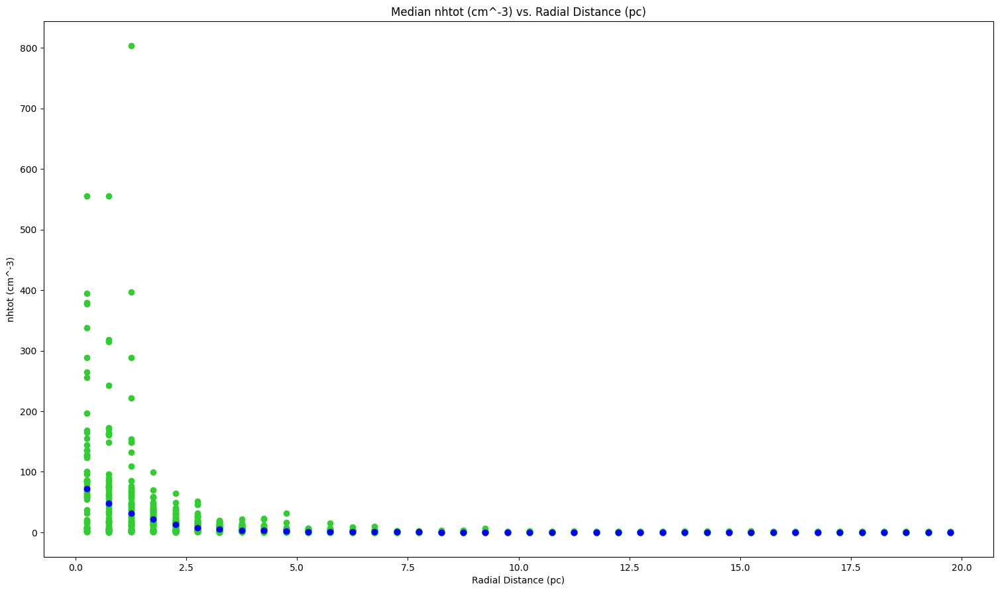

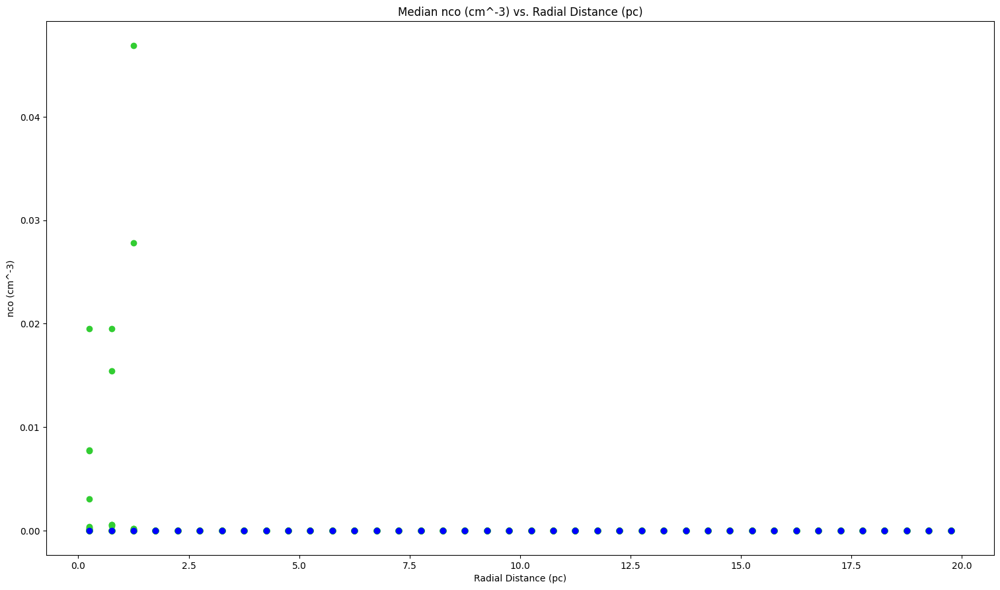

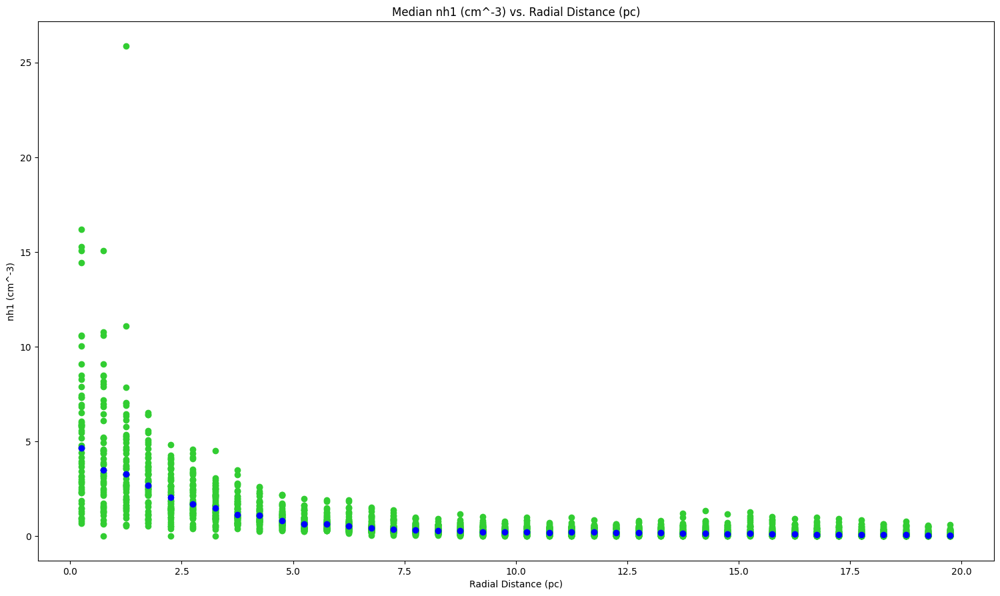

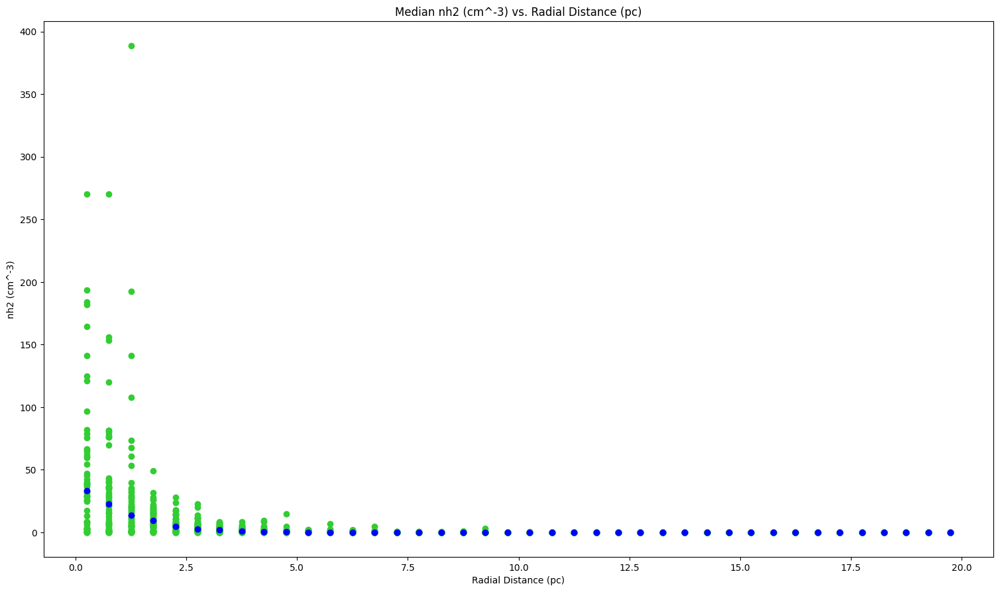

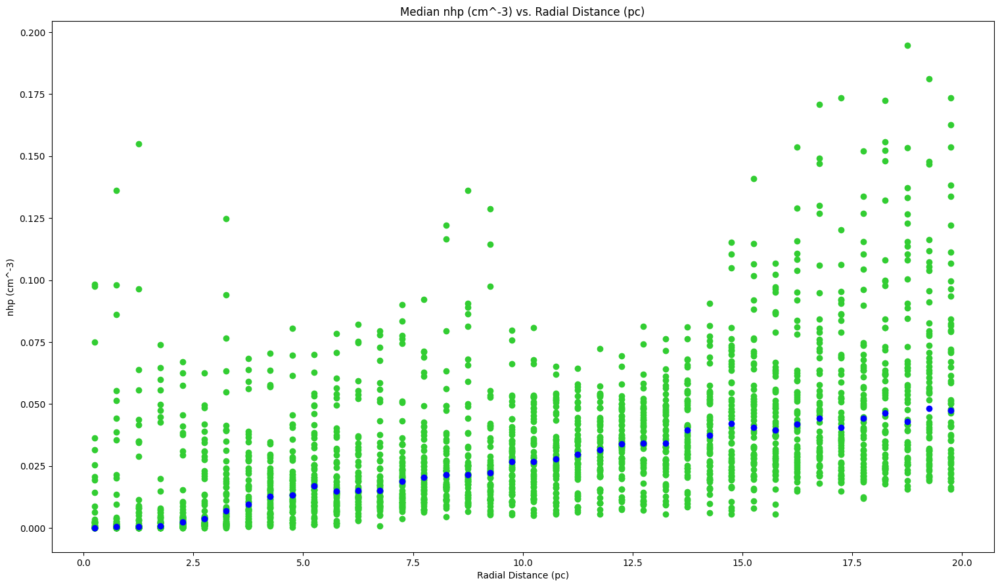

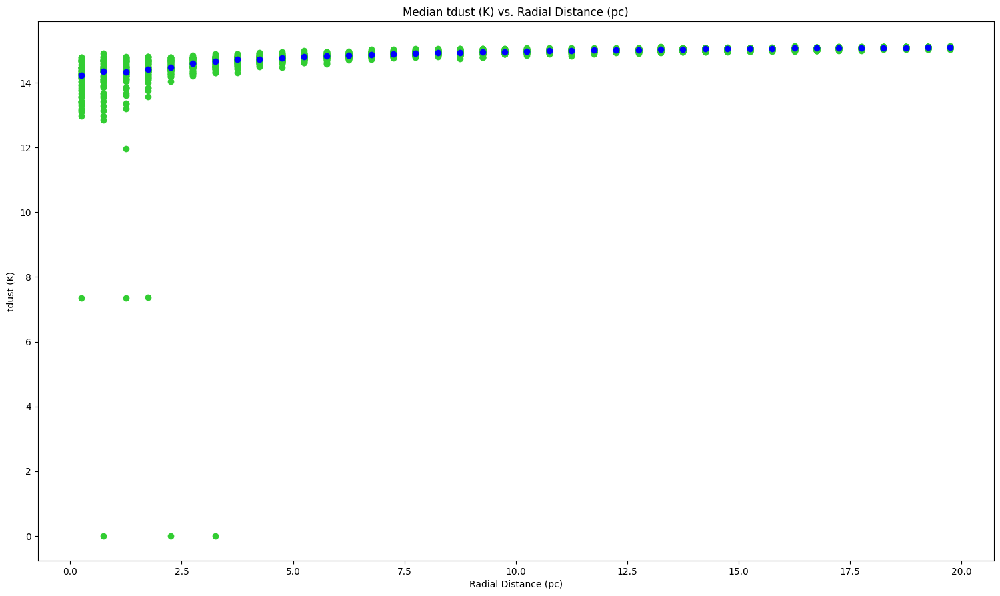

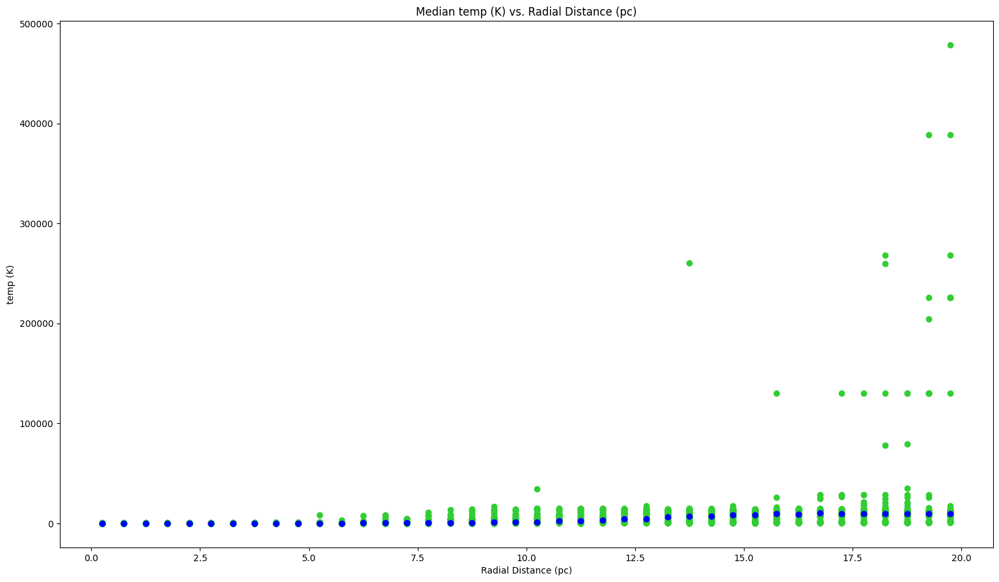

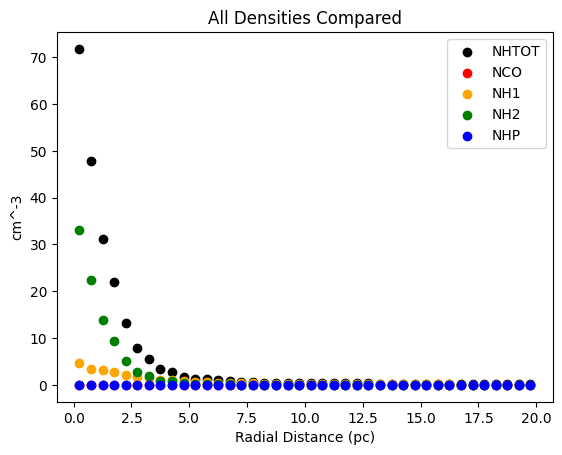

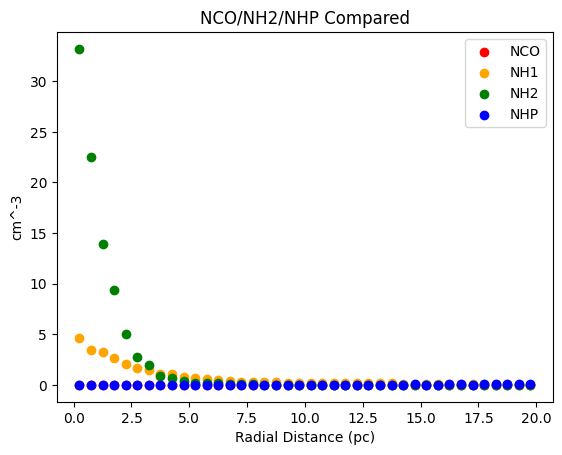

NHTOT
[71.77311993 47.9279623  31.1552906  21.98840141 13.19486189  7.86475861
  5.58512855  3.30477893  2.71126401  1.78089279  1.36030477  1.16499209
  1.07280149  0.90829068  0.58505392  0.53119636  0.46276727  0.4491097
  0.41021306  0.36216649  0.35706389  0.37270482  0.37958316  0.37185971
  0.32862963  0.35676502  0.28842182  0.2886232   0.24306168  0.23205426
  0.2419197   0.22940219  0.22266911  0.21277256  0.21954322  0.23626404
  0.23485587  0.213817    0.197303    0.18424051]
NHI + NHP + 2*NH2
[71.04518718 48.45017649 31.13813268 21.33238844 12.04063736  7.22920964
  5.51583701  2.94502693  2.55323006  1.69563095  1.12244046  1.12112918
  0.90321646  0.65123668  0.48114909  0.46961021  0.38935875  0.36616805
  0.29860254  0.29493696  0.28526712  0.24071313  0.27009305  0.24322029
  0.21816823  0.21915811  0.19839026  0.18635497  0.17176179  0.15920211
  0.16569899  0.15681374  0.1587454   0.12261     0.12090529  0.11743627
  0.11270802  0.11144884  0.09196513  0.08784814]



<Figure size 640x480 with 0 Axes>

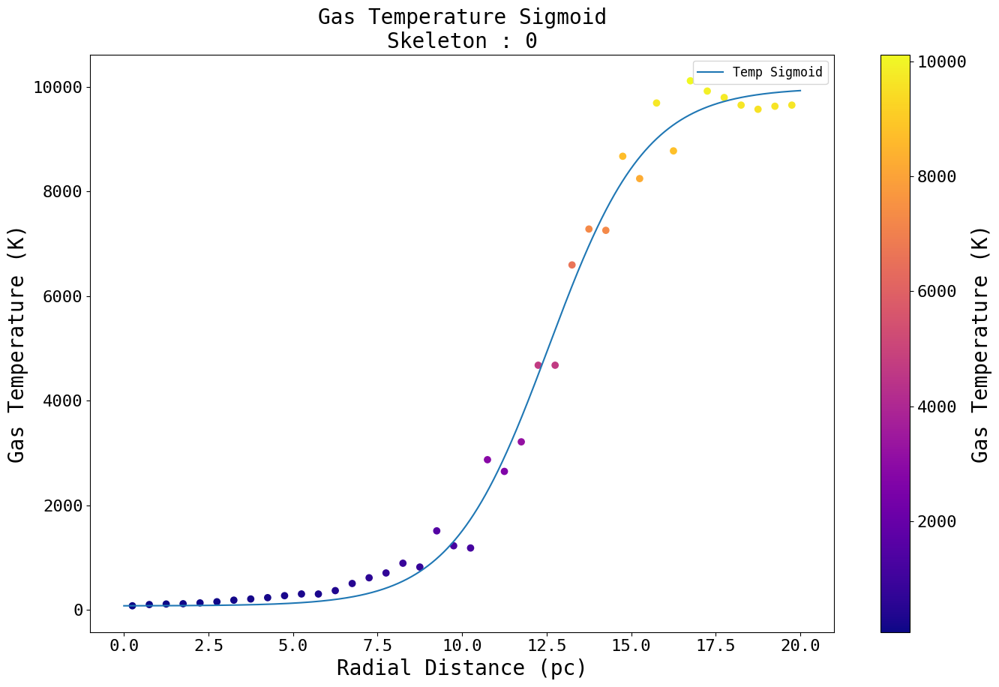

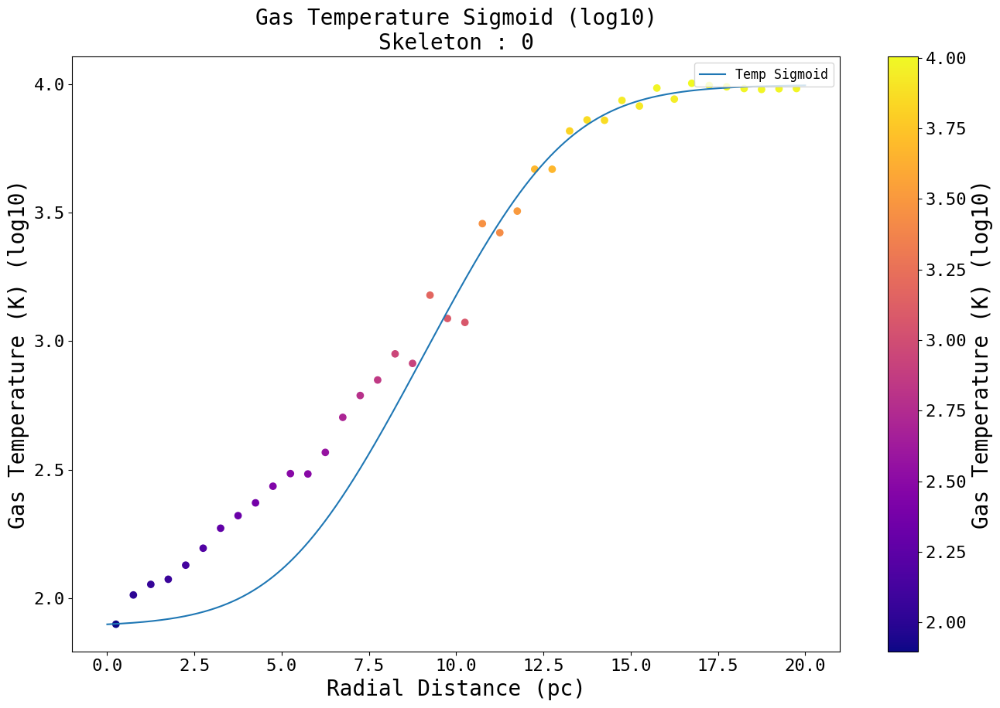



Max Value : 71.77311992645264
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 30.26237055935772
            Iterations: 13
            Function evaluations: 70
            Gradient evaluations: 13


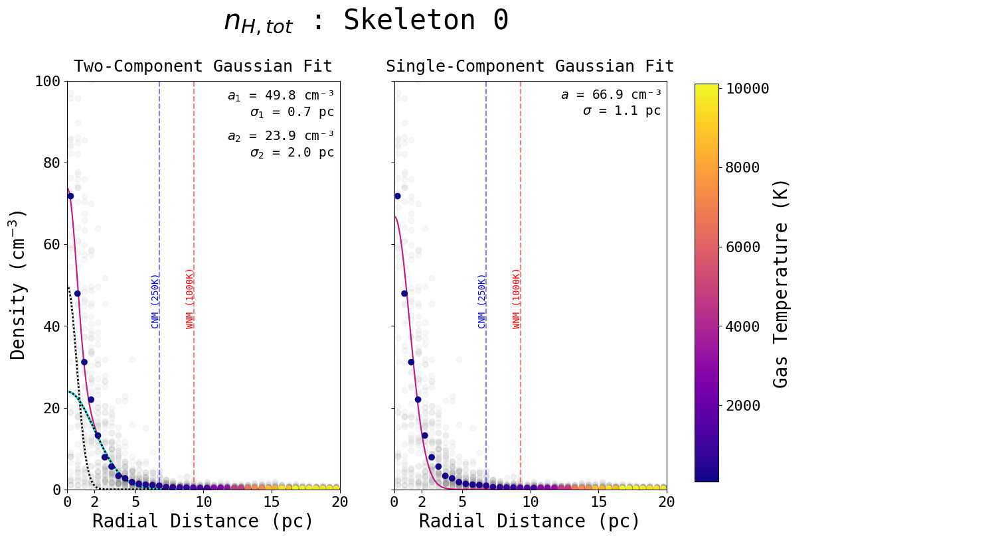

Max Value : 2.714042643958692e-07
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.153622429733157e-13
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


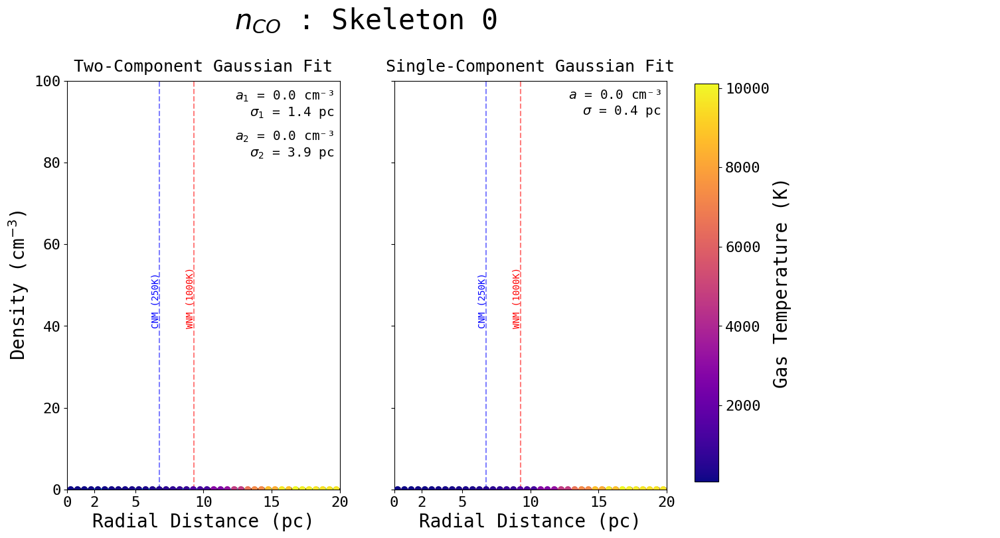

Max Value : 33.1944522857666
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 3.672137320585348
            Iterations: 17
            Function evaluations: 91
            Gradient evaluations: 17


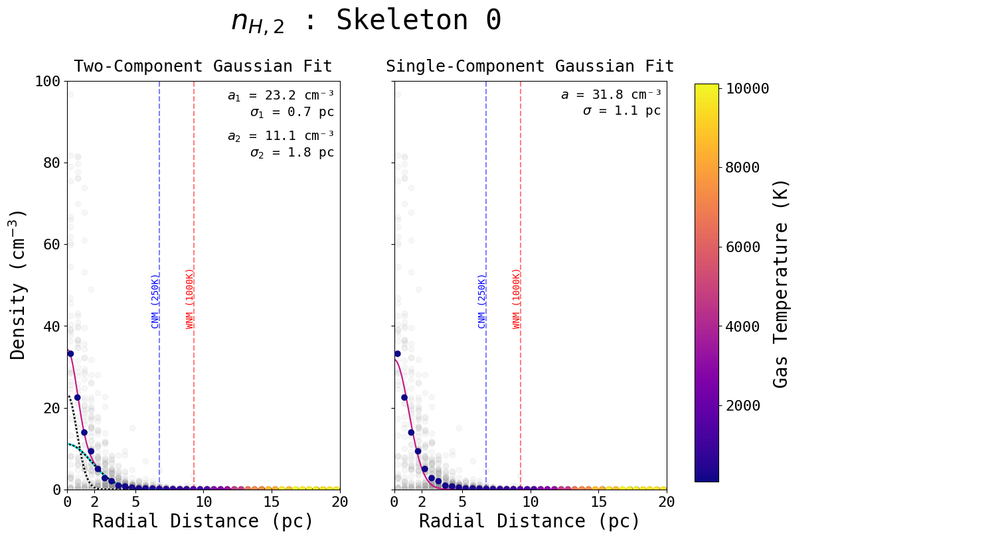

Max Value : 4.656167507171631
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.6452658980025313
            Iterations: 11
            Function evaluations: 57
            Gradient evaluations: 11


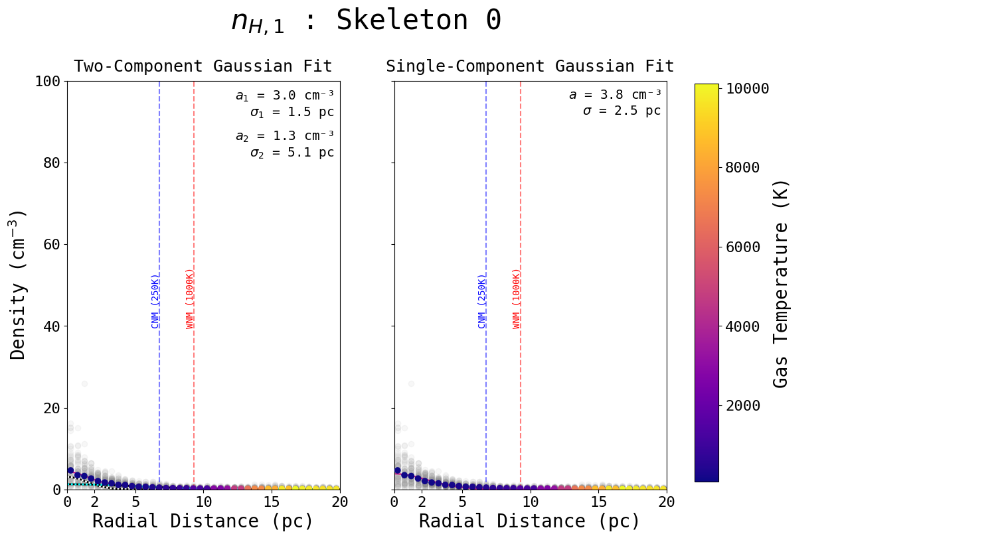

Max Value : 0.0480956956744194
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.01287796088023213
            Iterations: 25
            Function evaluations: 126
            Gradient evaluations: 25


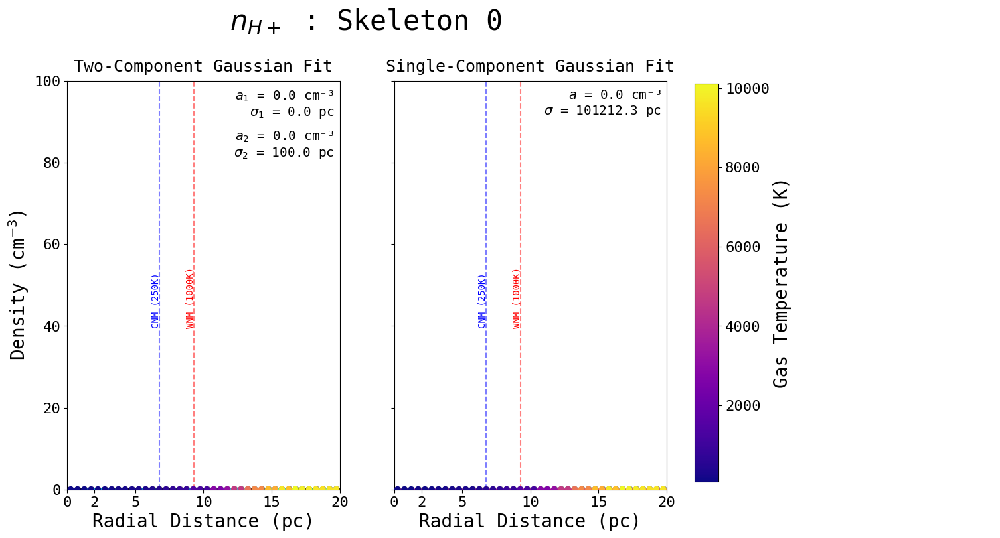

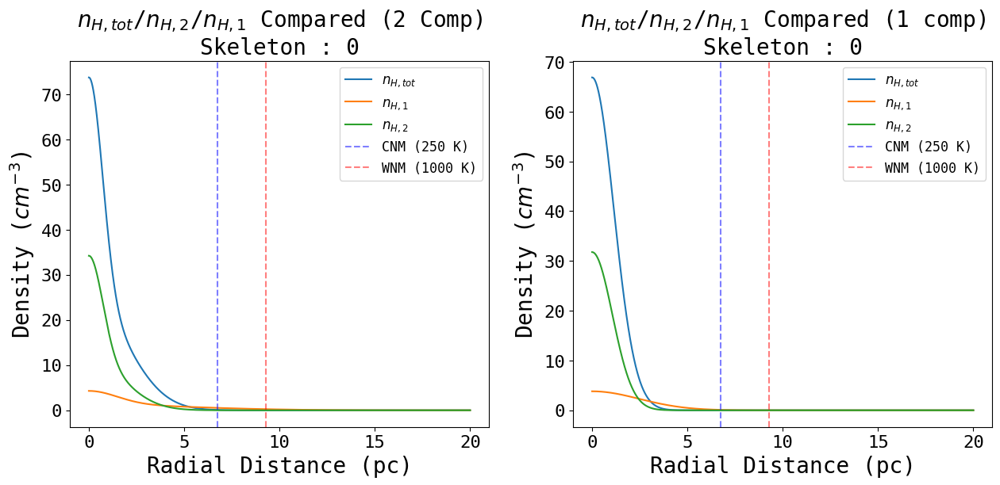

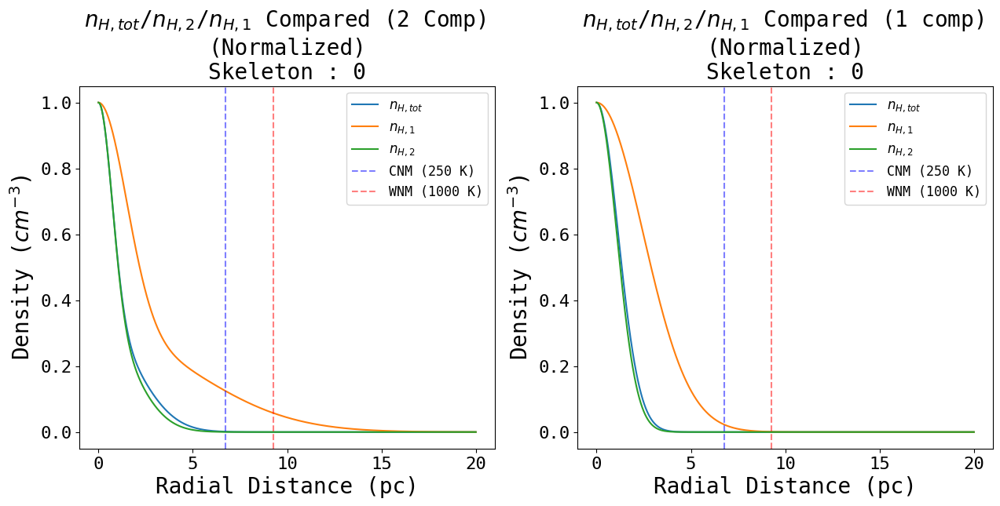

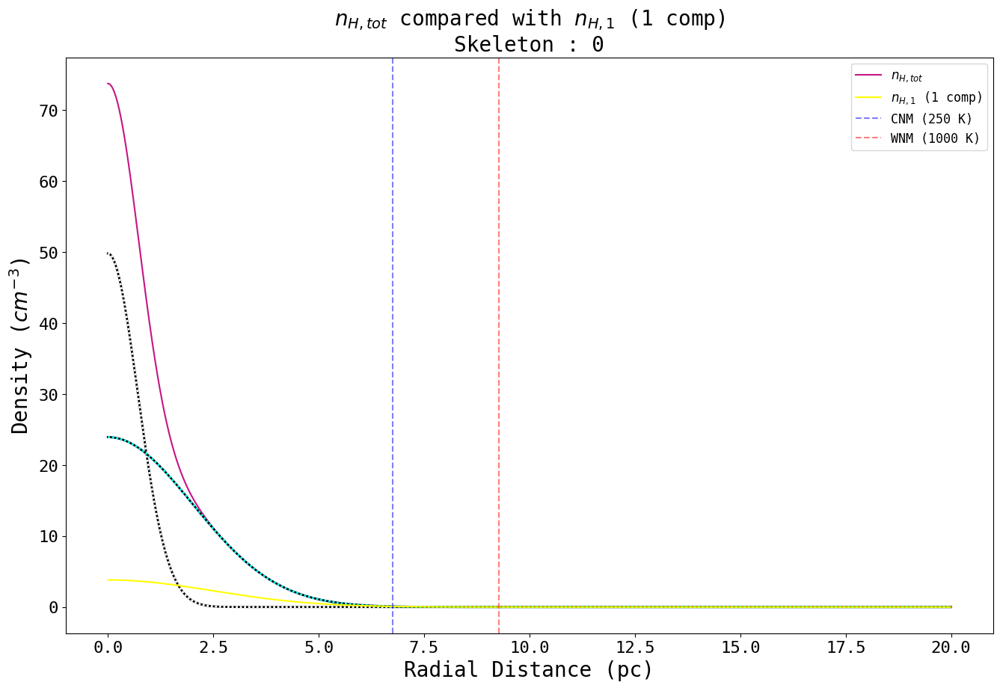

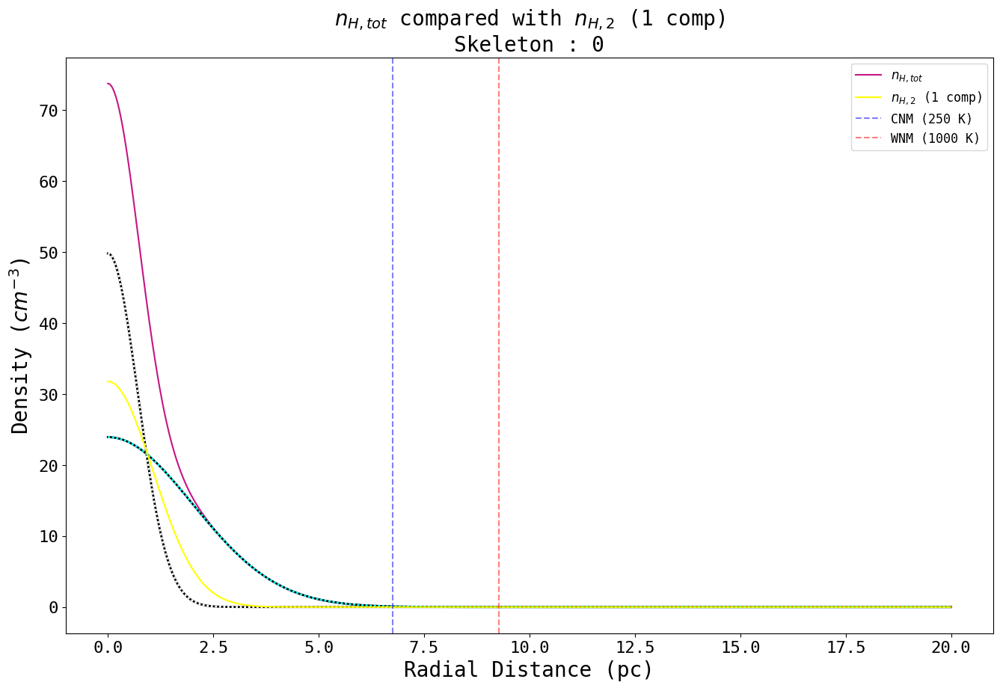

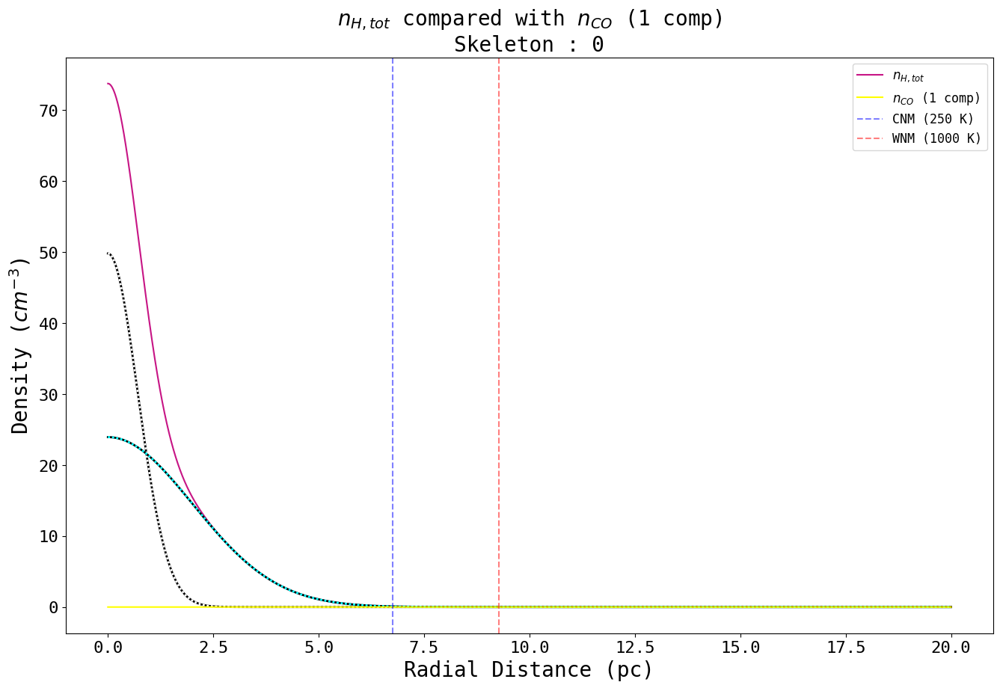

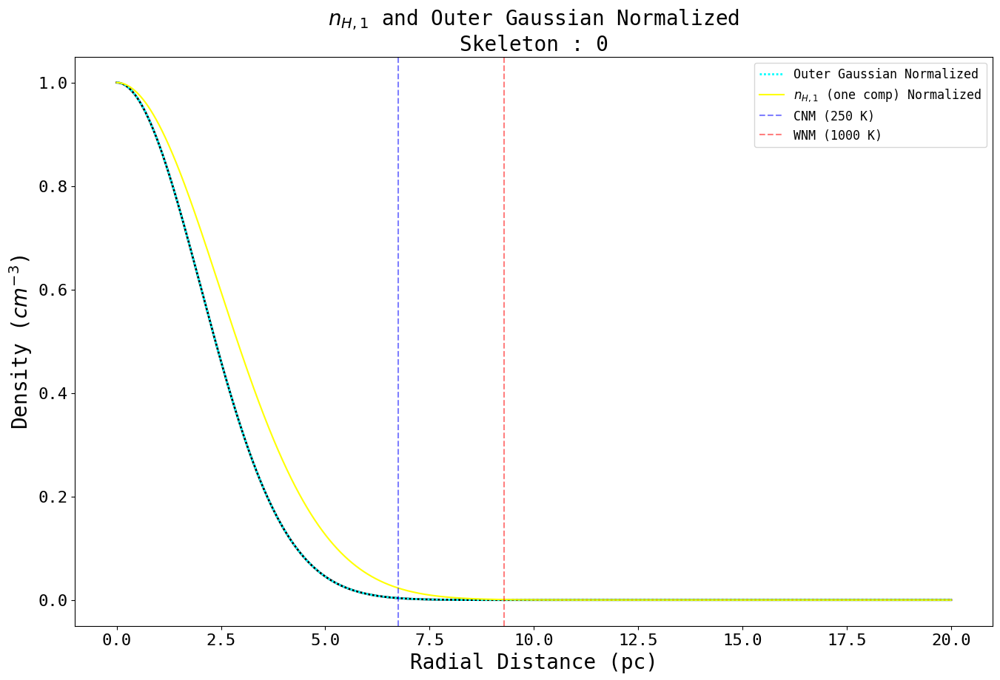

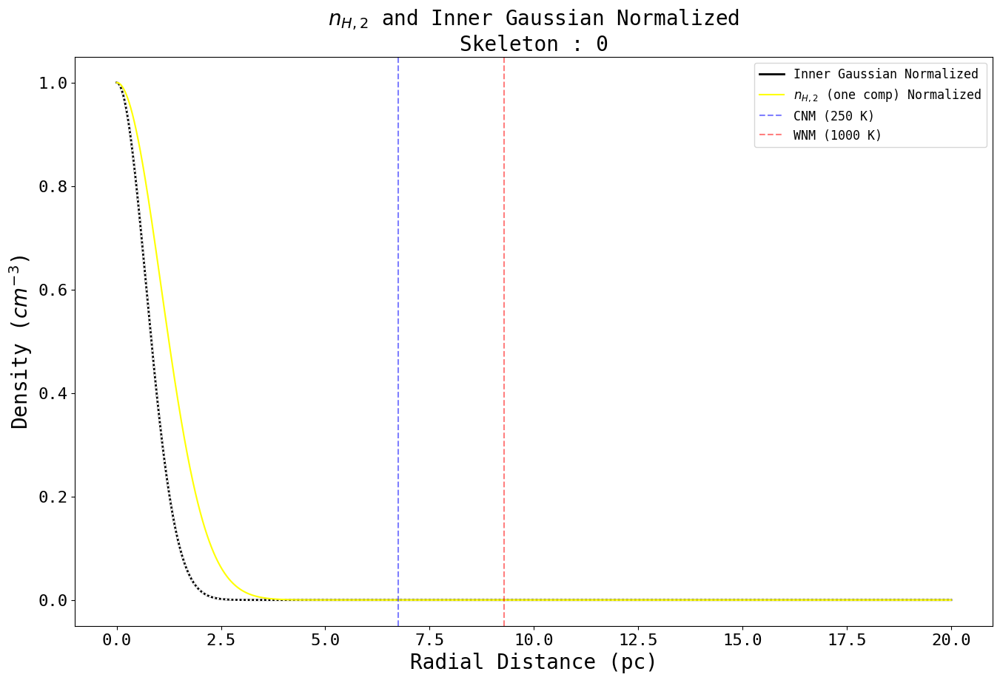

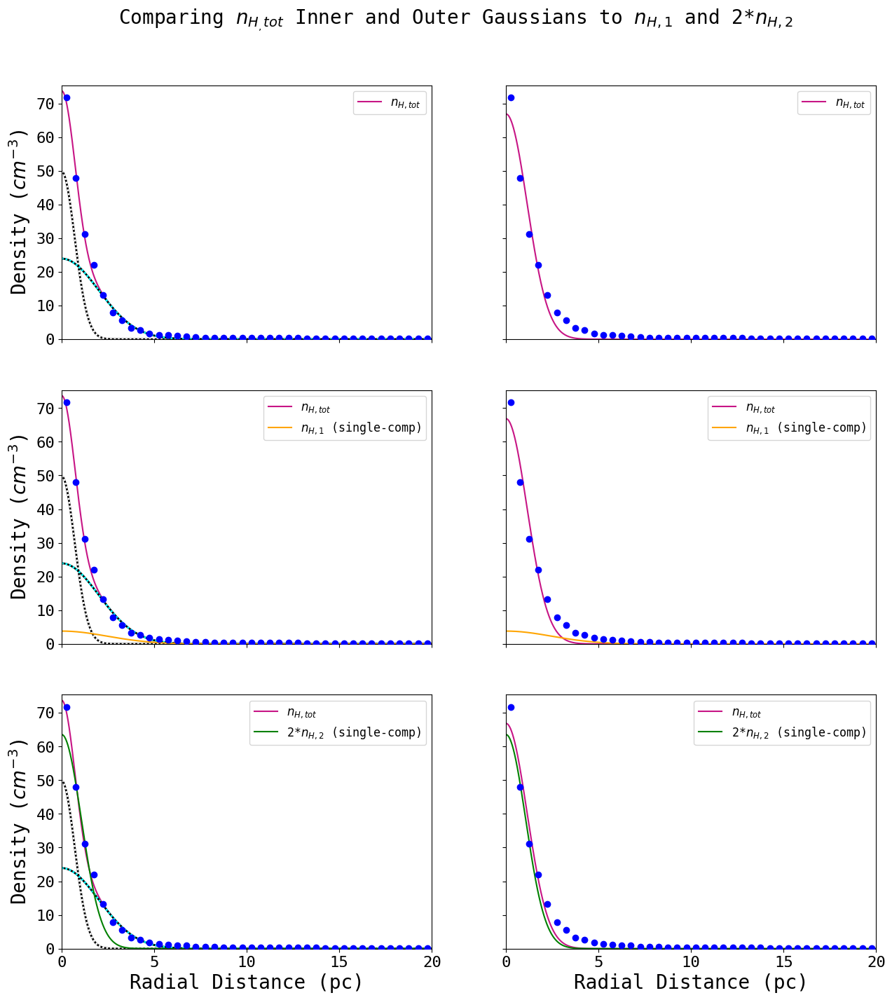

----------------------------------------
Skeleton 0
----------------------------------------


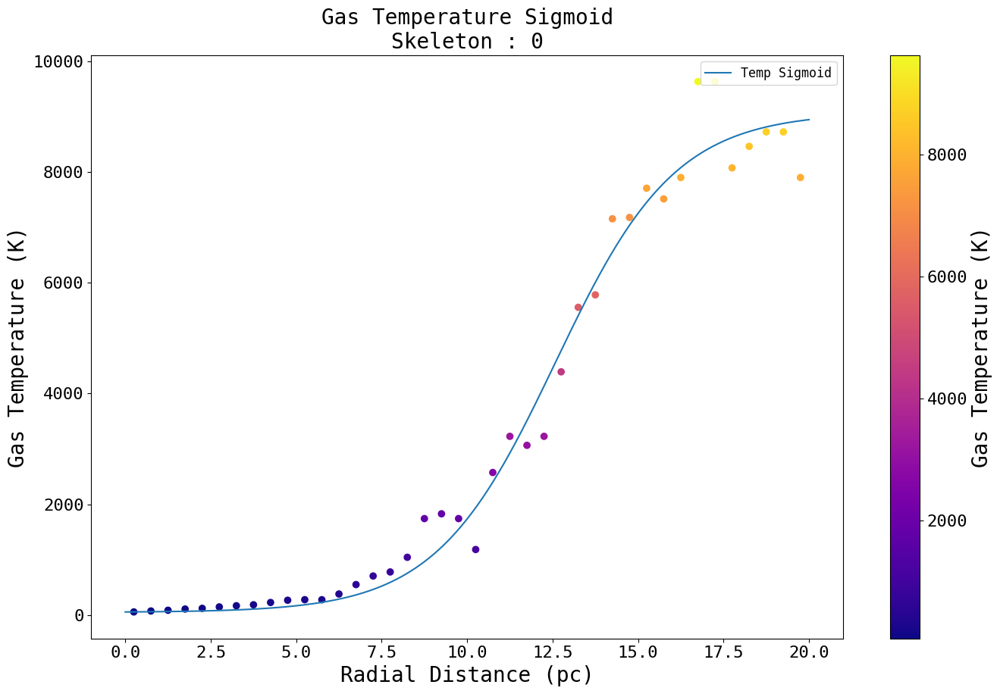

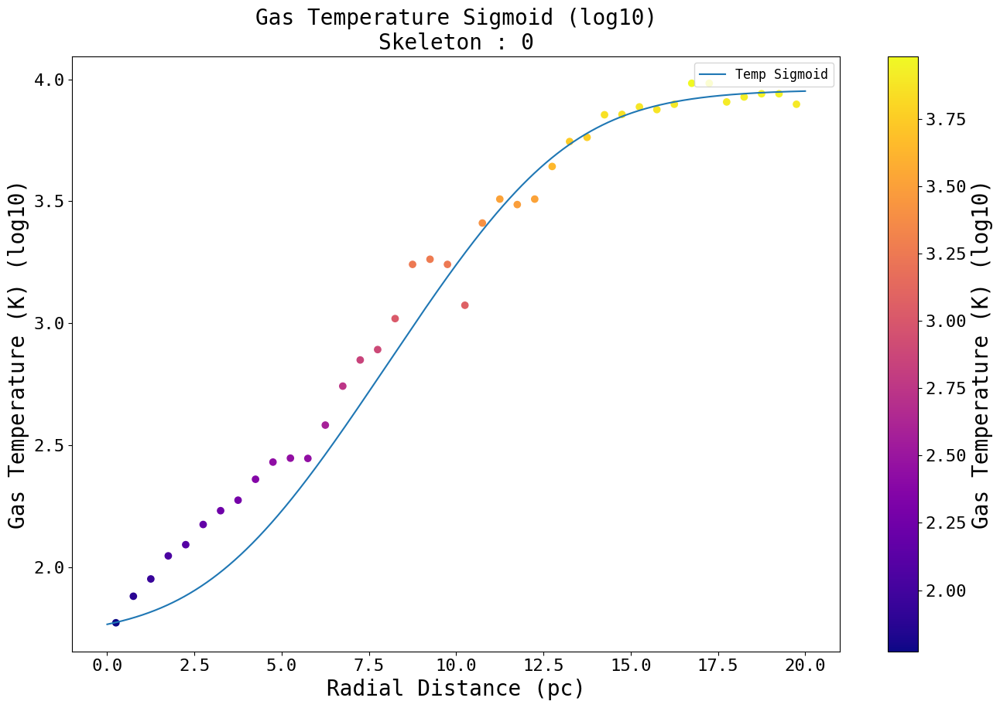



Max Value : 100.36239624023438
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 22.89094998199446
            Iterations: 22
            Function evaluations: 116
            Gradient evaluations: 22


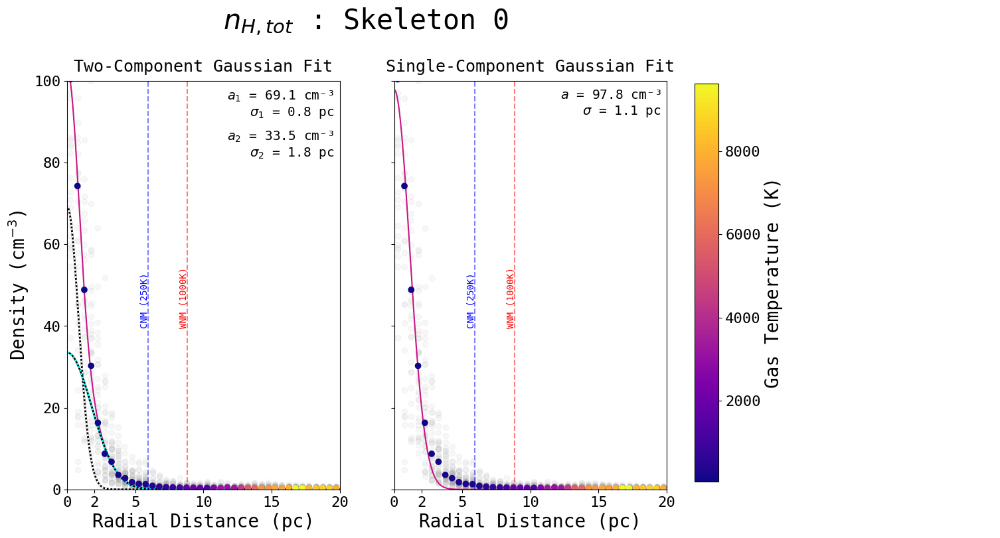

Max Value : 1.8973173609992955e-06
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 5.521915880251985e-12
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


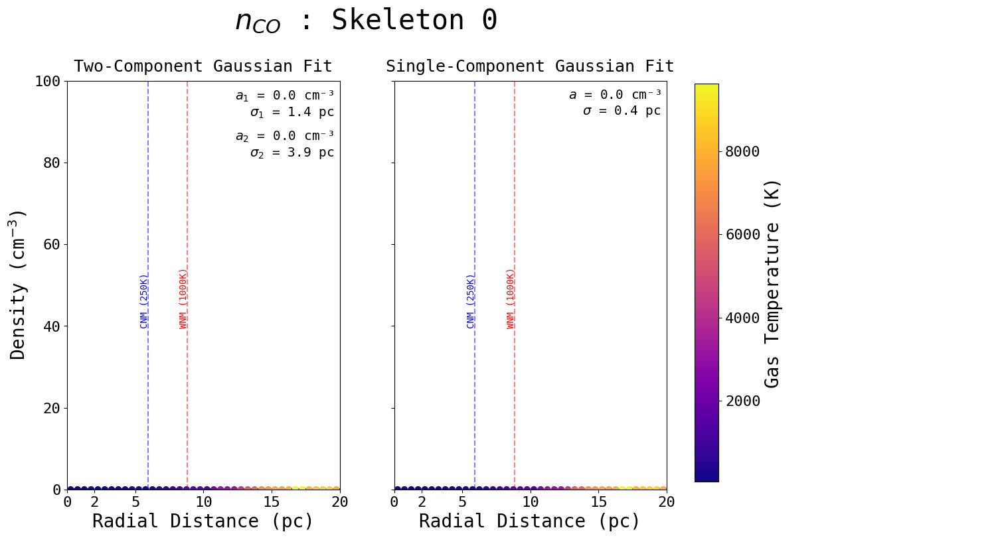

Max Value : 46.83557891845703
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2.108066800854575
            Iterations: 17
            Function evaluations: 91
            Gradient evaluations: 17


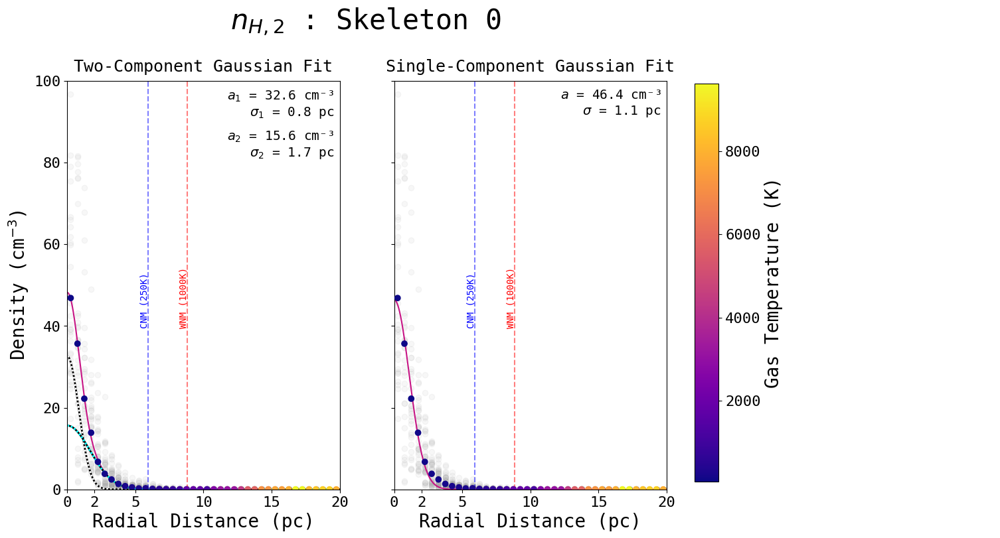

Max Value : 5.8906660079956055
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.8951600003686535
            Iterations: 12
            Function evaluations: 62
            Gradient evaluations: 12


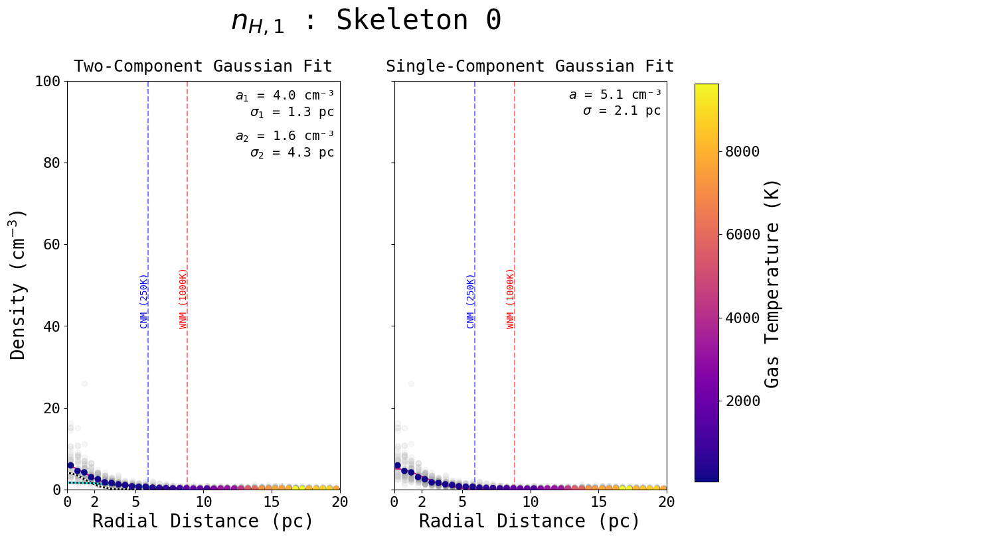

Max Value : 0.06694057956337929
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.019739023206142244
            Iterations: 32
            Function evaluations: 162
            Gradient evaluations: 32


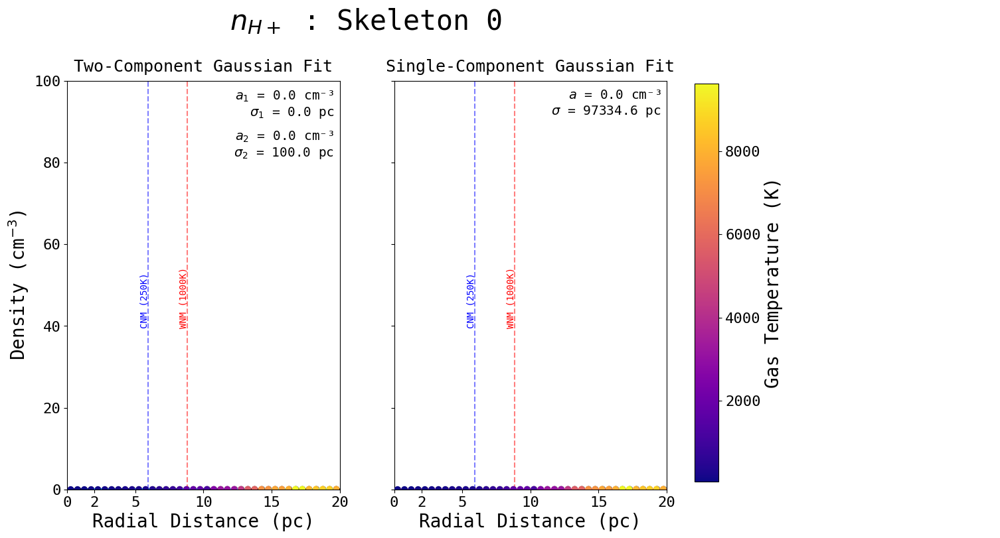

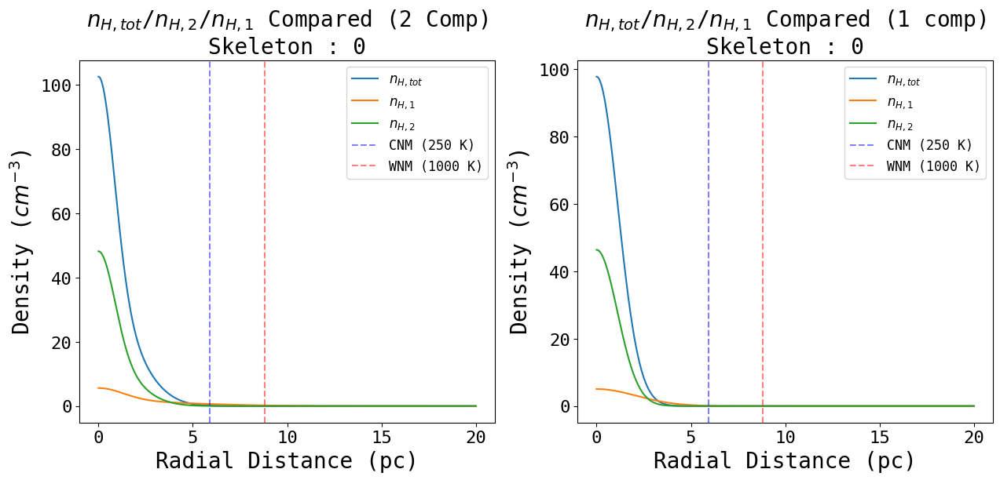

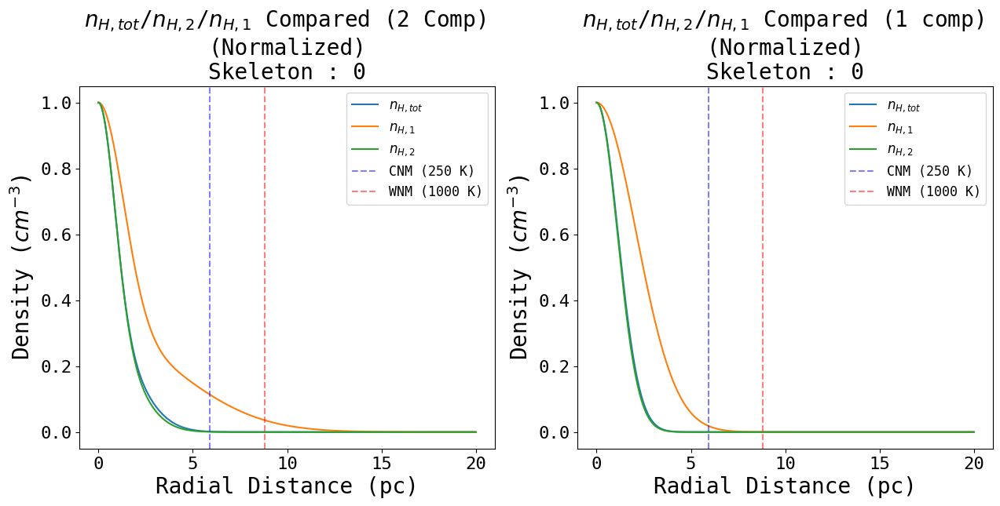

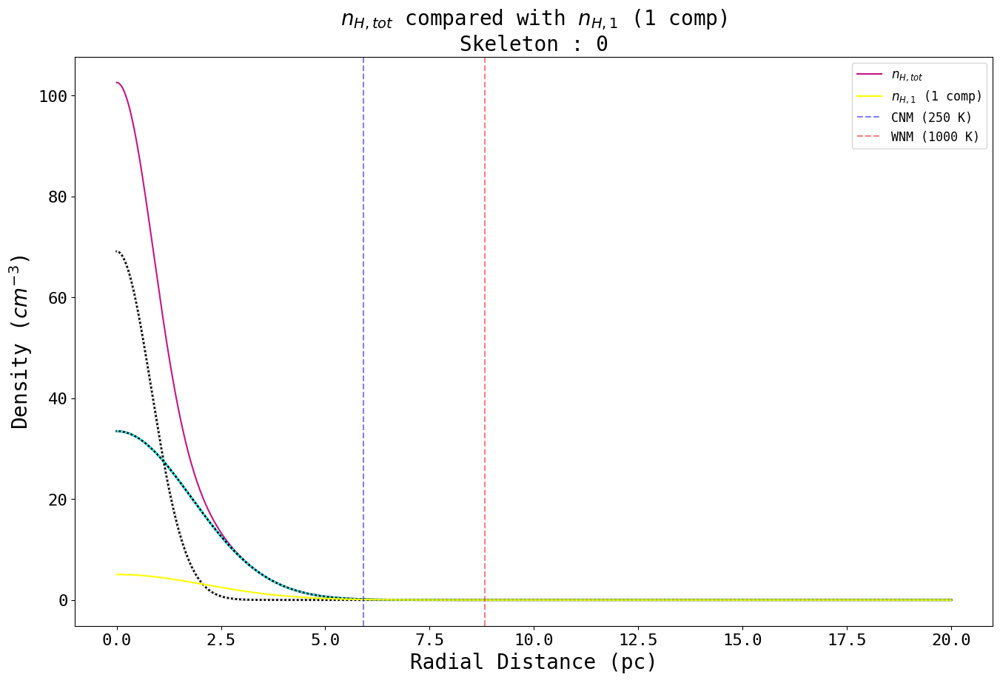

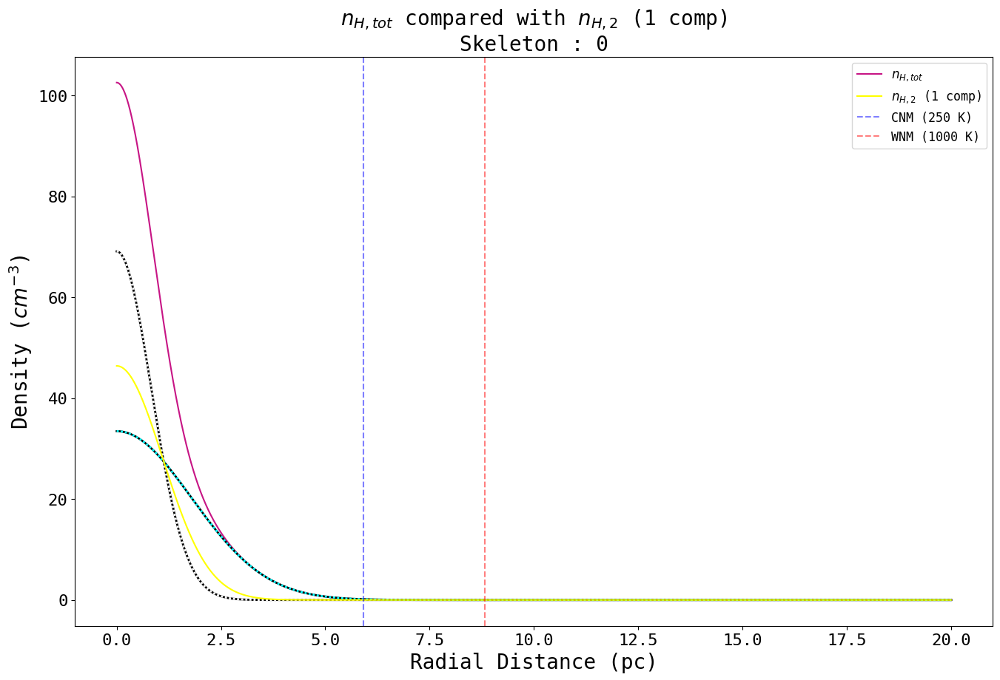

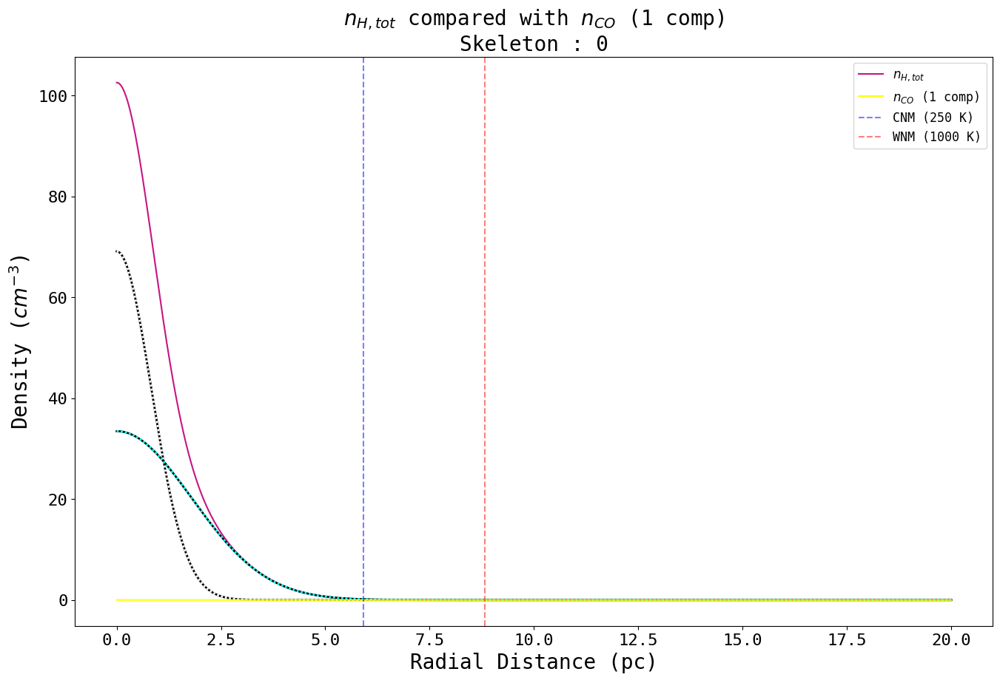

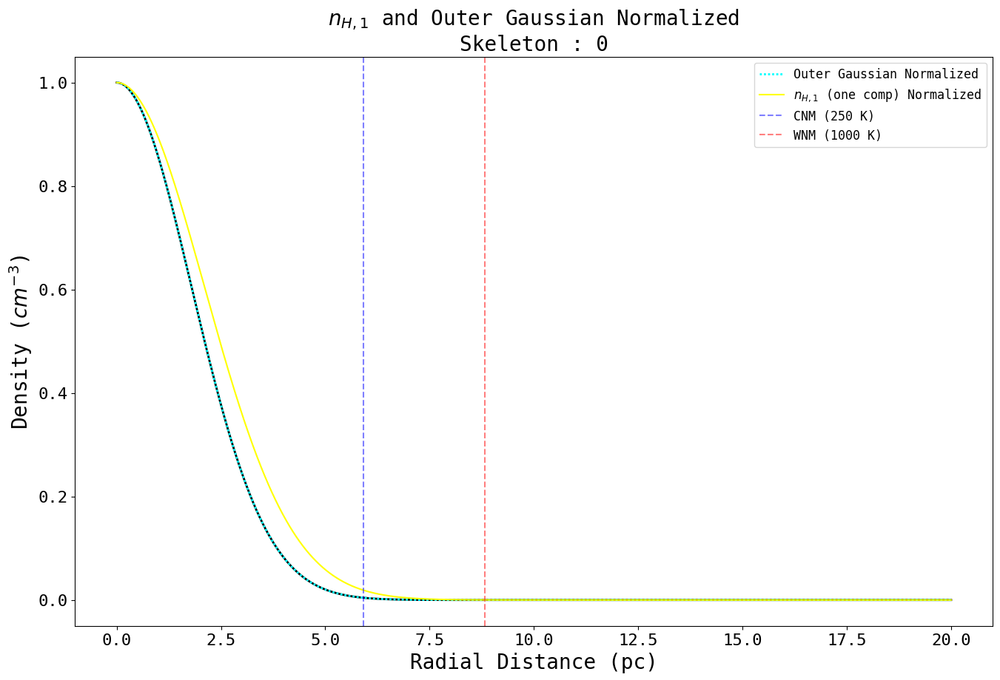

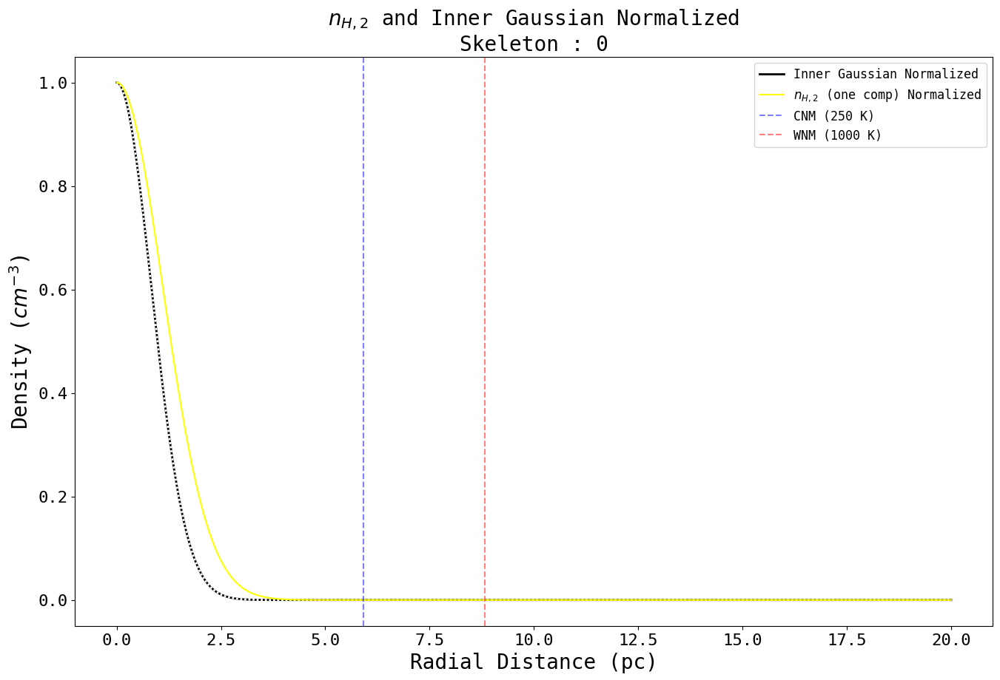

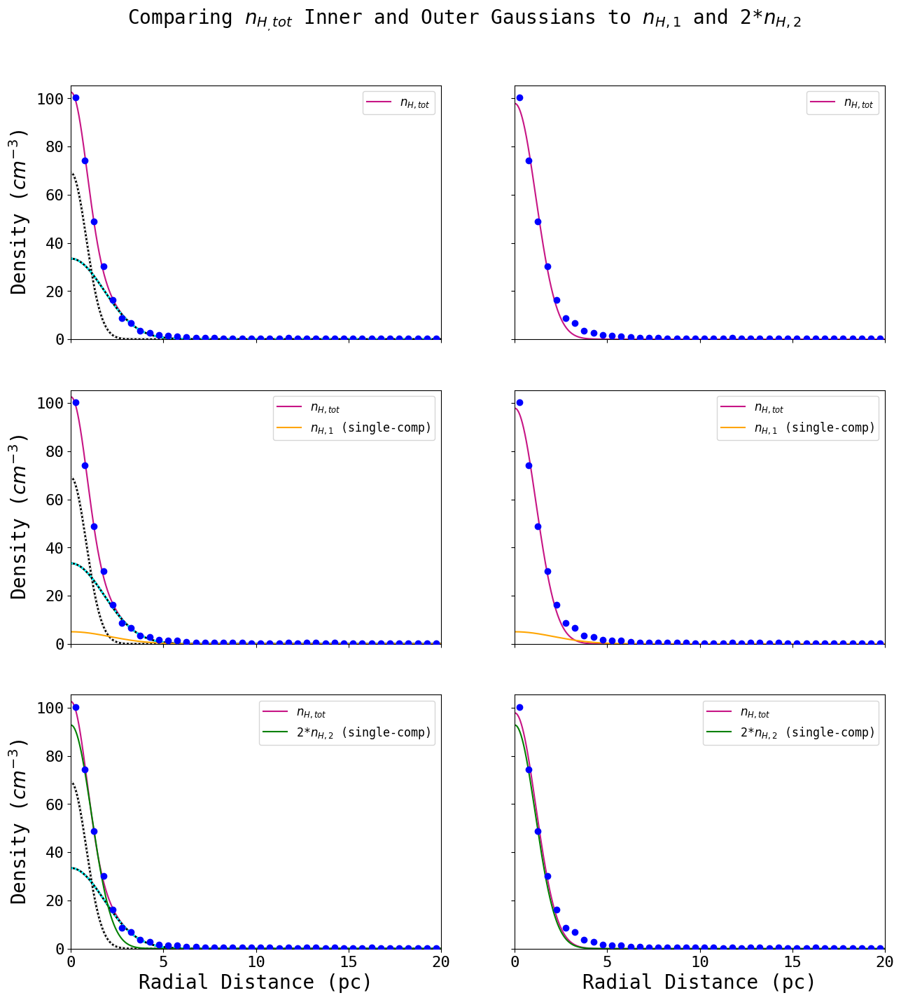

----------------------------------------
Skeleton 0
----------------------------------------


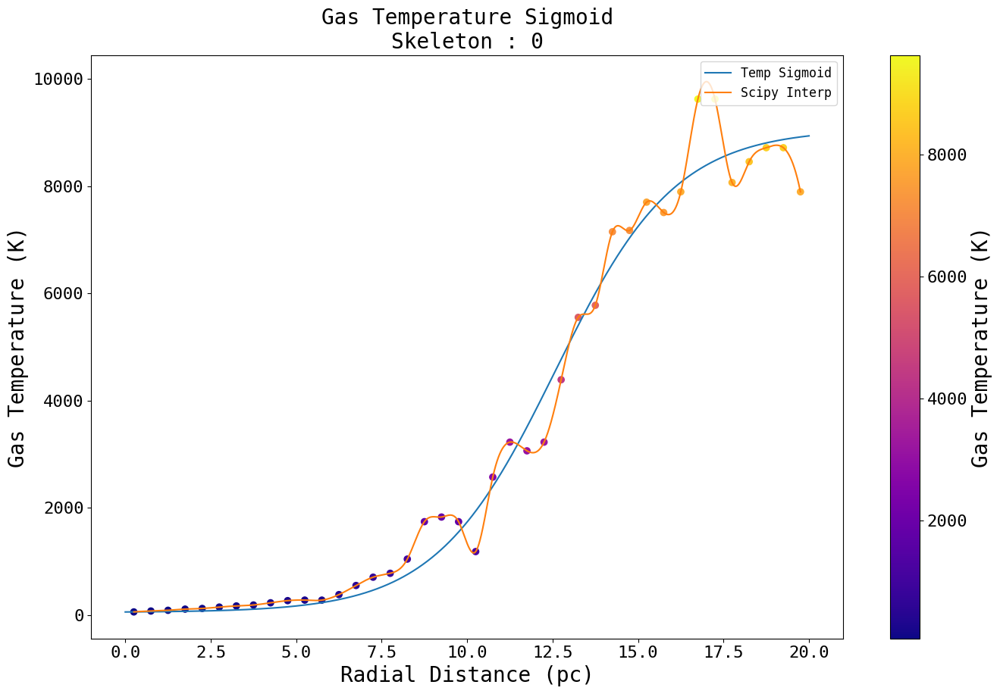

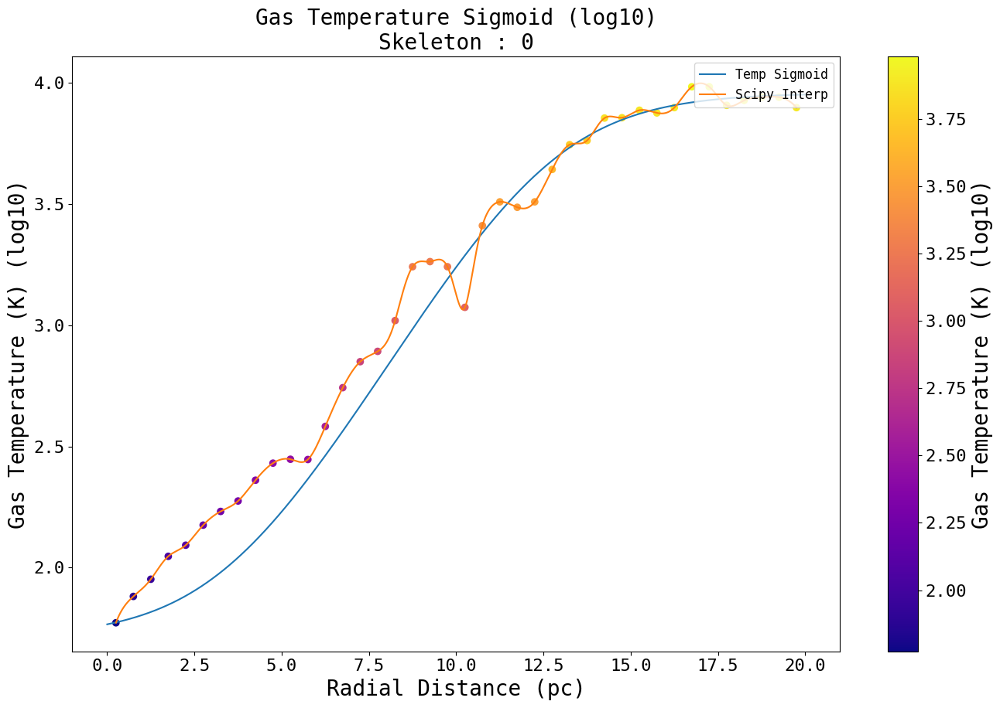

Max Value : 100.36239624023438
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 419.0054583502319
            Iterations: 2
            Function evaluations: 10
            Gradient evaluations: 2


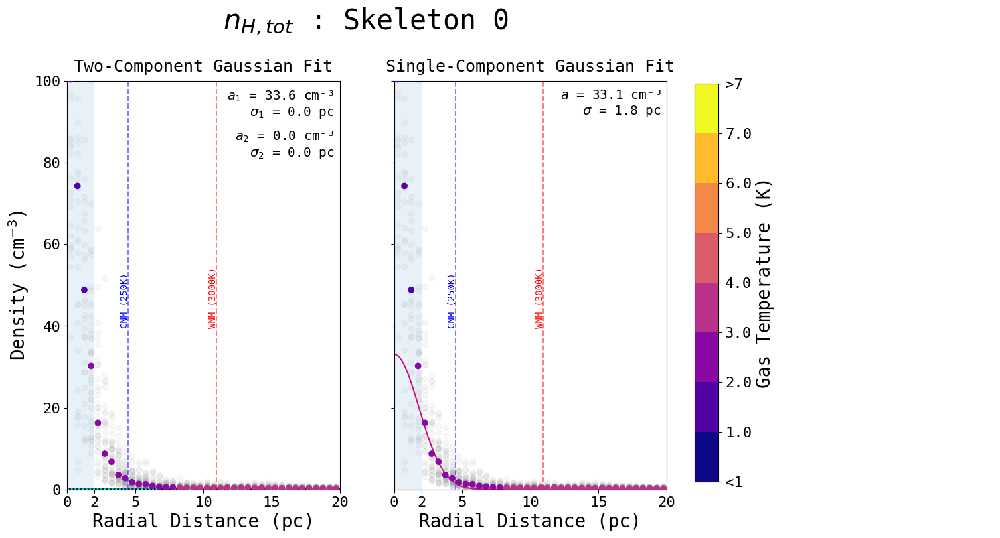

Max Value : 1.8973173609992955e-06
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.8481962951621058e-12
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


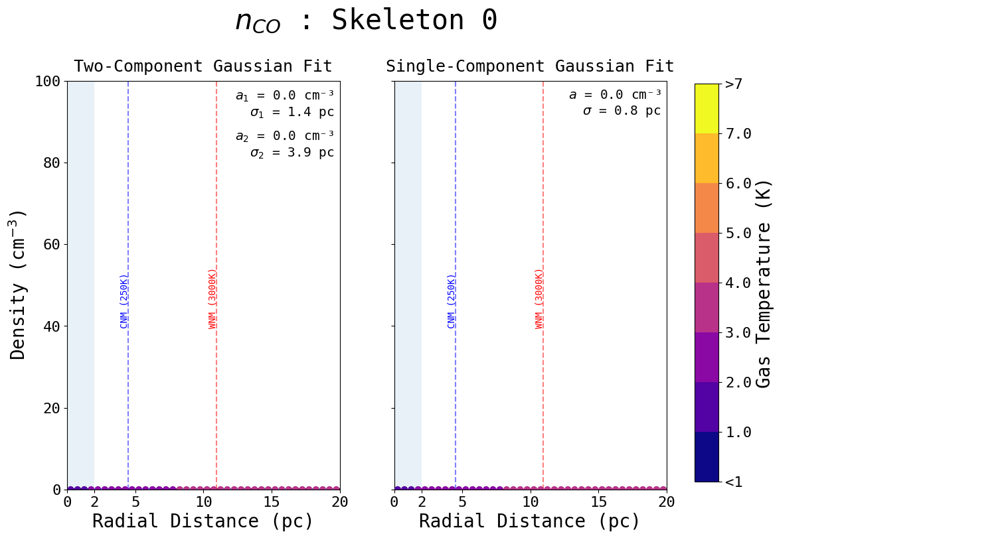

Max Value : 46.83557891845703
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 68.79008843598845
            Iterations: 2
            Function evaluations: 10
            Gradient evaluations: 2


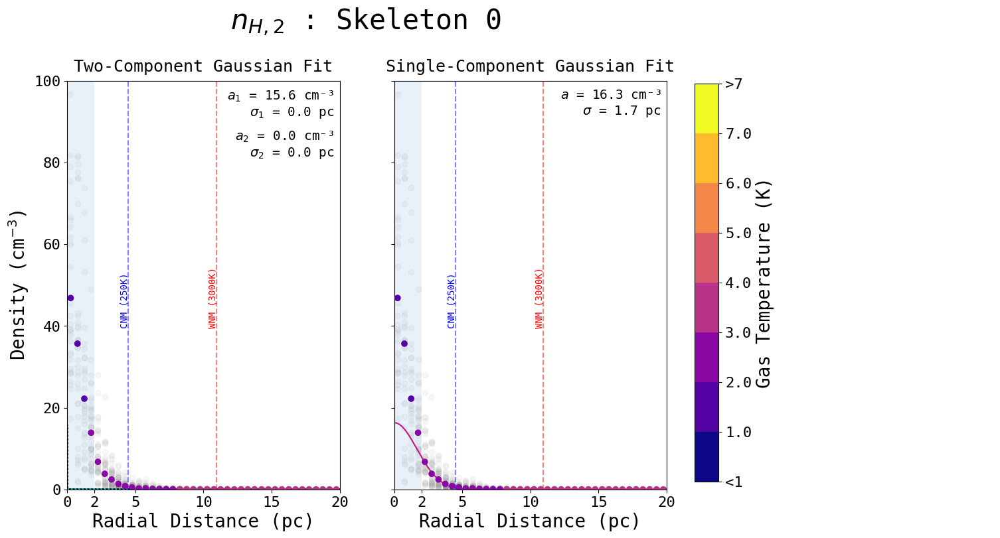

Max Value : 5.8906660079956055
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.12512636600377847
            Iterations: 23
            Function evaluations: 118
            Gradient evaluations: 23


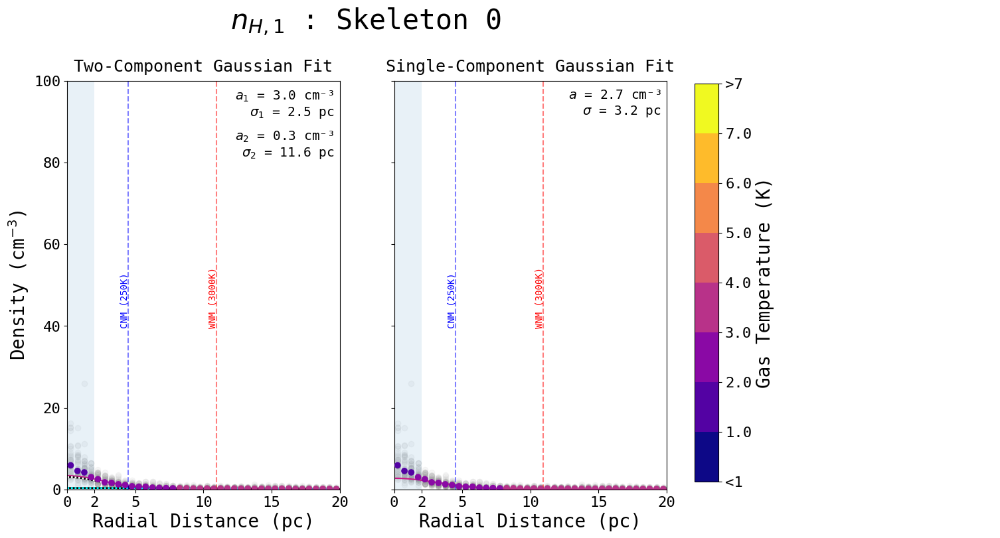

Max Value : 0.06694057956337929
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.017783821821036414
            Iterations: 27
            Function evaluations: 136
            Gradient evaluations: 27


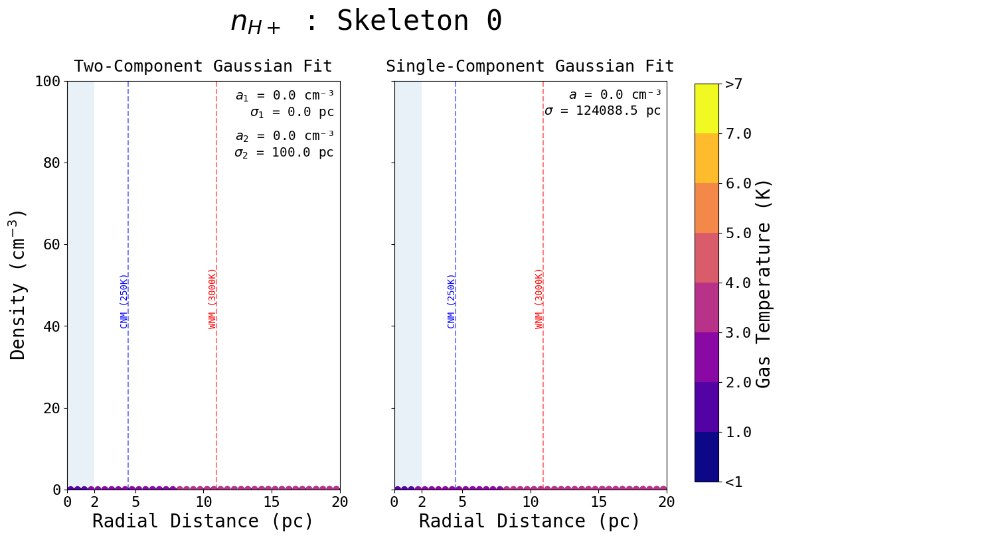

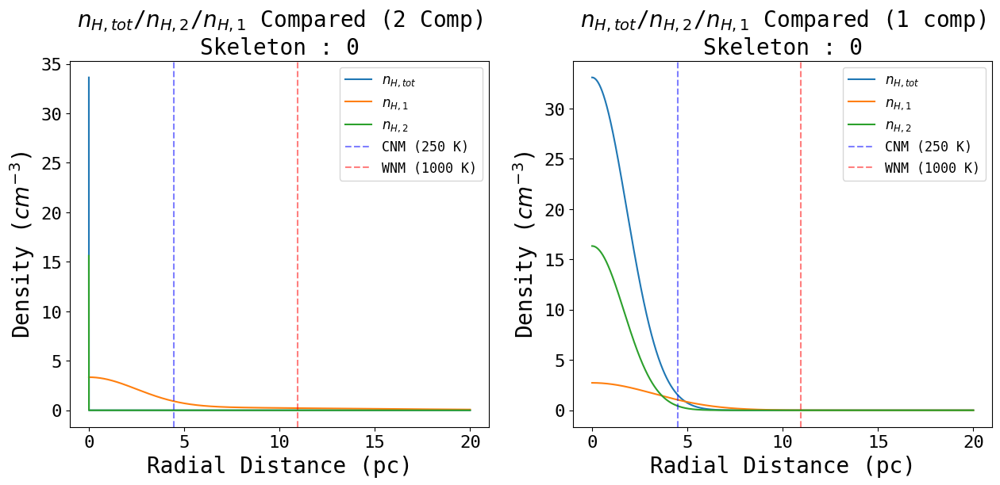

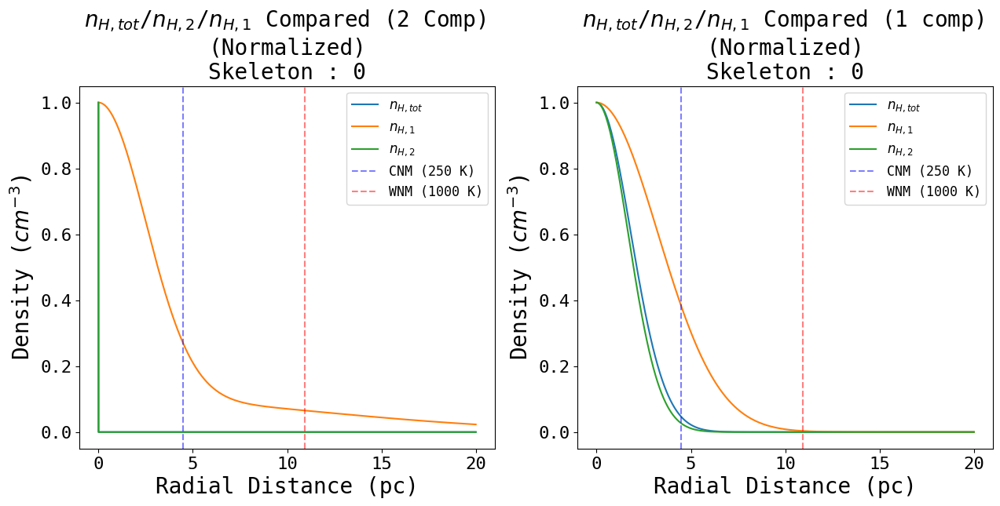

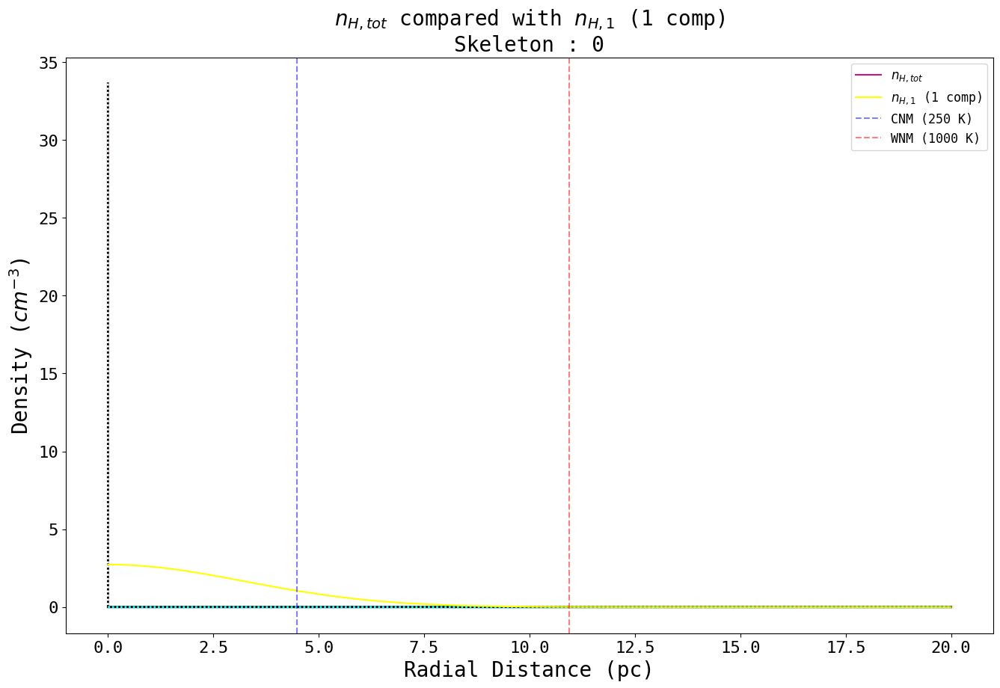

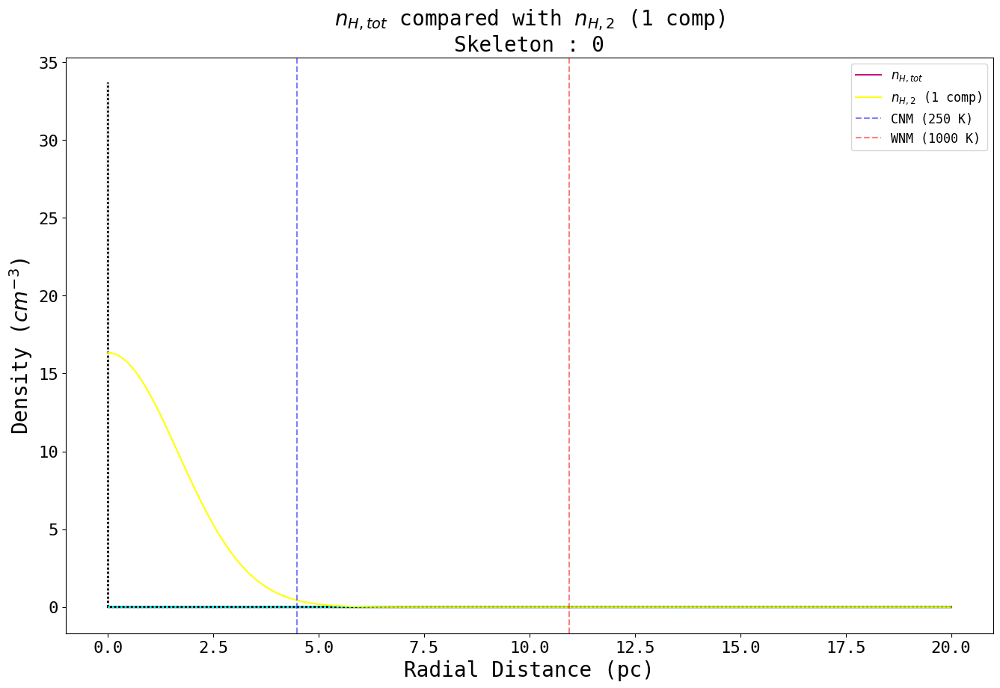

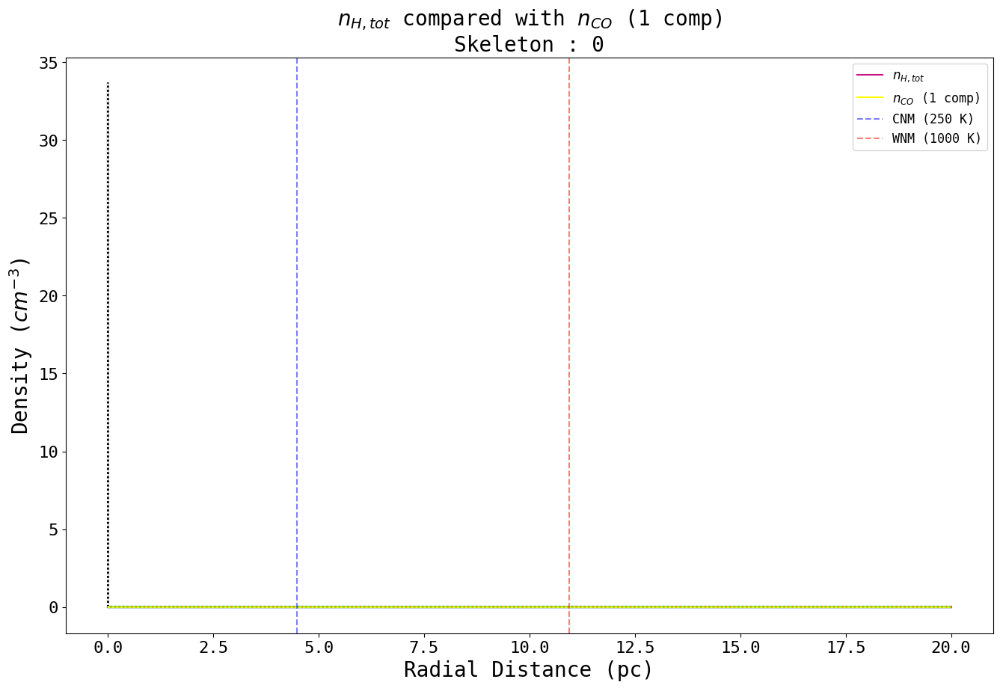

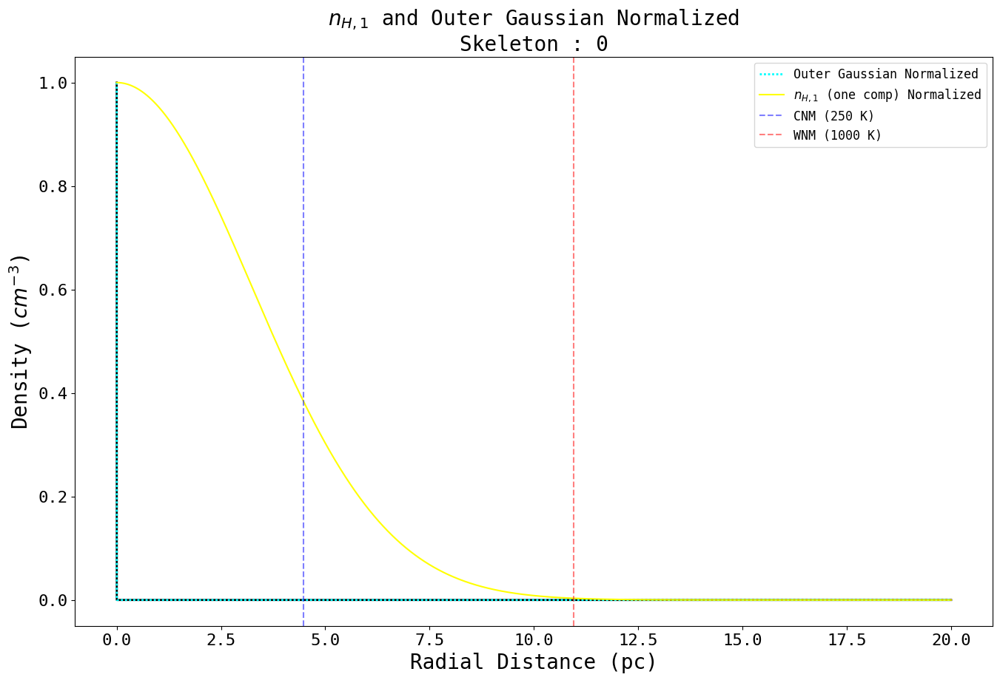

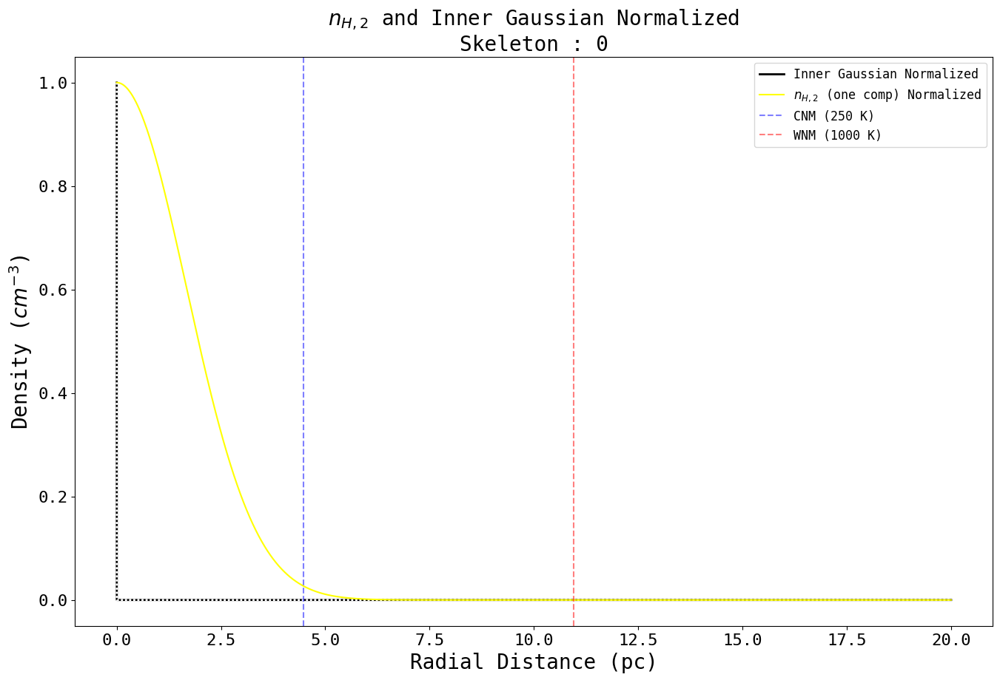

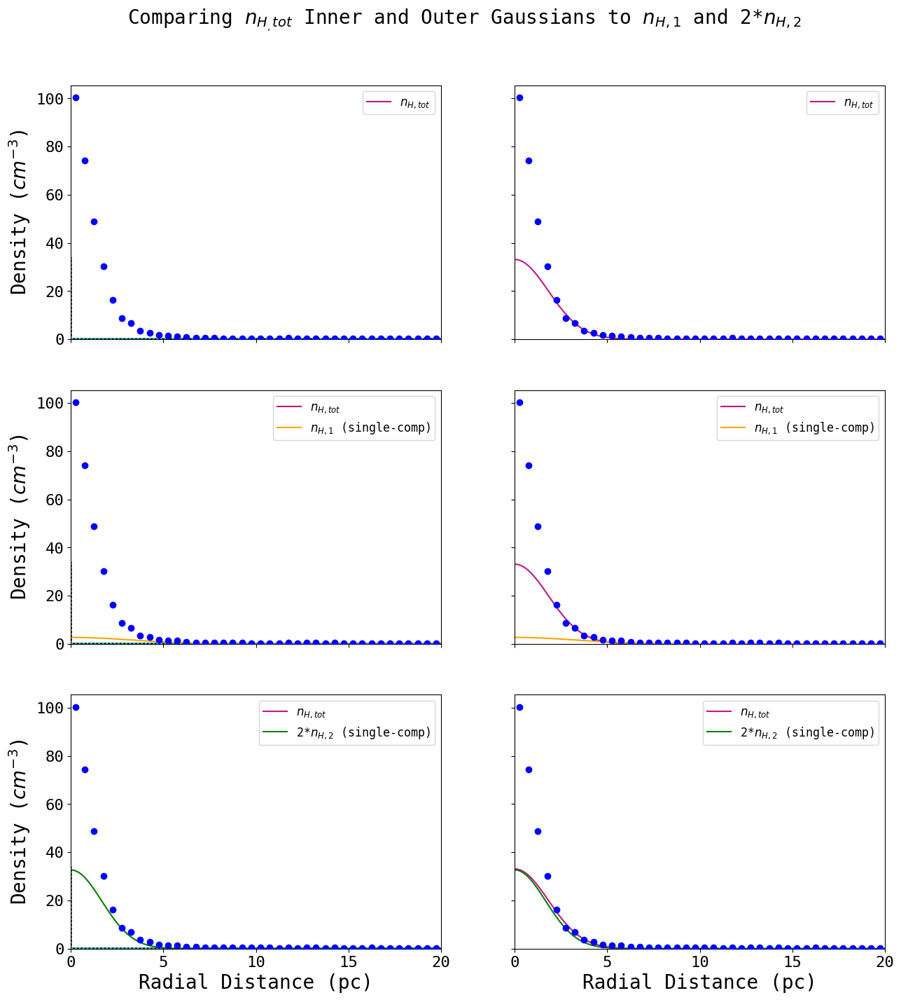

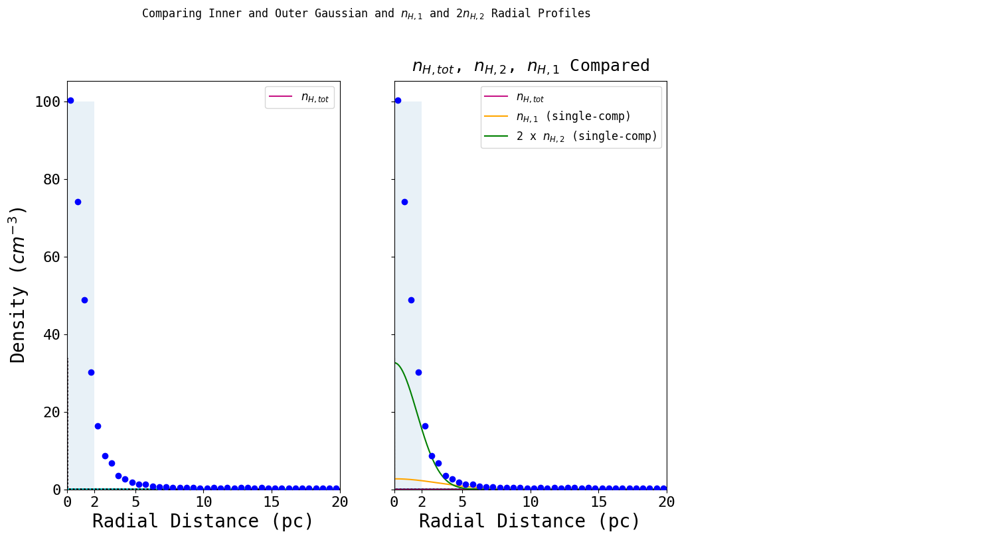


---------------------------
-- Finished
---------------------------

------------------------------------------------------
------------------------------------------------------
Skeleton 1
------------------------------------------------------
------------------------------------------------------

---------------------------
-- Median Scatter Plots
---------------------------
Number of points in spline : 28

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27


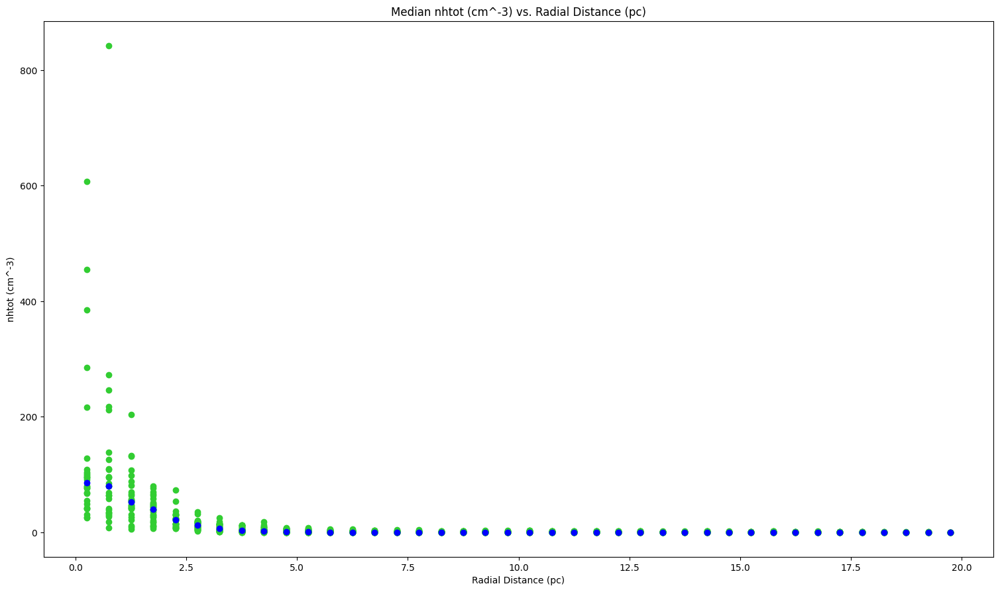

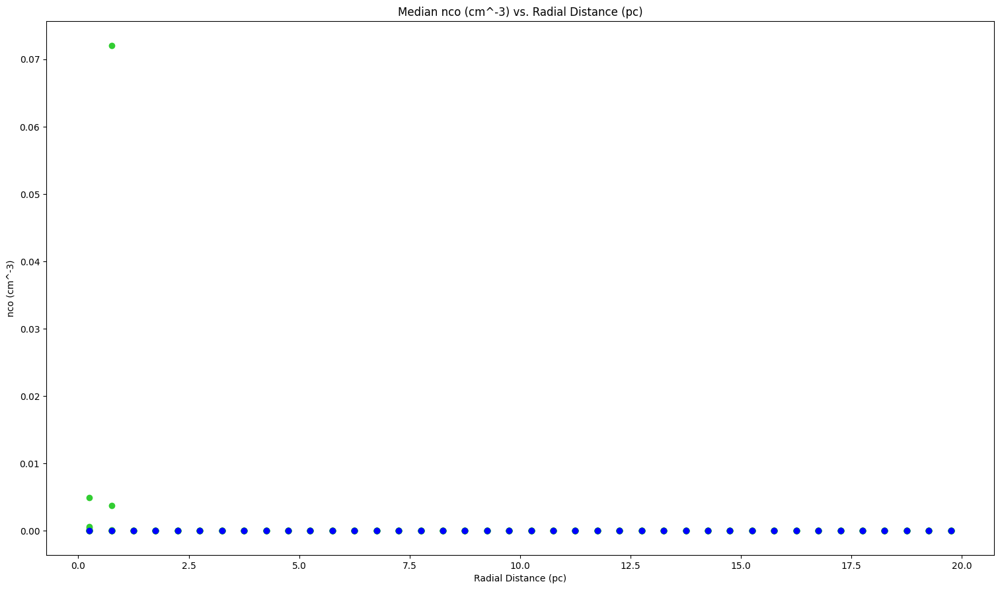

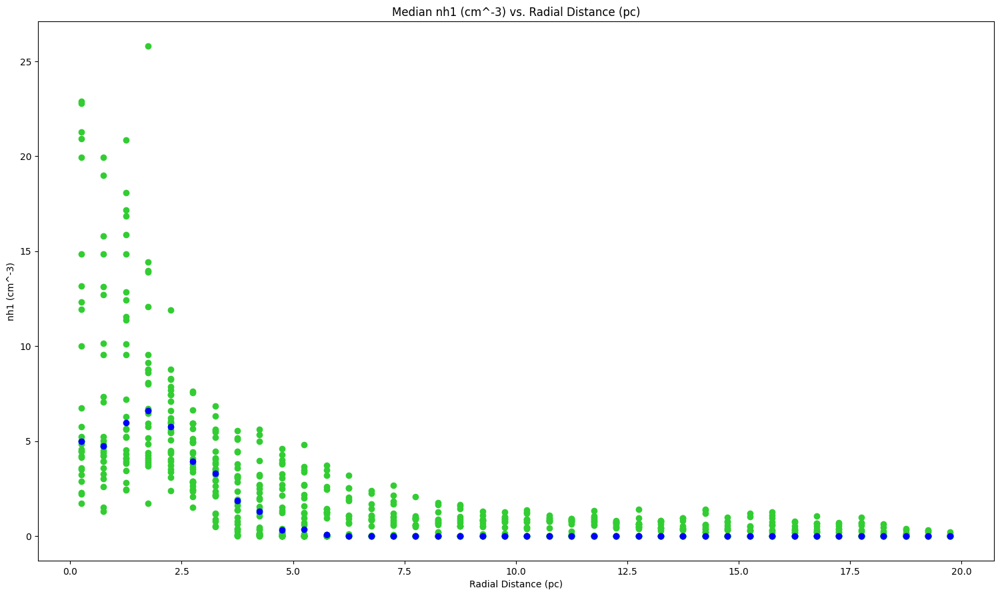

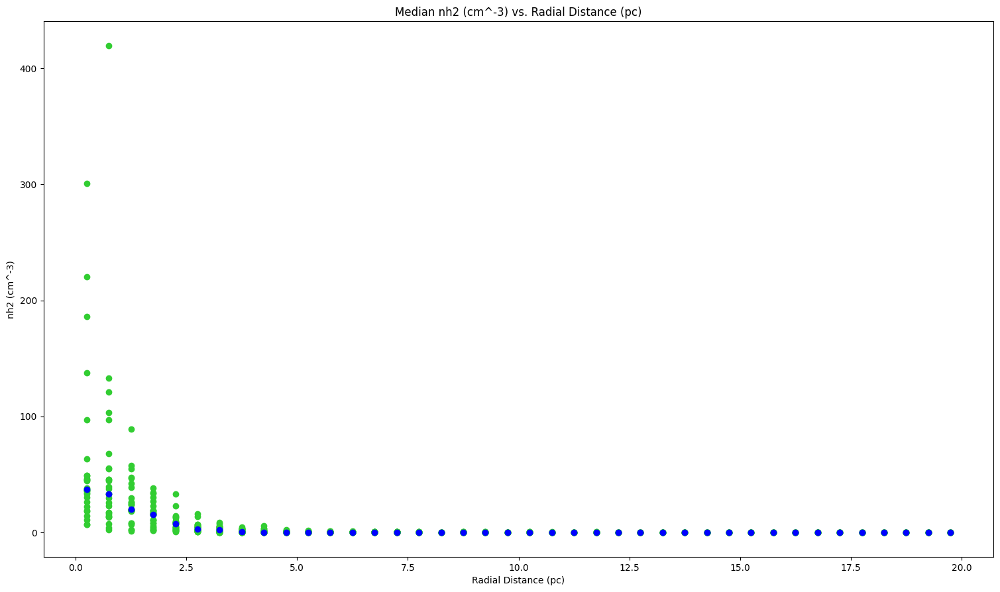

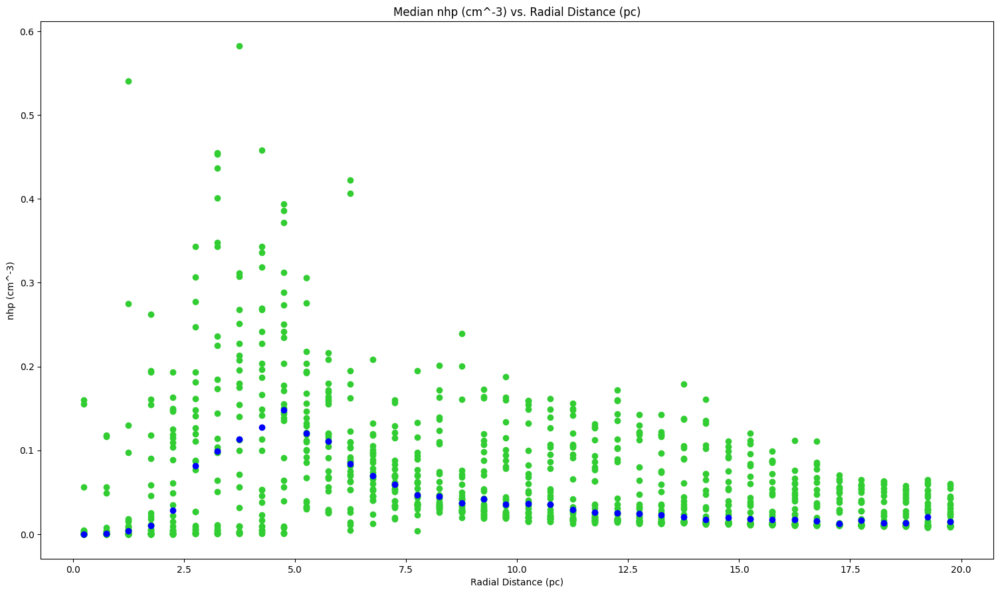

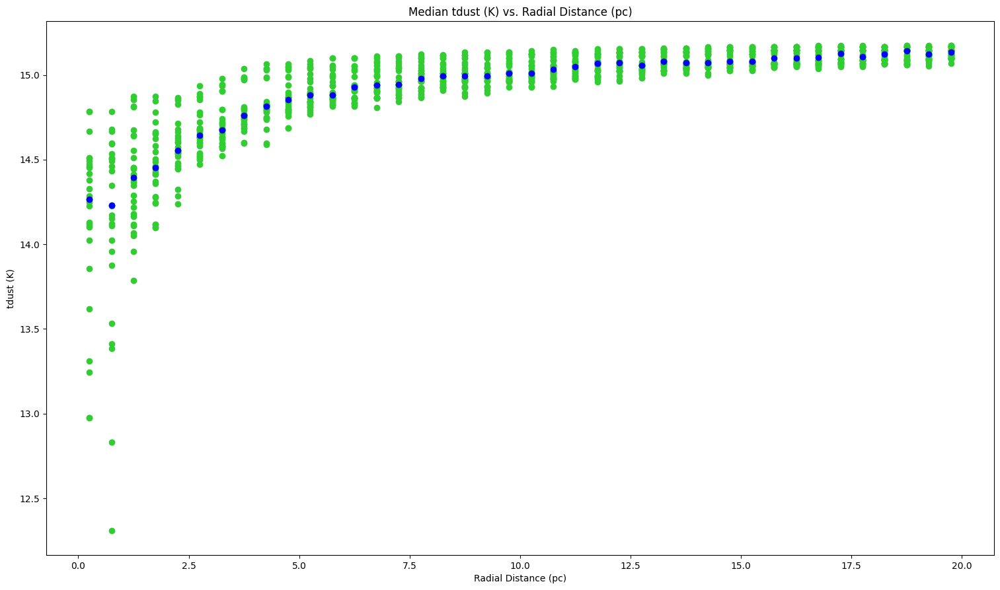

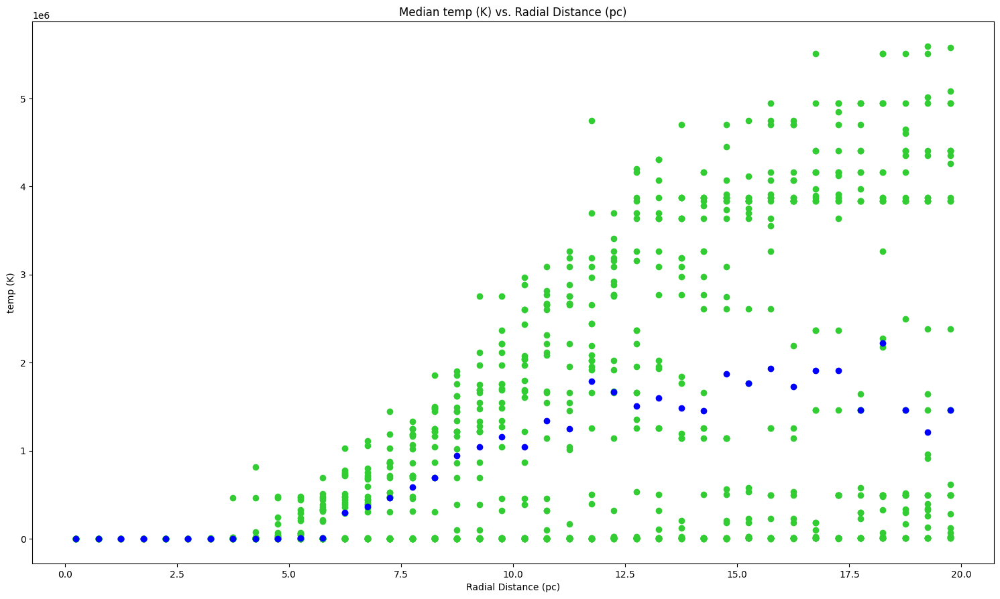

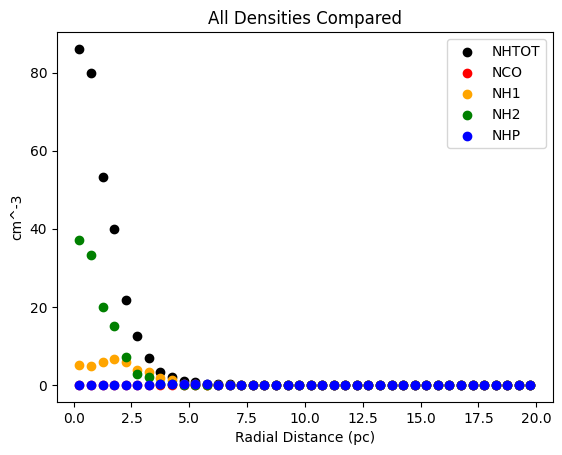

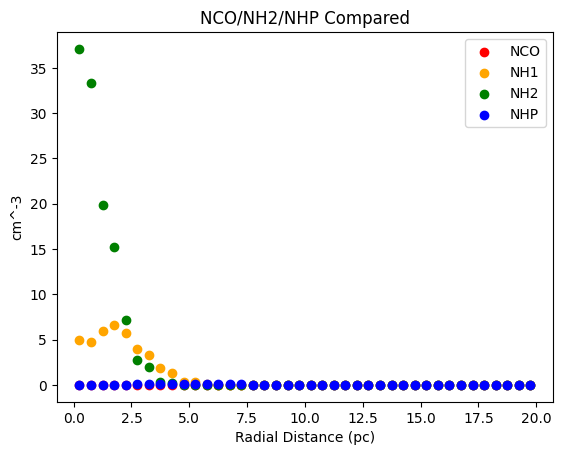

NHTOT
[8.60491829e+01 7.99748764e+01 5.31483955e+01 3.98599520e+01
 2.18725610e+01 1.25831797e+01 6.96466851e+00 3.37891328e+00
 2.15204167e+00 9.59065408e-01 8.00298512e-01 3.27082828e-01
 1.43438367e-01 1.20288350e-01 7.36725442e-02 7.31213279e-02
 6.15937738e-02 4.80471933e-02 4.23994157e-02 3.89218796e-02
 3.72045208e-02 4.02381048e-02 3.35701555e-02 2.67804530e-02
 3.24892951e-02 3.09589286e-02 2.33795703e-02 2.89329216e-02
 2.63384921e-02 2.32197982e-02 2.14642668e-02 2.22355120e-02
 2.40517398e-02 1.90578569e-02 1.84532818e-02 2.53592059e-02
 1.99899219e-02 2.81987111e-02 4.08967268e-02 2.61876797e-02]
NHI + NHP + 2*NH2
[7.91743427e+01 7.14378449e+01 4.56826915e+01 3.70222892e+01
 2.01706807e+01 9.60686488e+00 7.40045791e+00 2.61972183e+00
 1.81879728e+00 4.70505759e-01 4.99844026e-01 1.78480855e-01
 8.40048734e-02 6.97171632e-02 5.93432300e-02 4.65396042e-02
 4.51114094e-02 3.70220956e-02 4.16730726e-02 3.53441043e-02
 3.62758152e-02 3.53391301e-02 2.90176272e-02 2.60619470e-02

<Figure size 640x480 with 0 Axes>

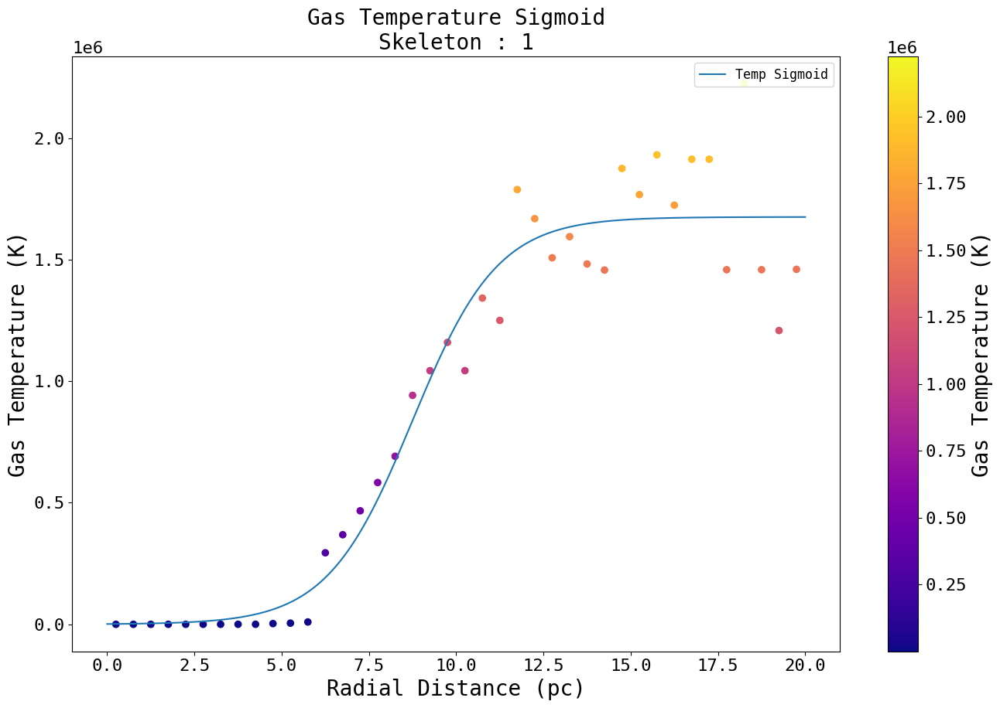

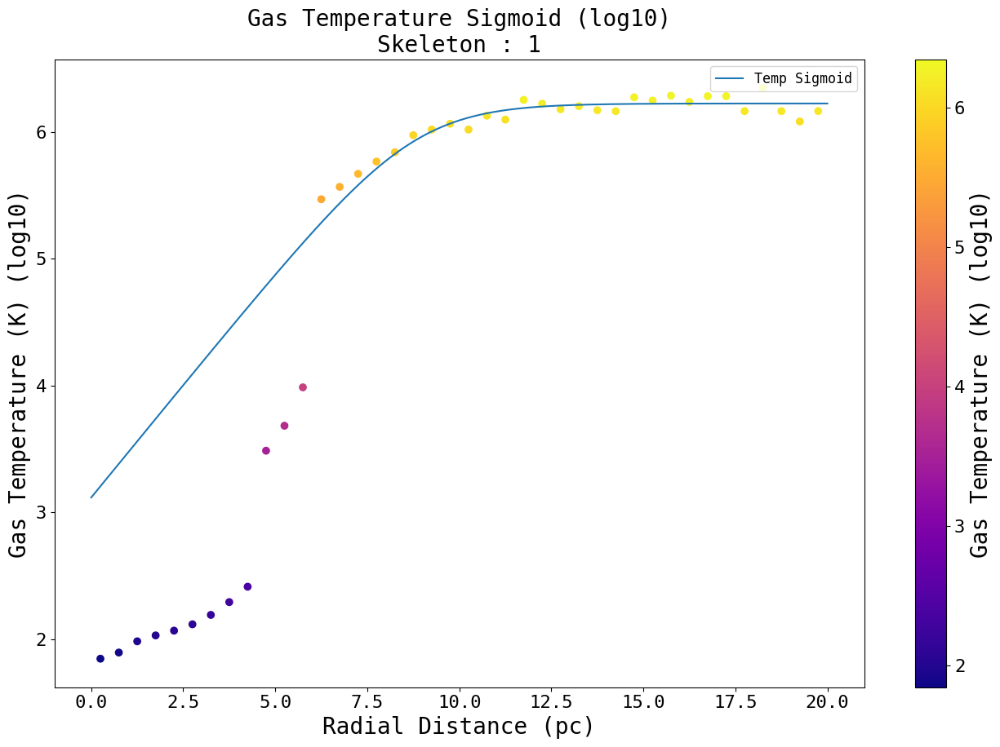

250K not present
1000K not present
Max Value : 86.0491828918457
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 39.92890969366832
            Iterations: 17
            Function evaluations: 91
            Gradient evaluations: 17


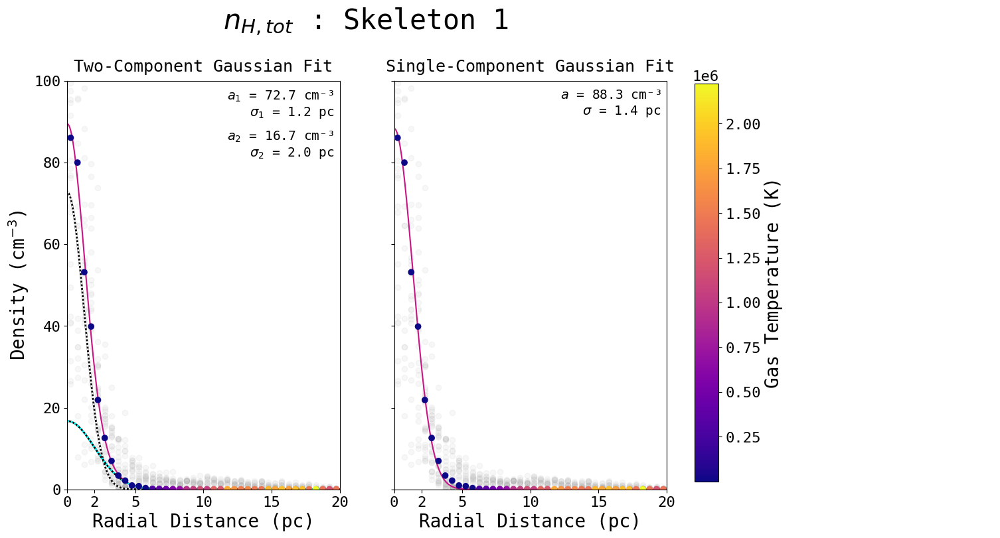

Max Value : 3.407813977673868e-07
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.167600195949135e-13
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


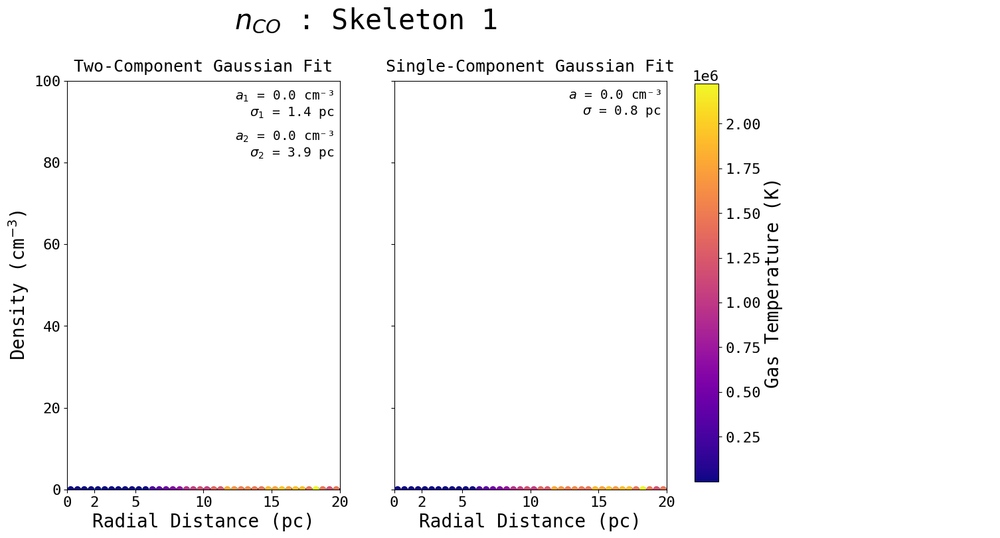

Max Value : 37.086360931396484
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 13.11295772041201
            Iterations: 21
            Function evaluations: 109
            Gradient evaluations: 21


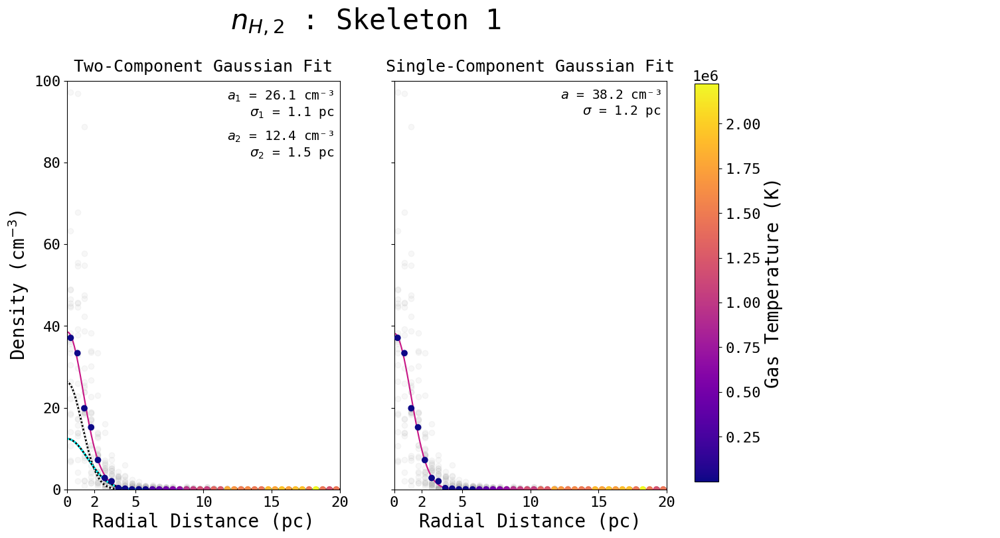

Max Value : 6.6138211488723755
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 9.960963093143695
            Iterations: 8
            Function evaluations: 47
            Gradient evaluations: 8


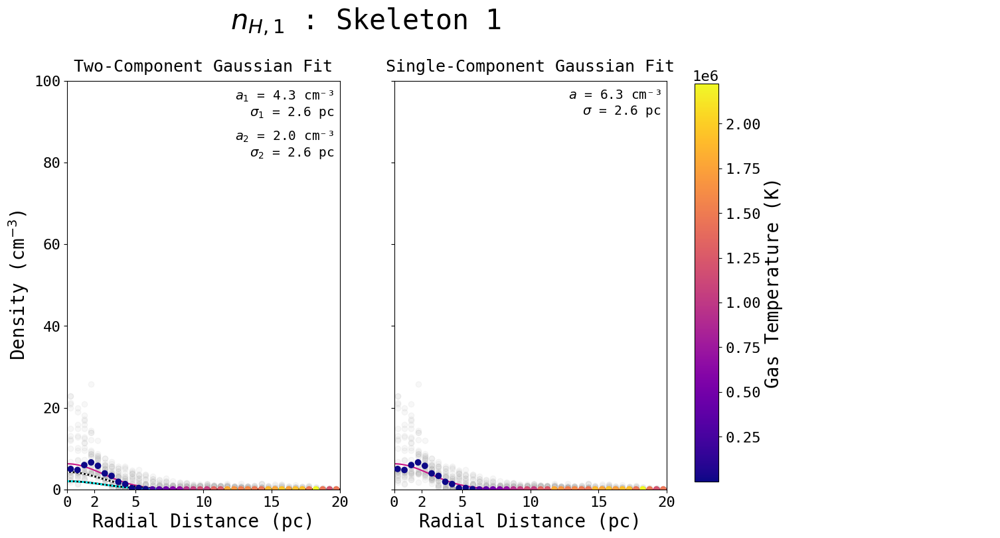

Max Value : 0.14825796335935593
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.0469206758779388
            Iterations: 16
            Function evaluations: 81
            Gradient evaluations: 16


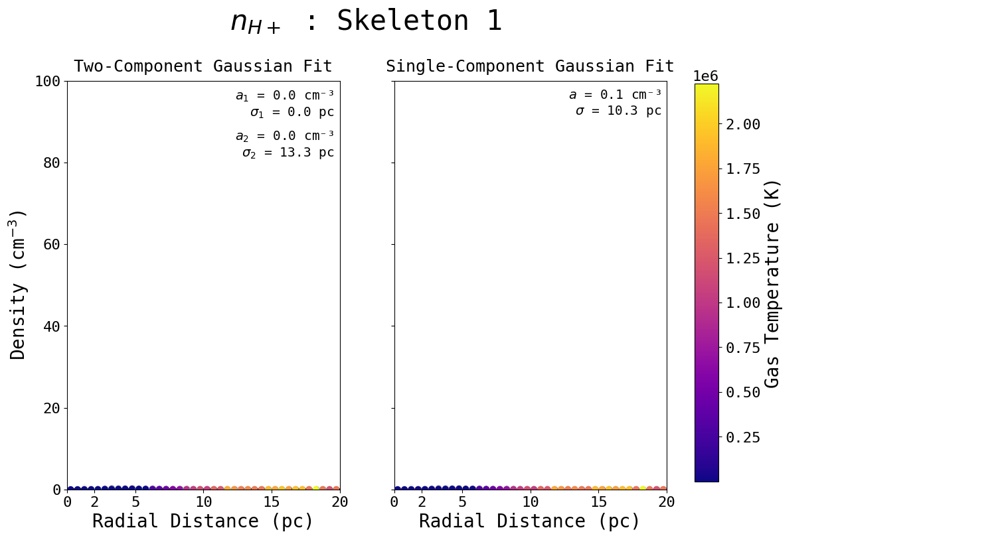

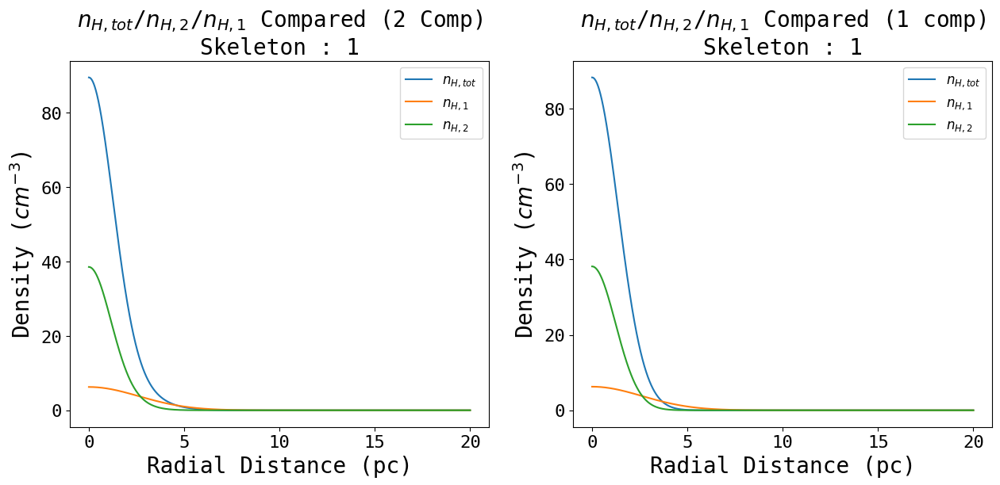

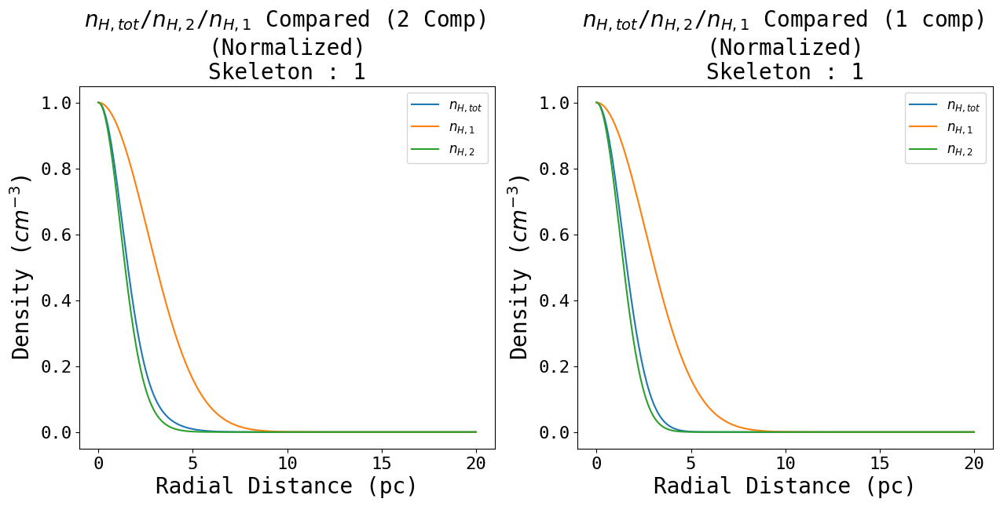

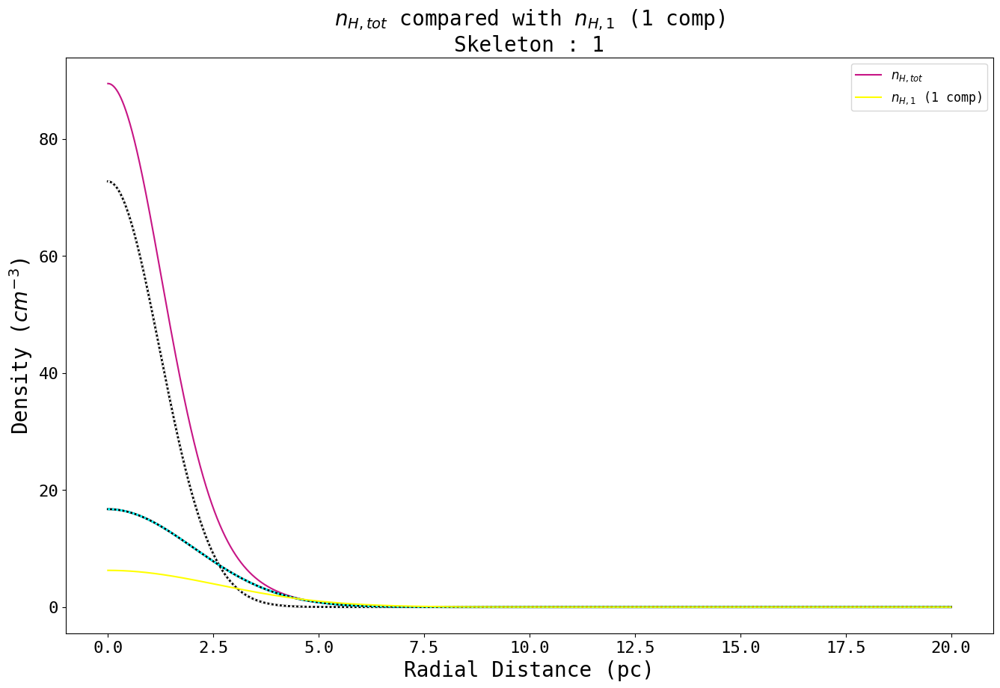

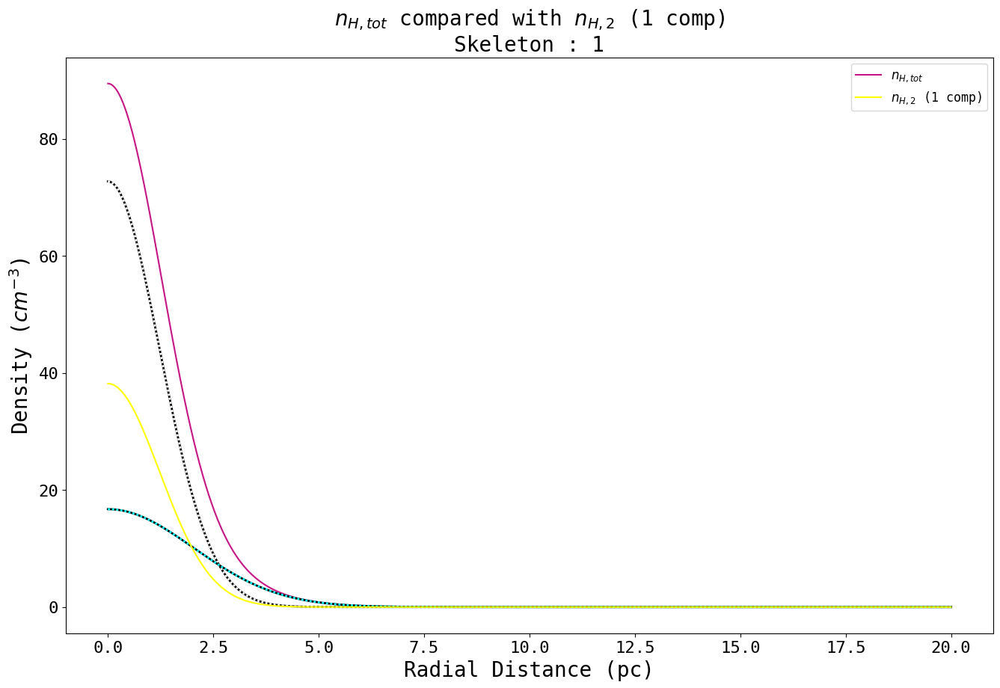

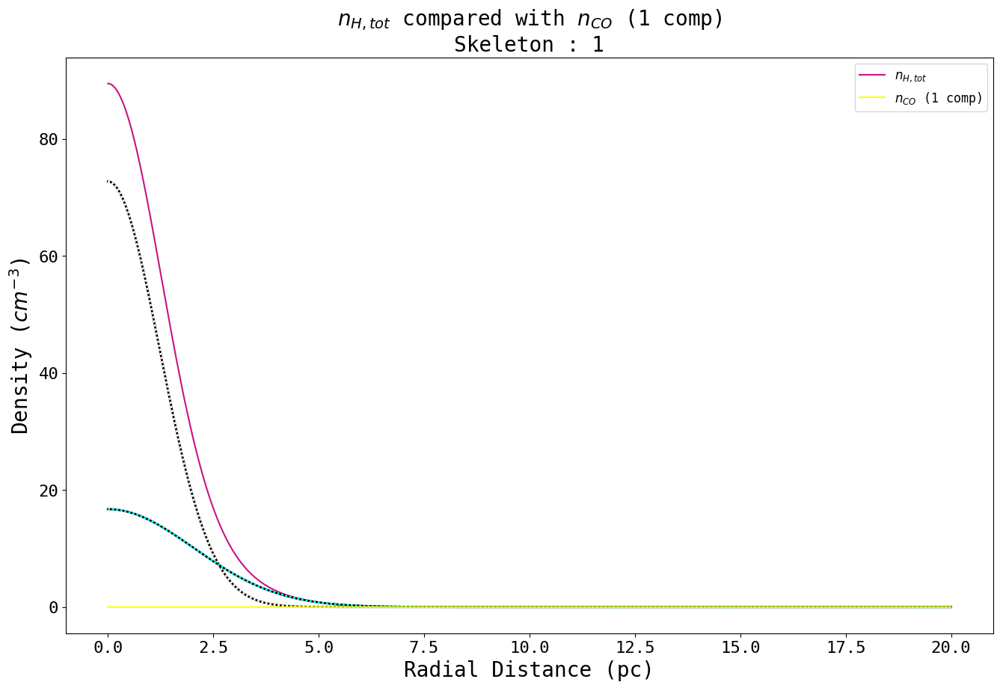

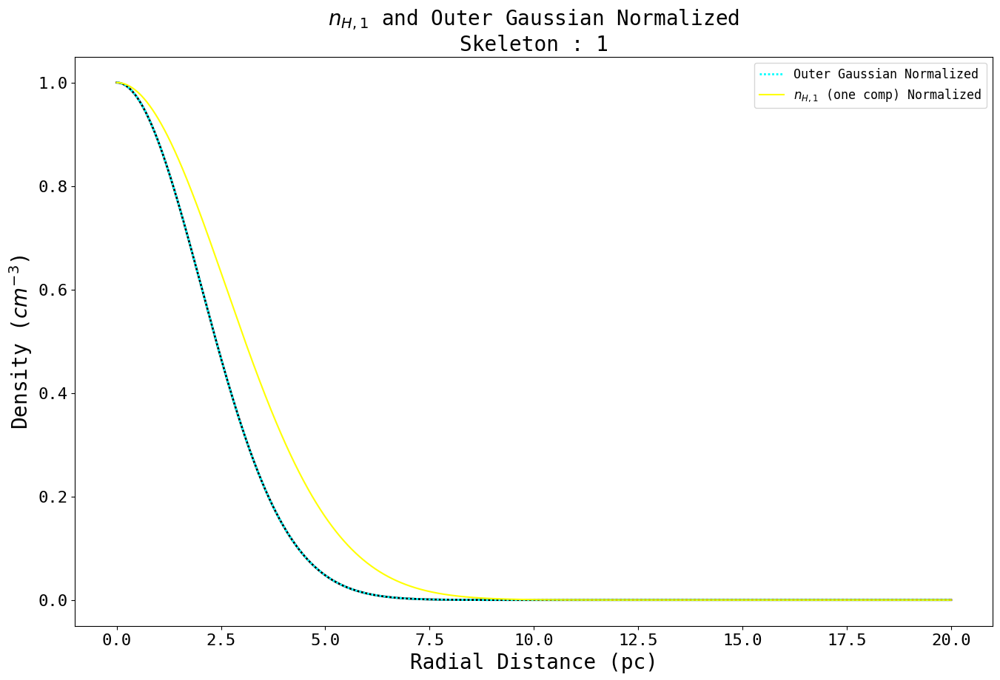

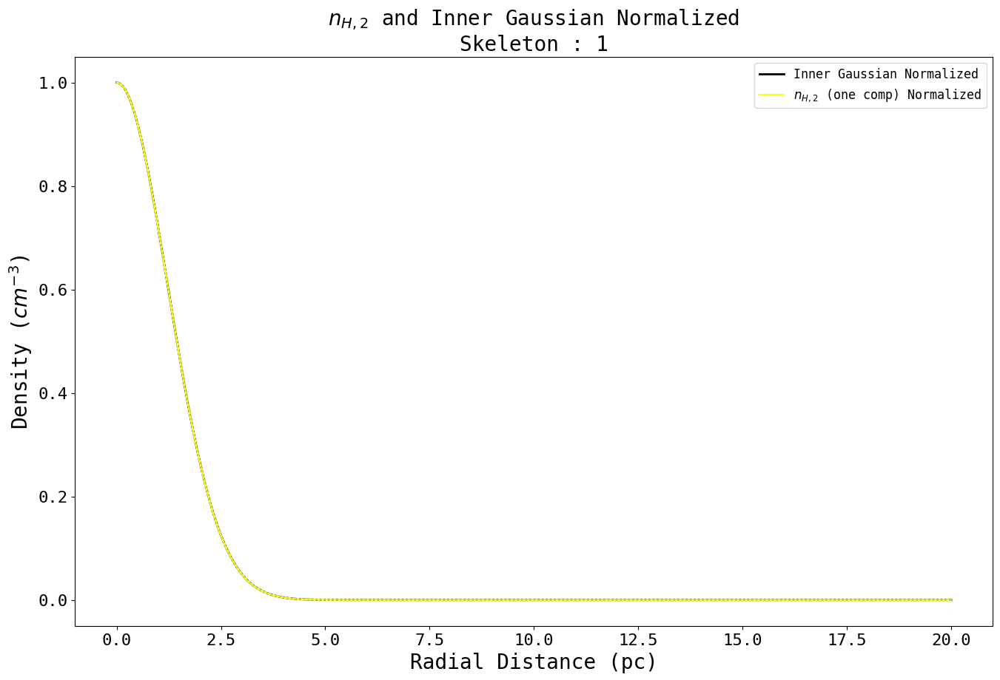

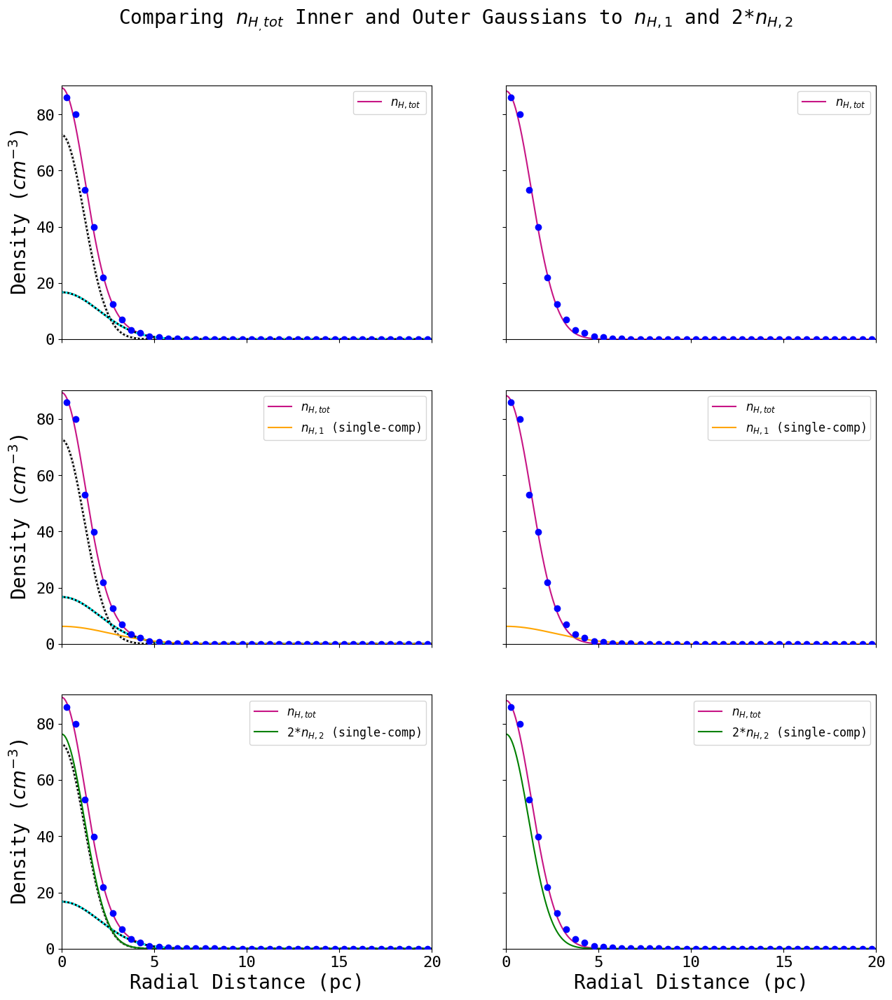

----------------------------------------
Skeleton 1
----------------------------------------


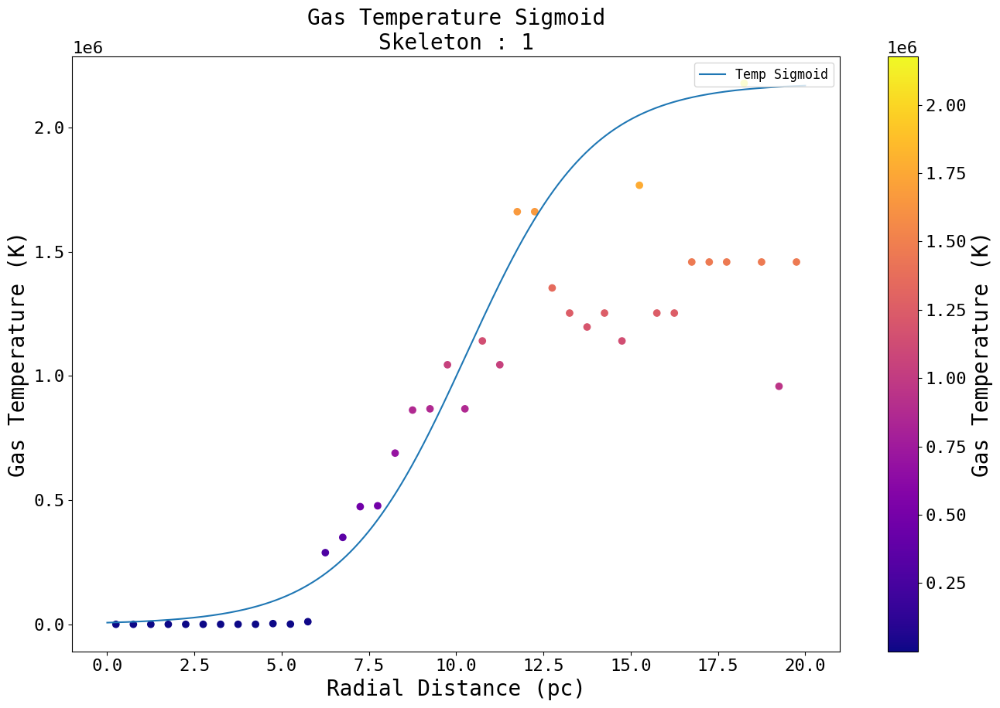

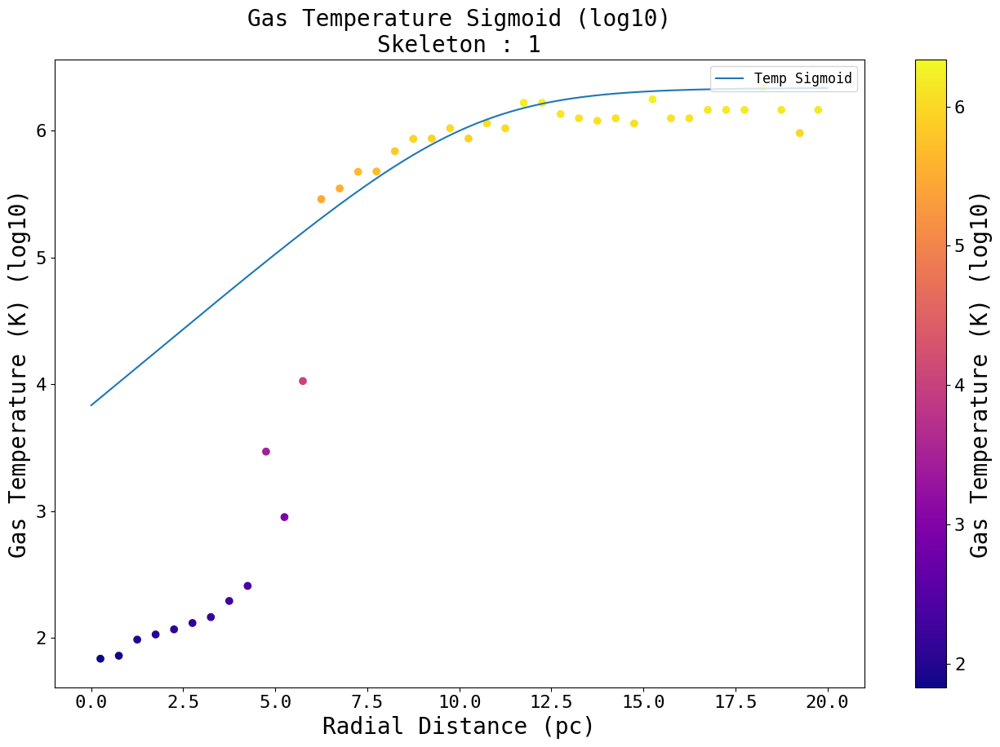

250K not present
1000K not present
Max Value : 94.58773803710938
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 58.122194107127896
            Iterations: 15
            Function evaluations: 81
            Gradient evaluations: 15


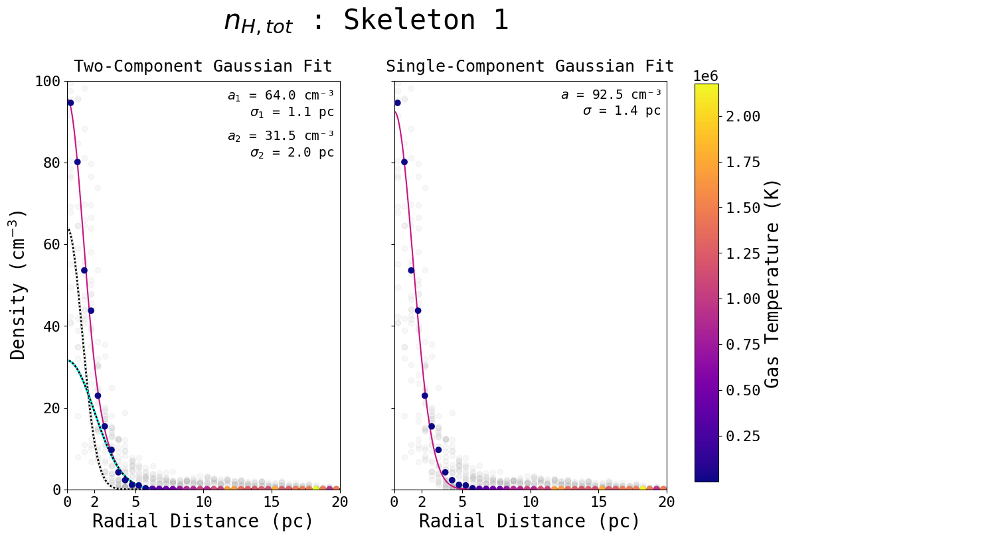

Max Value : 4.7515528933672613e-07
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2.4315459808588186e-13
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


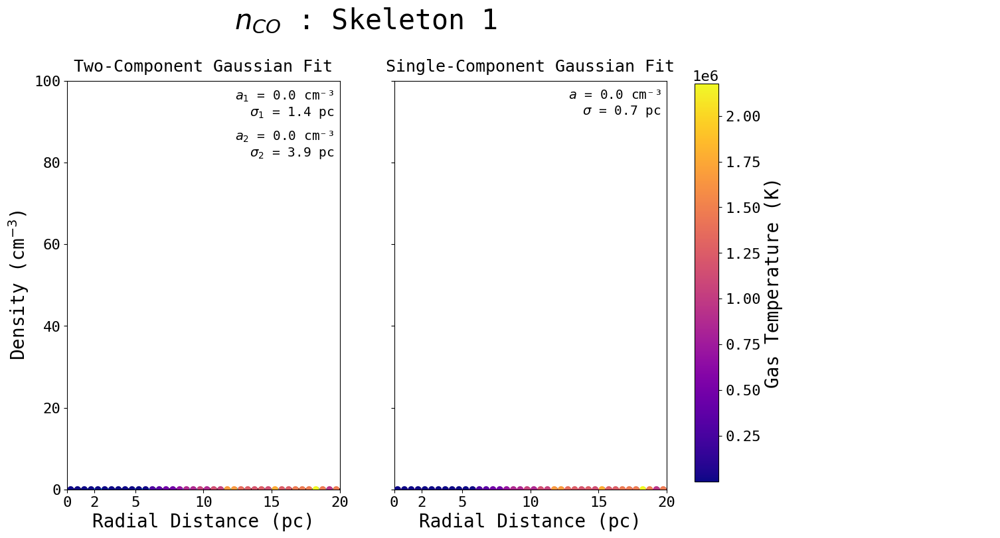

Max Value : 38.2813835144043
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 6.243343915260104
            Iterations: 16
            Function evaluations: 87
            Gradient evaluations: 16


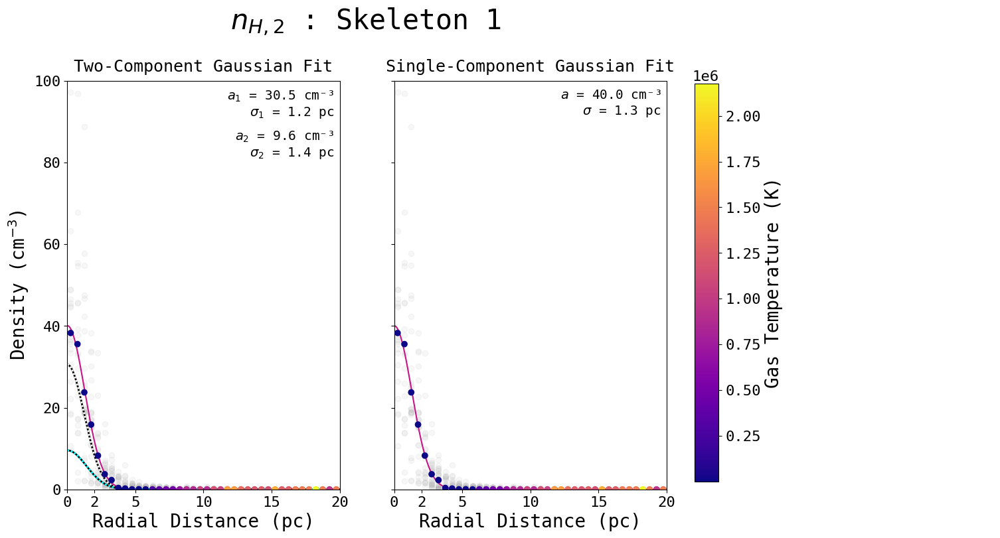

Max Value : 6.599679946899414
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 10.593983348165477
            Iterations: 7
            Function evaluations: 41
            Gradient evaluations: 7


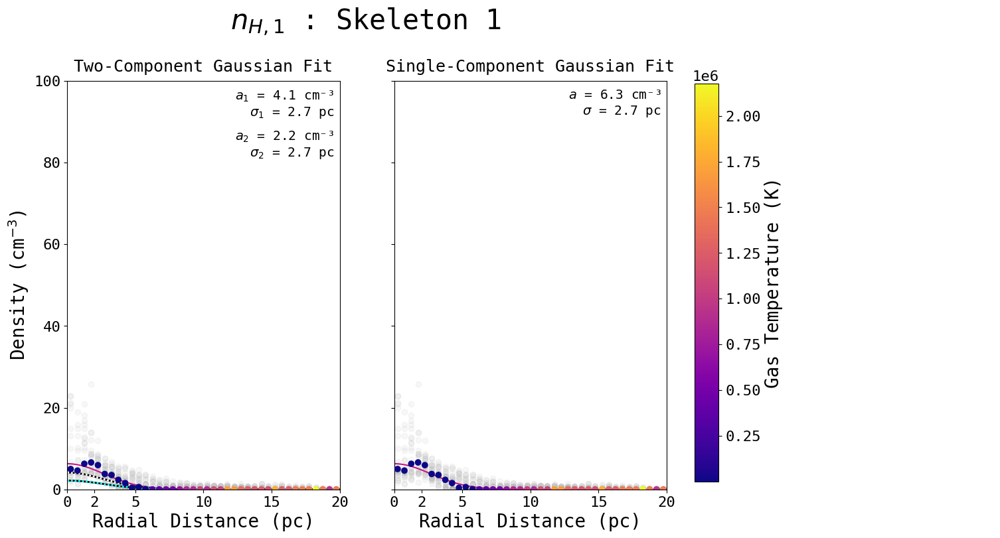

Max Value : 0.15077532827854156
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.05043014217163665
            Iterations: 16
            Function evaluations: 81
            Gradient evaluations: 16


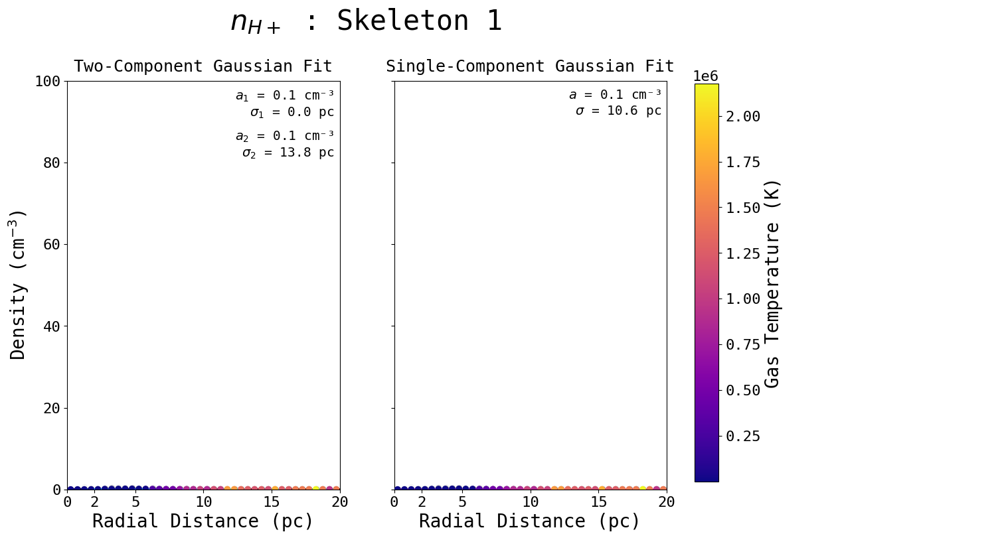

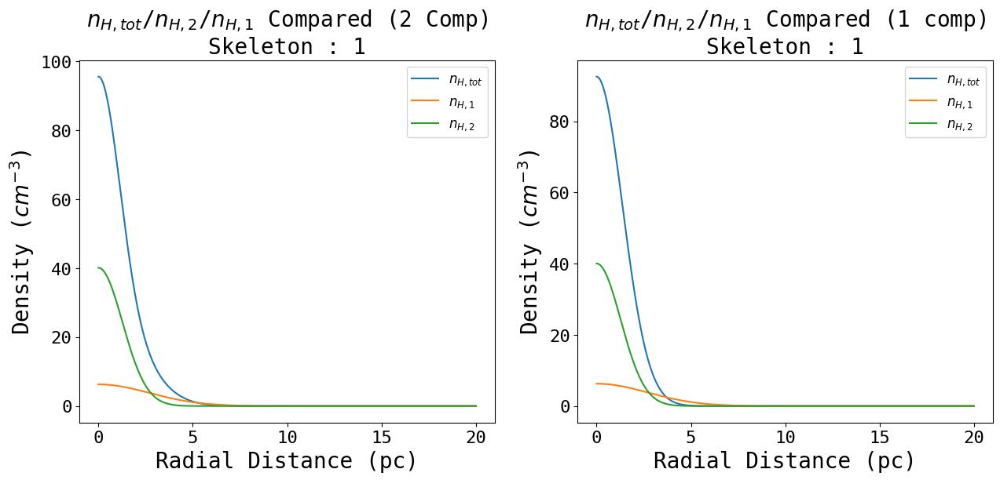

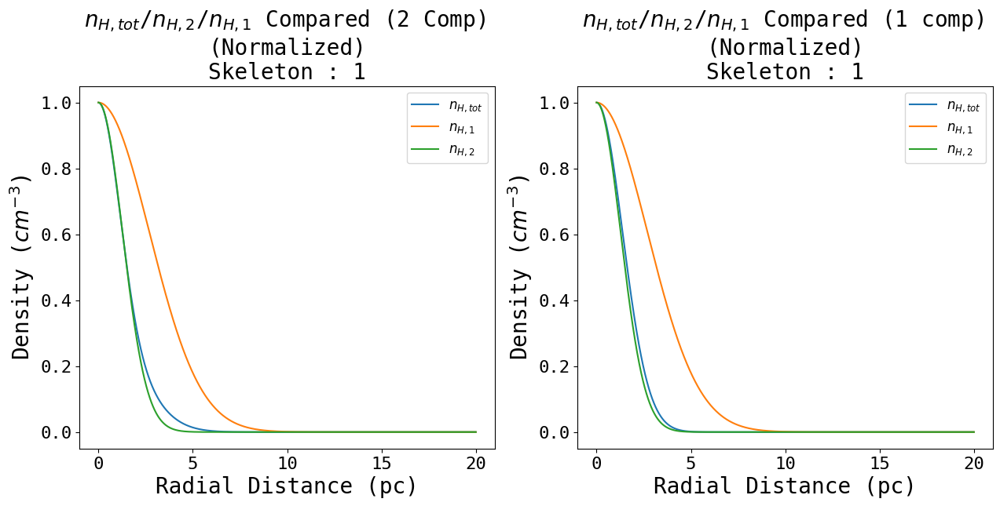

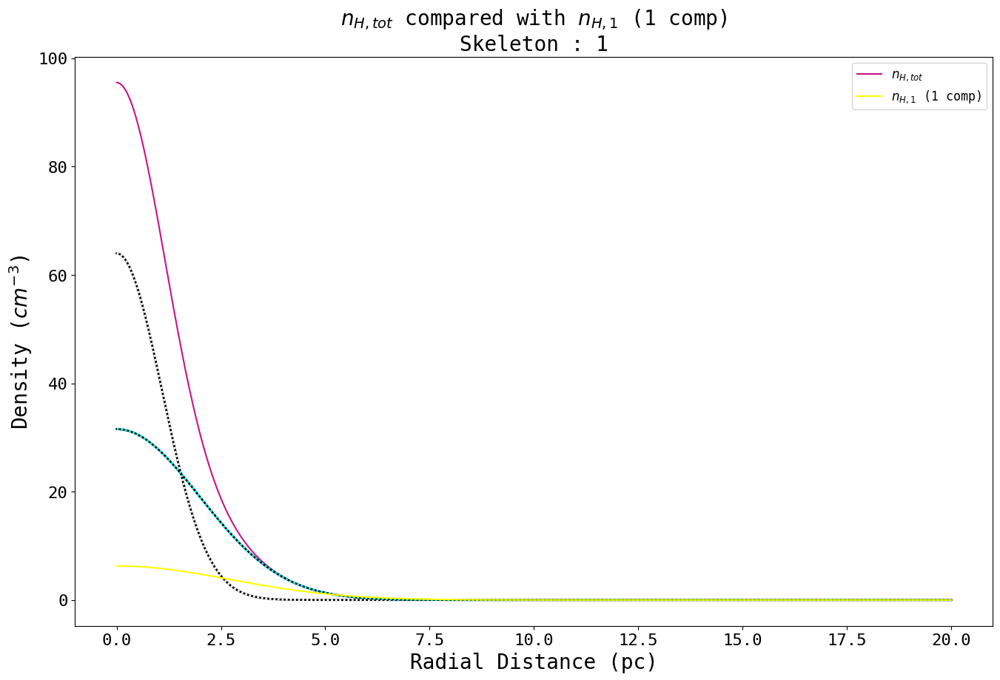

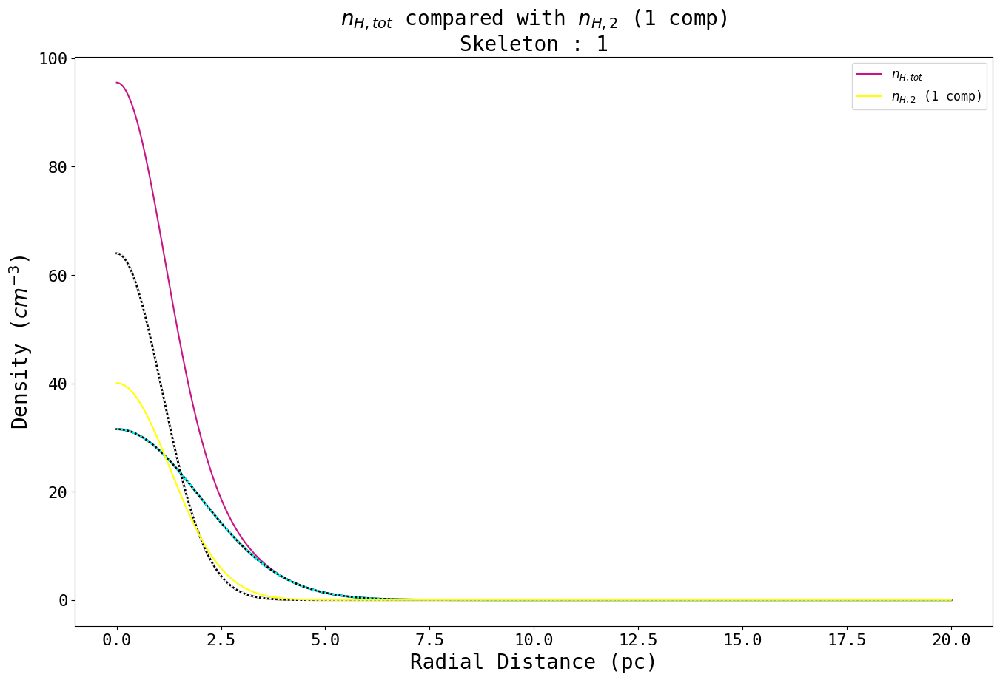

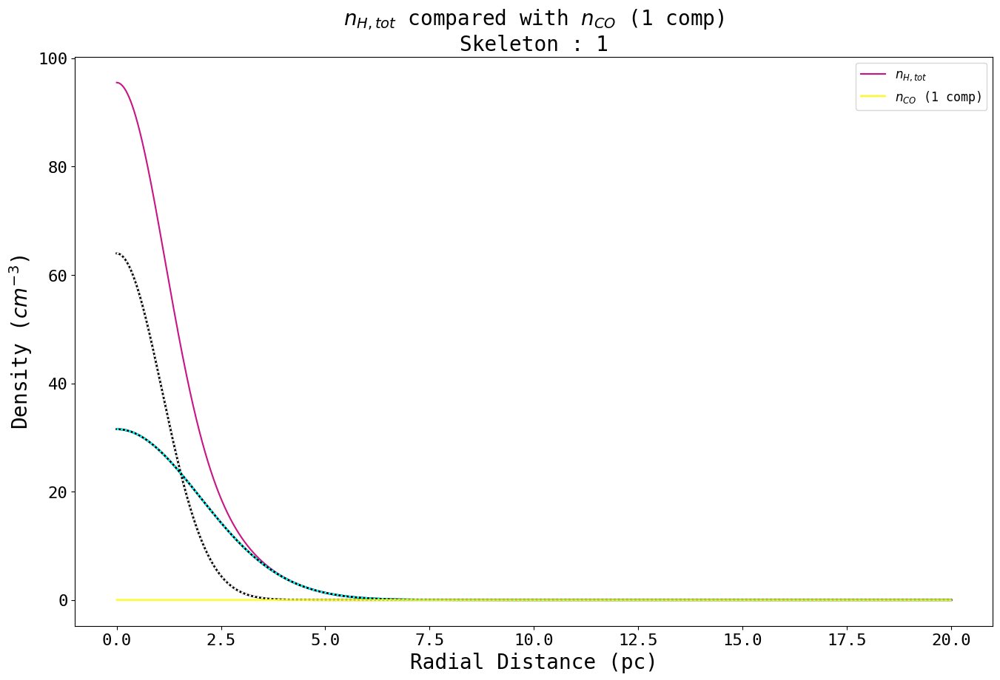

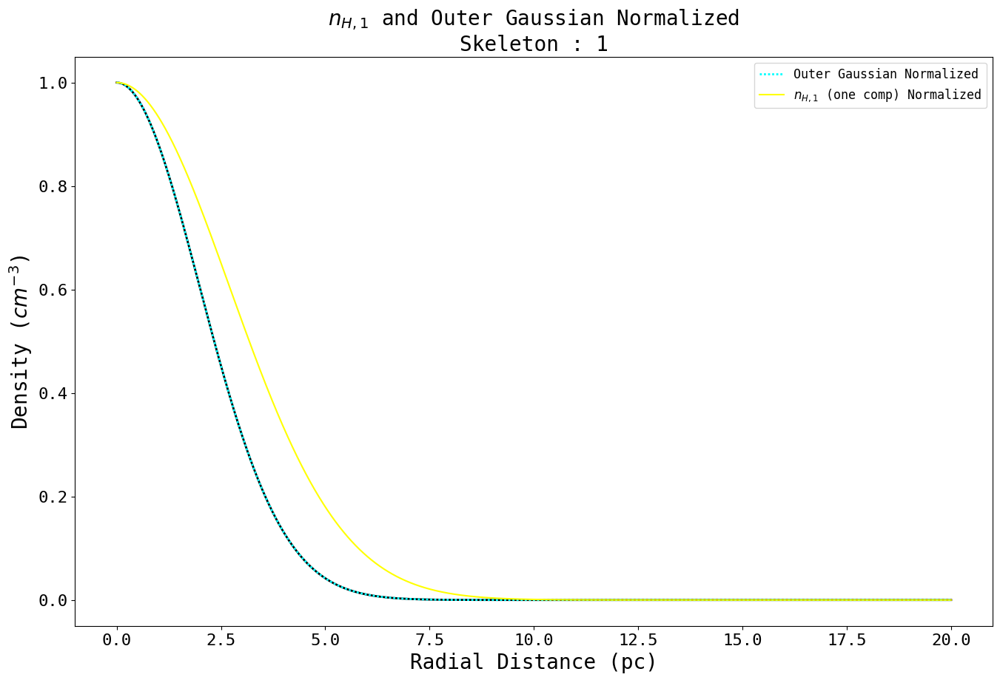

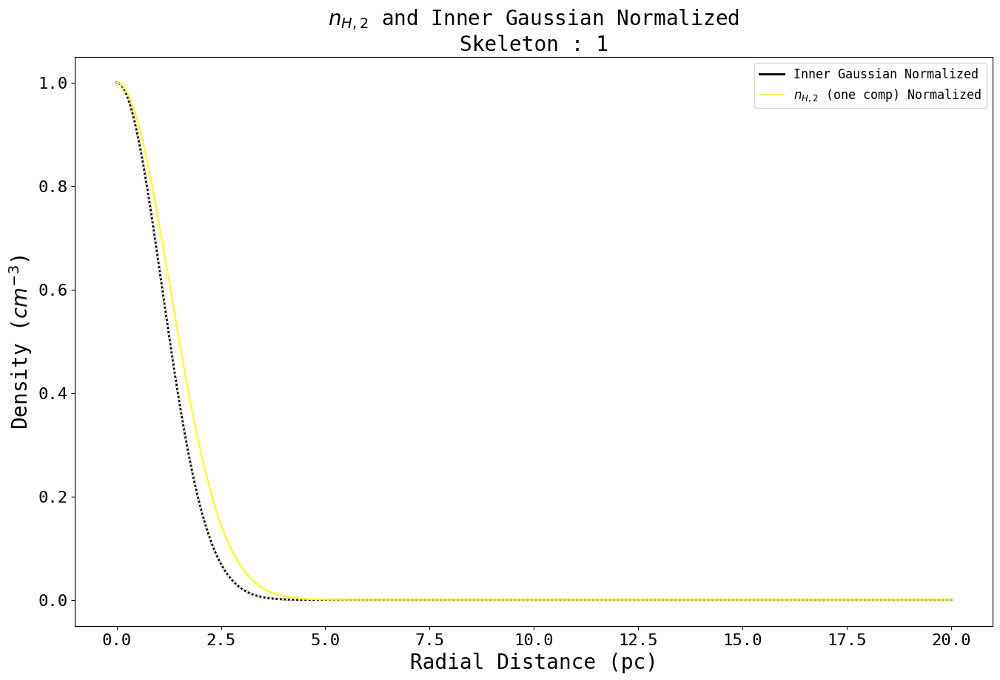

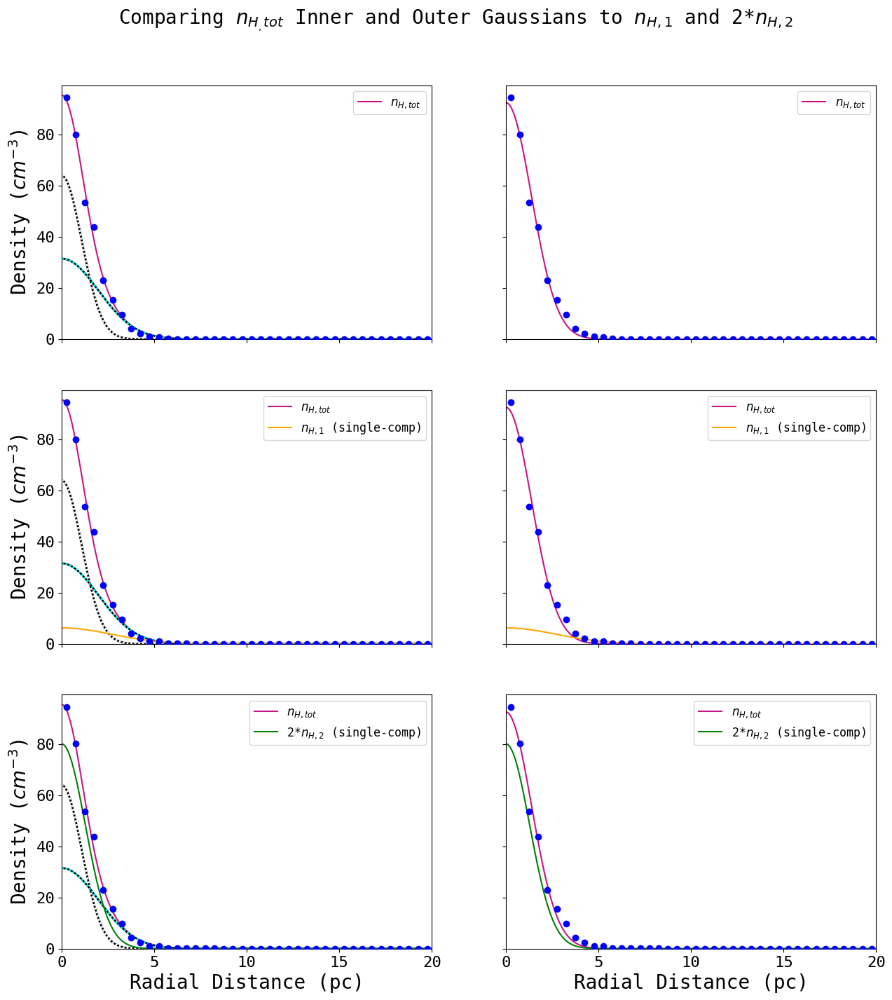

----------------------------------------
Skeleton 1
----------------------------------------


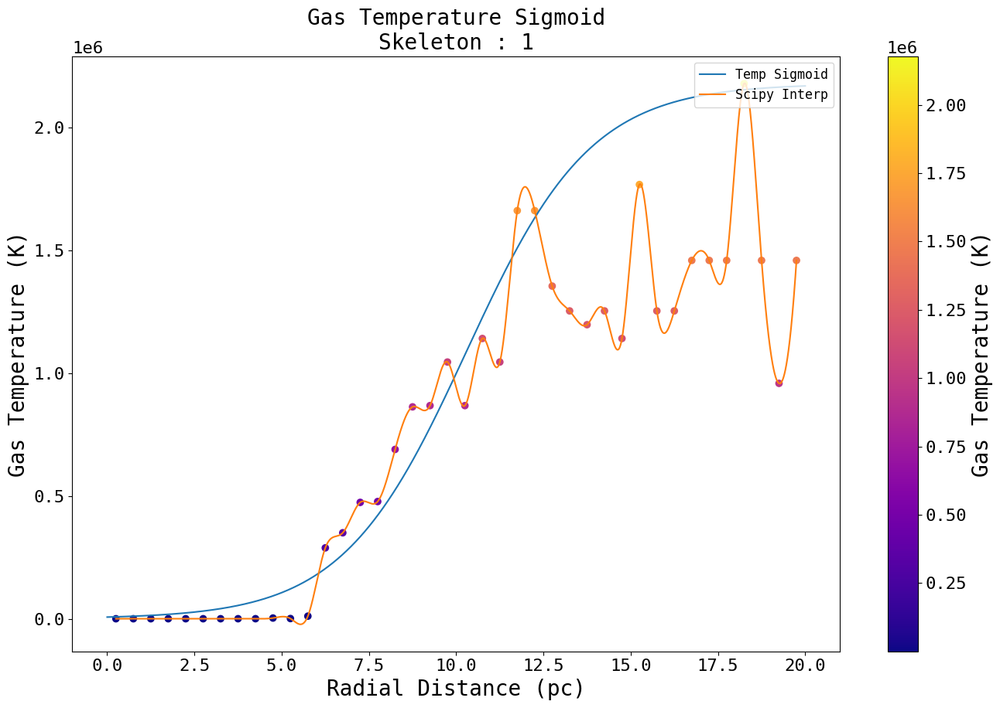

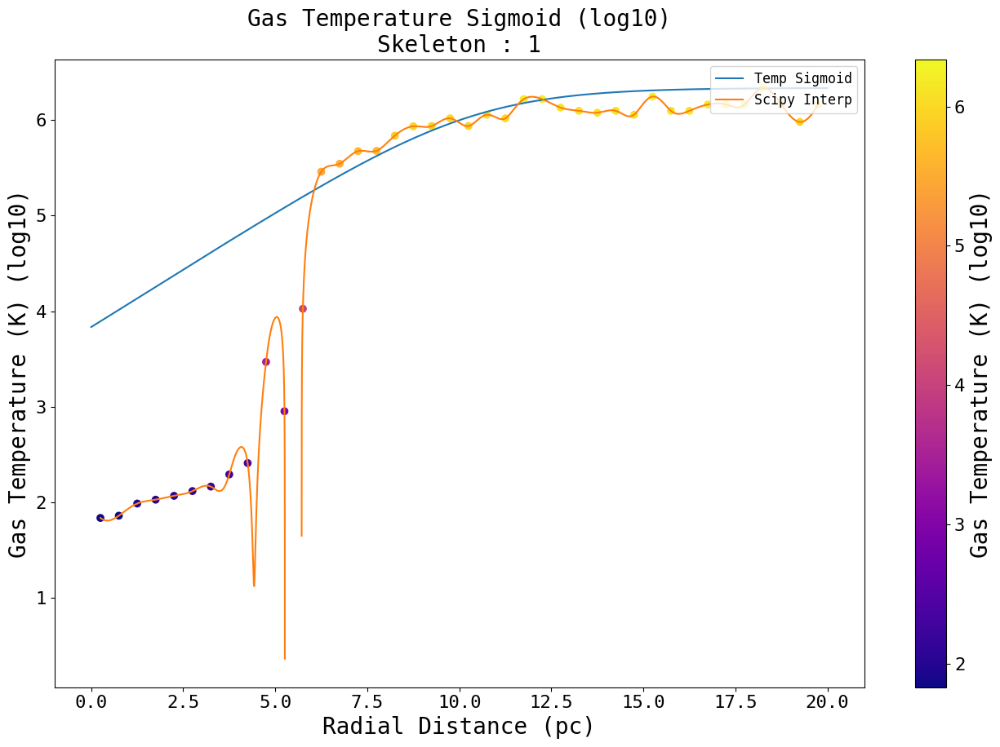

Max Value : 94.58773803710938
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.4928095080666304
            Iterations: 31
            Function evaluations: 167
            Gradient evaluations: 31


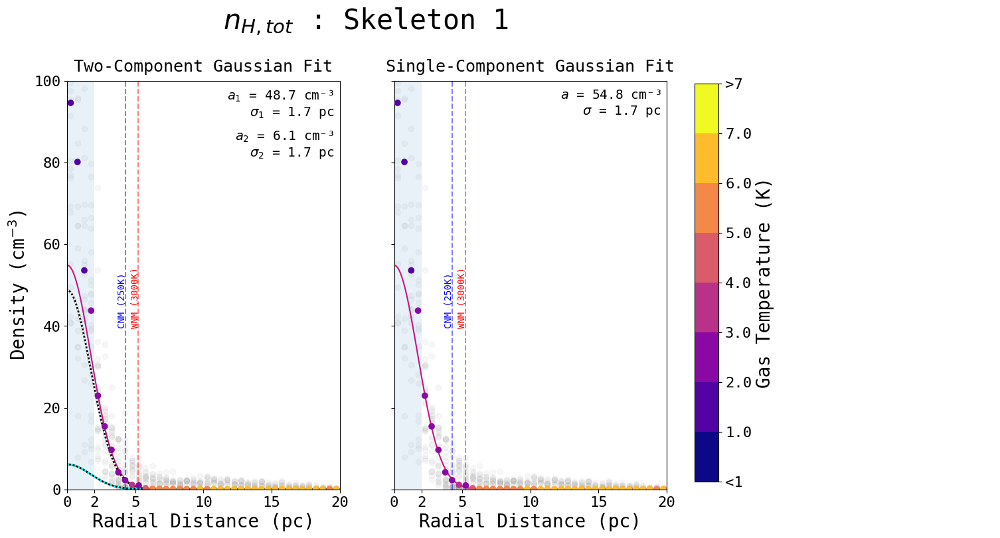

Max Value : 4.7515528933672613e-07
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.150841852180011e-13
            Iterations: 1
            Function evaluations: 5
            Gradient evaluations: 1


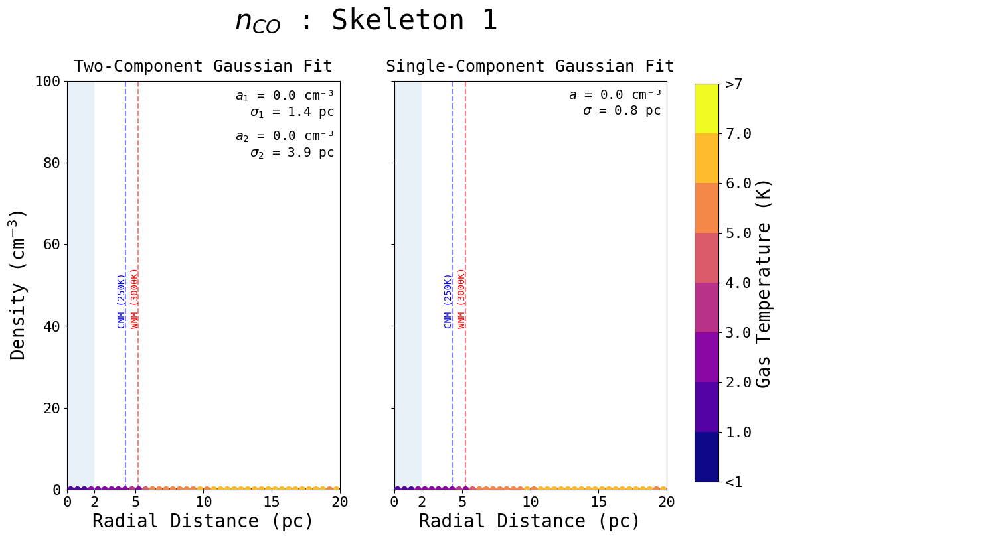

Max Value : 38.2813835144043
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 87.5621950963968
            Iterations: 2
            Function evaluations: 10
            Gradient evaluations: 2


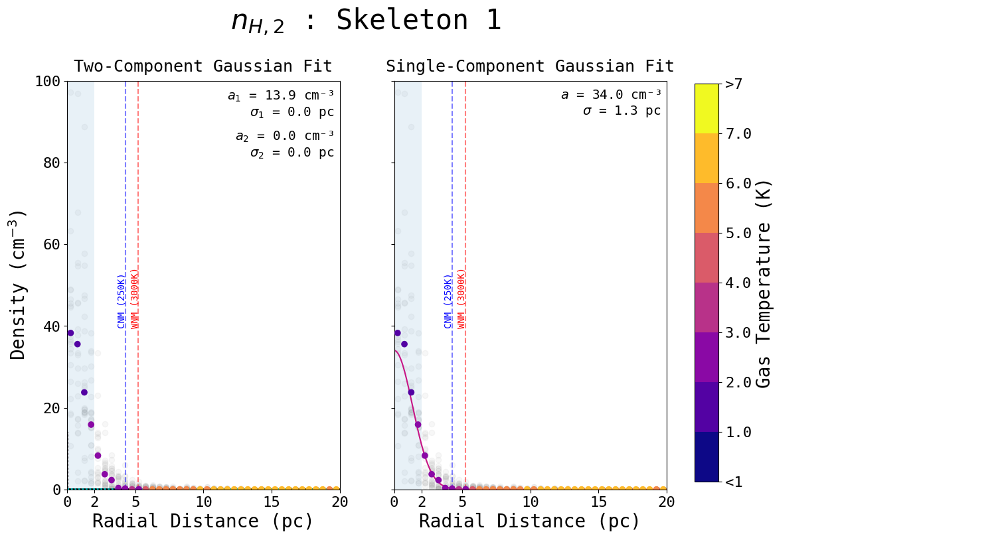

Max Value : 6.599679946899414
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1.1436004955484687
            Iterations: 9
            Function evaluations: 49
            Gradient evaluations: 9


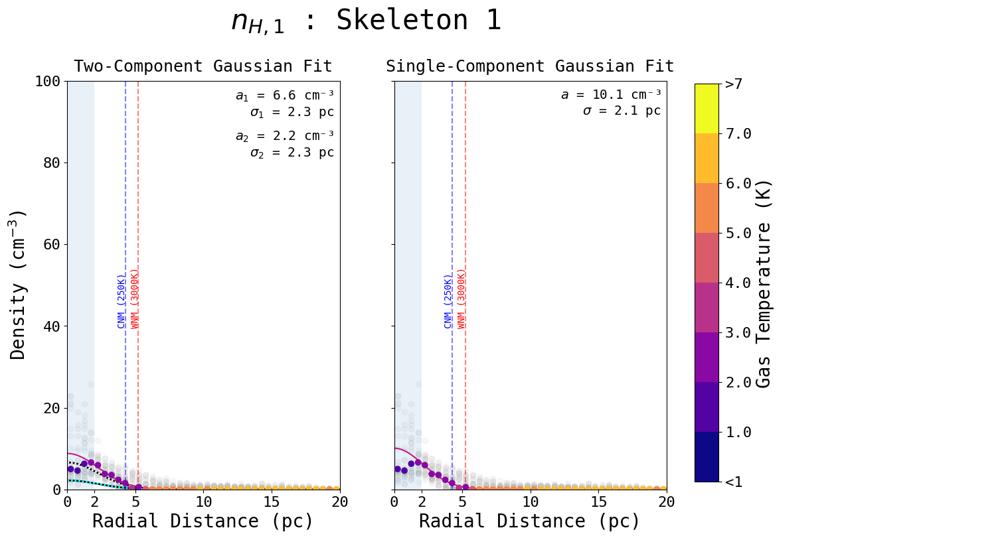

Max Value : 0.15077532827854156
Std : 5.771698190307598
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.016913672154608664
            Iterations: 14
            Function evaluations: 73
            Gradient evaluations: 14


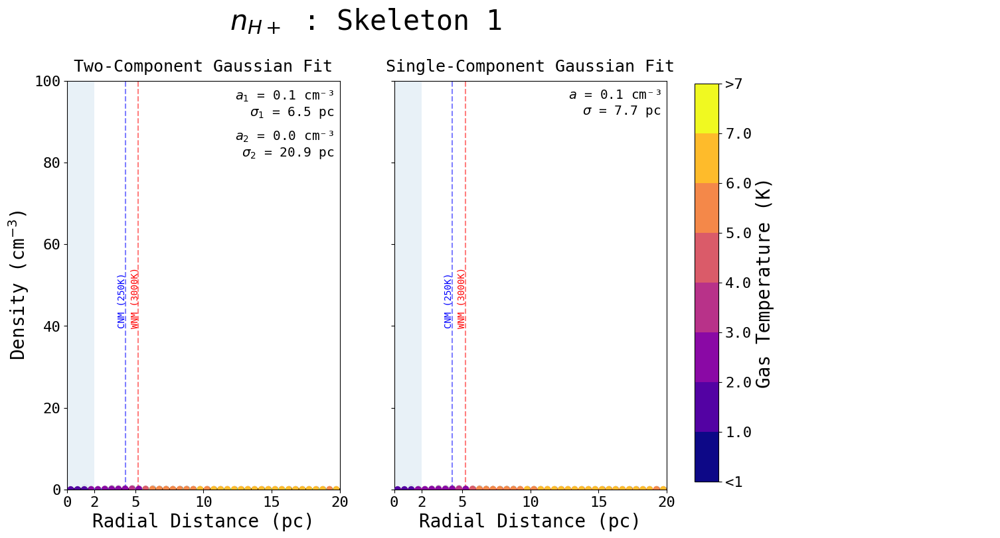

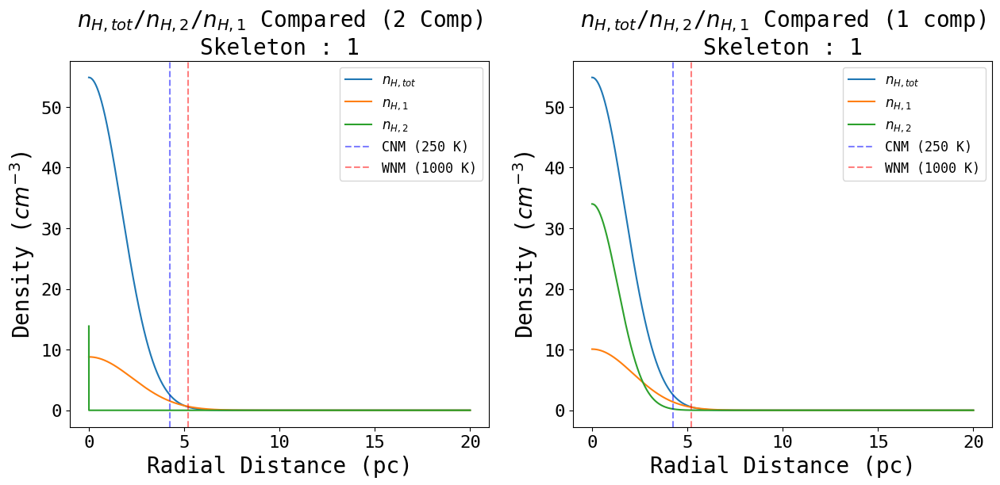

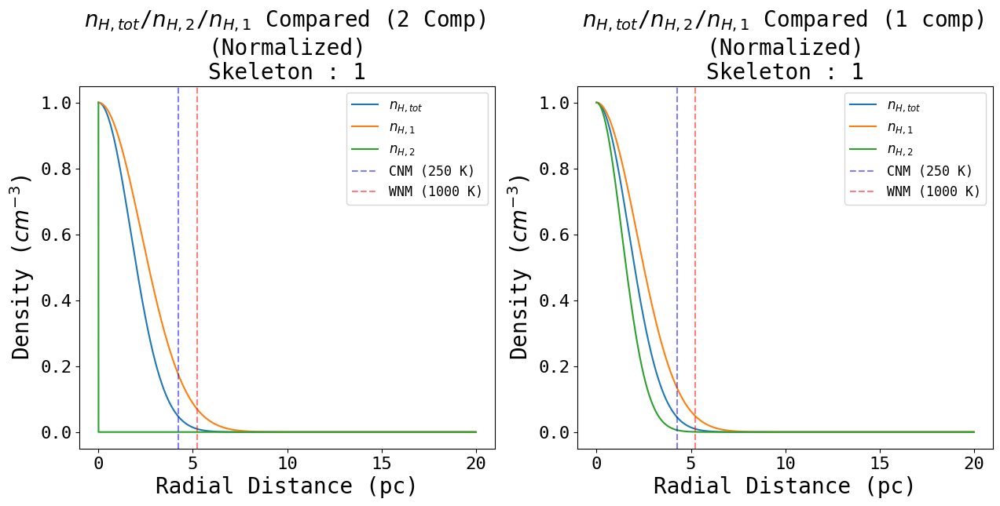

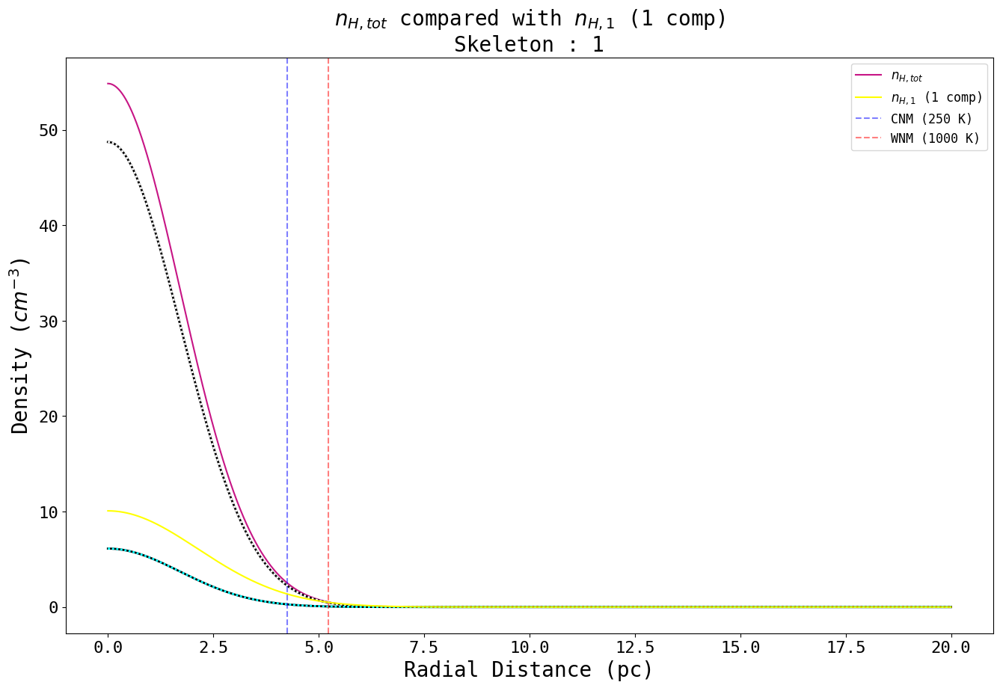

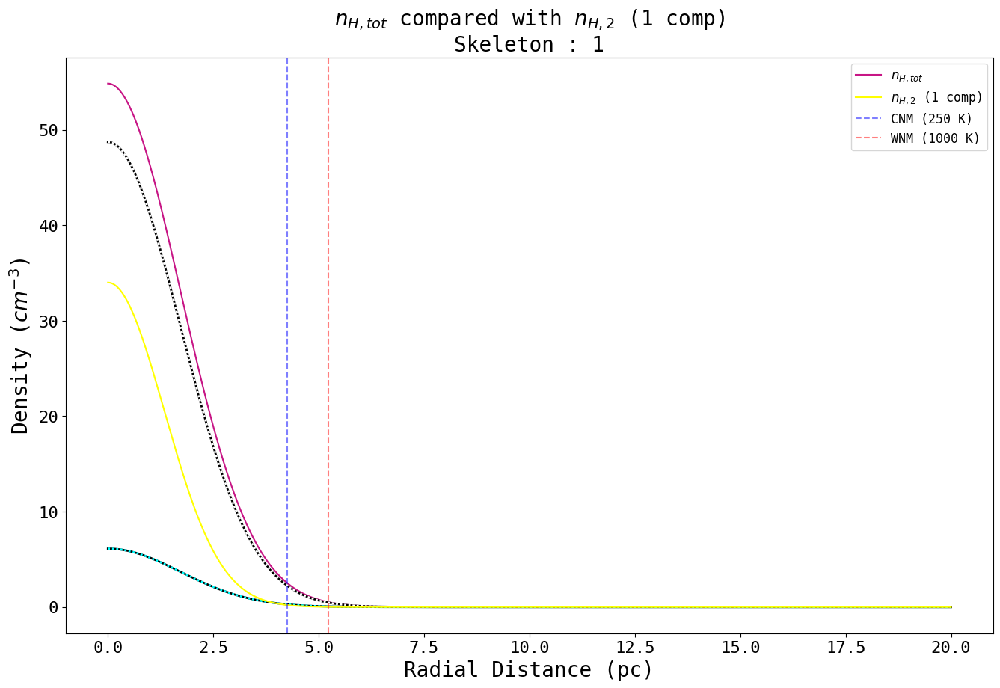

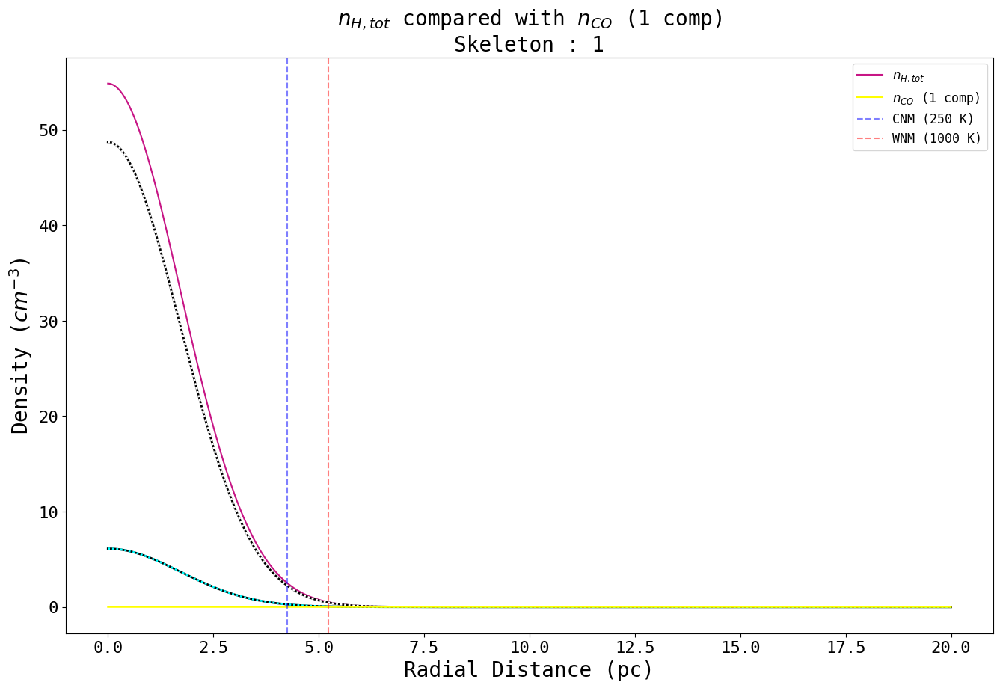

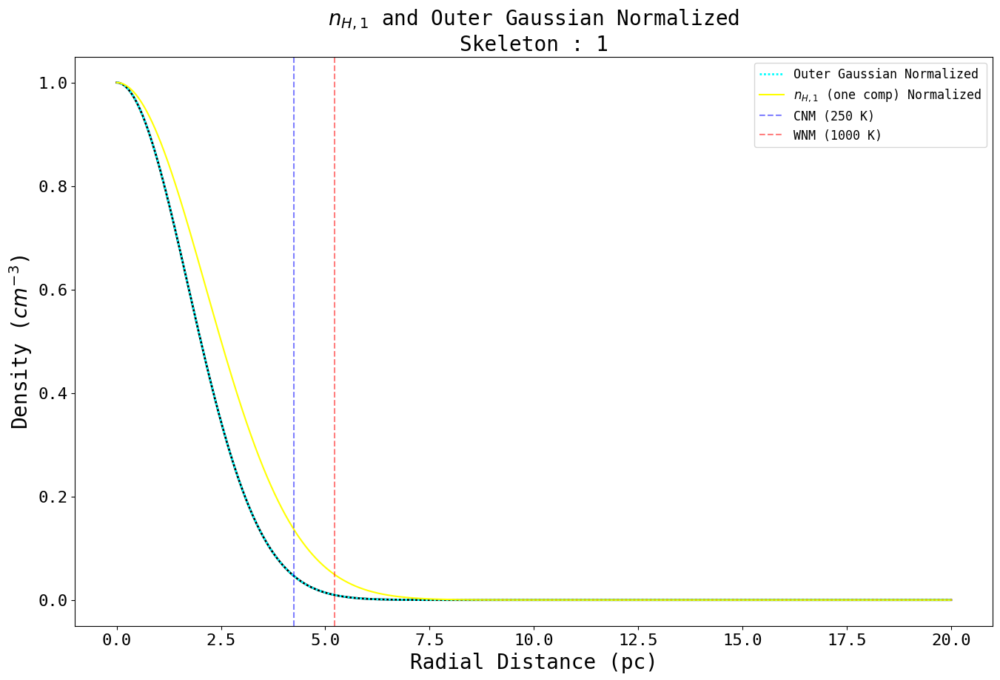

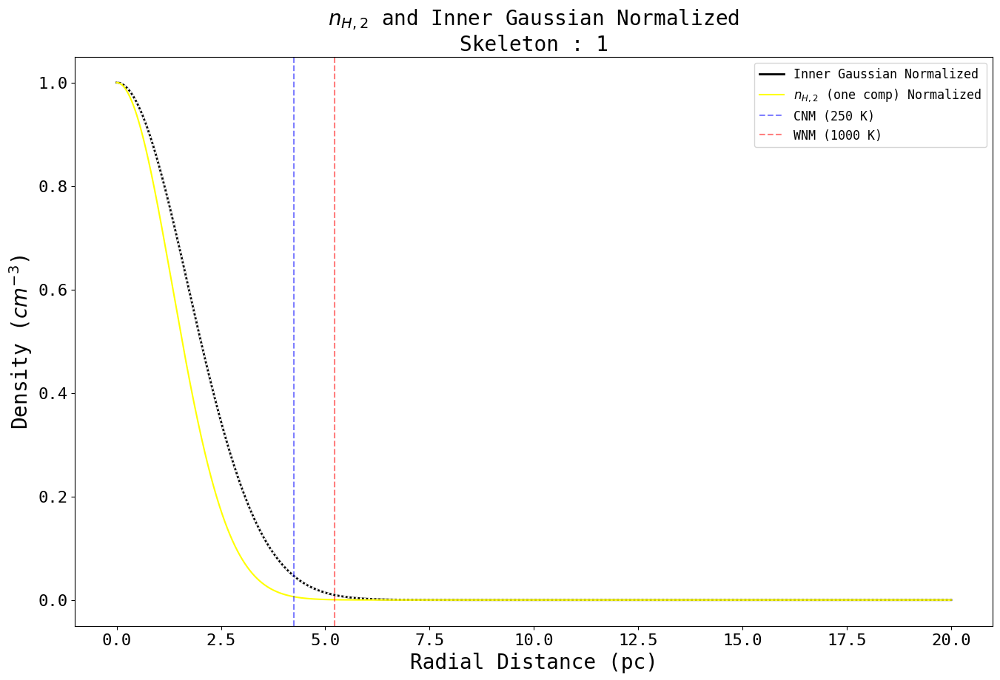

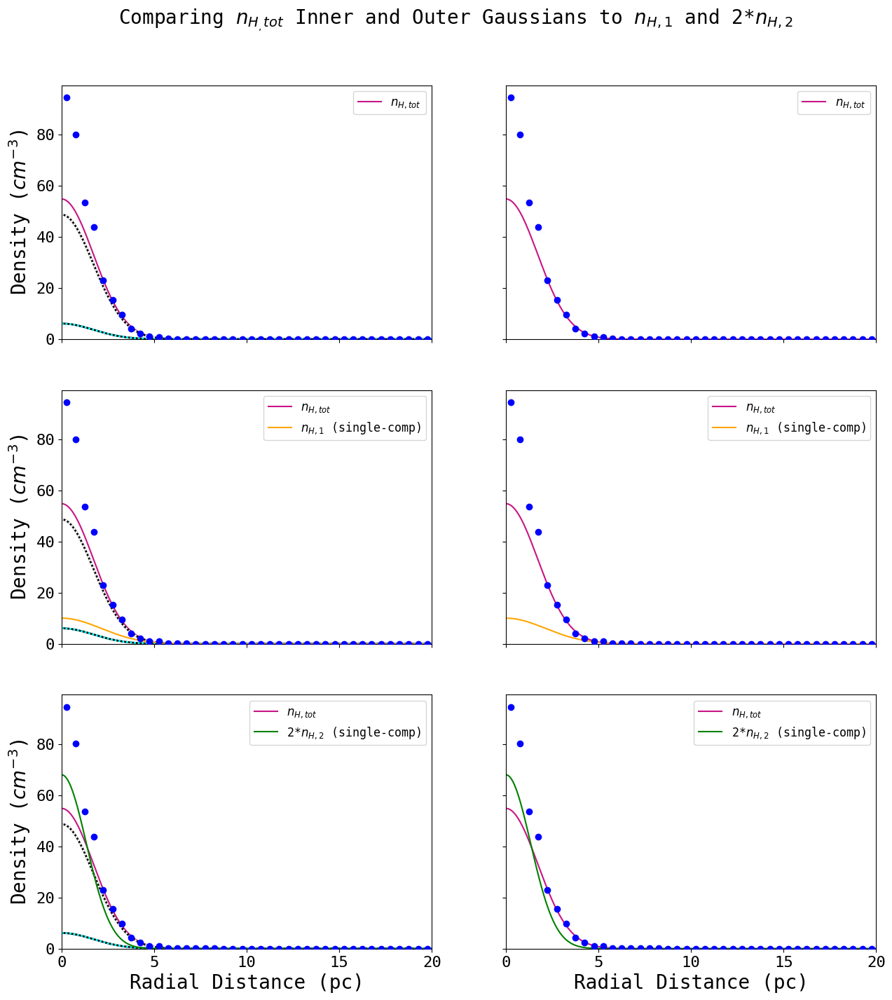

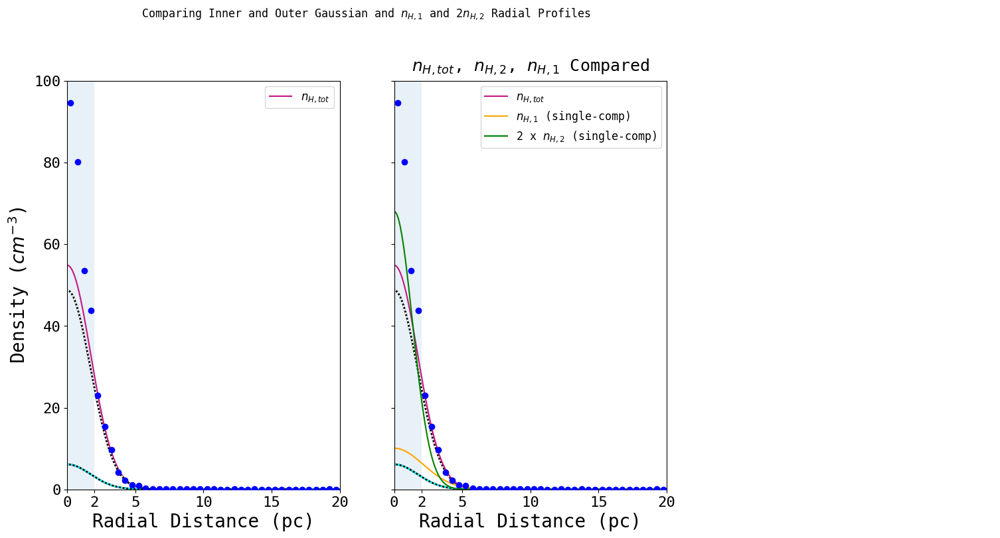


---------------------------
-- Finished
---------------------------



In [18]:
run(file_name_skeleton,file_name_nhtot,designation,
       ball_size,threshold_level,k_num,shift,a1_max_ratio,
       s1_std_ratio,a2_a1_ratio,s2_s1_ratio,start_index,
       colormap_log,paper_or_no,Zucker_or_no,core_check,threshold_core,
       data,header,data_shape)

# Make the Data Tables

In [21]:
t = make_table_row(file_name_skeleton,threshold_level,data,designation,
                      shift,False,threshold_core,False)
t.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?
0,x1470y1400z1400,nht,35.0,0,65,5857,50.0,0.71,24.0,2.0,67.0,1.1,3.3e-07,0.39,32.0,1.1,3.8,0.39,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,False,---,False
1,x1470y1400z1400,nht,35.0,1,36,2294,73.0,1.2,17.0,2.0,88.0,1.4,3.8e-07,0.76,38.0,1.2,6.3,0.76,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,False,---,False


In [22]:
if core_check == True:
    t = make_table_row(file_name_skeleton,threshold_level,data,designation,
                      shift,True,threshold_core,False)
t.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?
0,x1470y1400z1400,nht,35.0,0,65,5857,69.0,0.83,33.0,1.8,98.0,1.1,2.3e-06,0.42,46.0,1.1,5.1,0.42,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,True,> 35,False
1,x1470y1400z1400,nht,35.0,1,36,2294,64.0,1.1,32.0,2.0,93.0,1.4,5.1e-07,0.68,40.0,1.3,6.3,0.68,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,True,> 35,False


In [ ]:
if Zucker_or_no == True:
    t = make_table_row(file_name_skeleton,threshold_level,data,designation,
                      shift,True,threshold_core,True)
t.show_in_notebook()

idx,Designation,Thresholded By (cm^-3),Threshold Level (cm^-3),Skeleton Index,Length (pc),Mass (Solar),NHTOT a1,NHTOT sigma 1,NHTOT a2,NHTOT sigma 2,NHTOT a,NHTOT sigma,NCO a,NCO sigma,NH2 a,NH2 sigma,NH1 a,NH1 sigma,NHTOT Max (cm^-3),NHTOT Median (cm^-3),NHTOT Mean (cm^-3),NCO Max (cm^-3),NCO Median (cm^-3),NCO Mean (cm^-3),NH2 Max (cm^-3),NH2 Median (cm^-3),NH2 Mean (cm^-3),NH1 Max (cm^-3),NH1 Median (cm^-3),NH1 Mean (cm^-3),CO Dark?,Molecular?,Atomic?,Core Shifted?,Core Thresholded?,Thresholded Core (cm^-3),First 2 pc ignored?
0,x1470y1400z1400,nht,35.0,0,65,5857,34.0,1.7e-05,7.8e-07,8e-06,33.0,1.8,1.8e-07,0.79,16.0,1.7,2.7,0.79,380.0,46.0,77.0,0.00046,6.4e-08,2e-05,180.0,21.0,36.0,18.0,3.6,4.9,True,True,False,False,True,> 35,True
1,x1470y1400z1400,nht,35.0,1,36,2294,49.0,1.7,6.1,1.7,55.0,1.7,1.8e-07,0.77,34.0,1.3,10.0,0.77,9600.0,79.0,420.0,1.3,2.9e-07,0.048,4800.0,38.0,210.0,23.0,4.7,8.4,True,True,False,False,True,> 35,True
